Join the map (drugname_norm, rxcui result) back to the original drug table for further analysis

In [1]:
import duckdb, pandas as pd

FAERS_DB = "/home/zchu/FAERS/my.db"

# Reuse same DuckDB connection or create a new one
con = duckdb.connect()
con.execute("INSTALL sqlite; LOAD sqlite;")
con.execute(f"ATTACH '{FAERS_DB}' AS sqldb (TYPE SQLITE, READ_ONLY TRUE);")

In [2]:
import pandas as pd
import duckdb

db = "/home/zchu/FAERS/my.db"
con = duckdb.connect(db, read_only=True)

# 1. Raw distinct drug names
raw = con.execute("SELECT COUNT(DISTINCT drugname) FROM drug").fetchone()[0]
print(f"Raw distinct drugname: {raw}")

# 1b. After UPPER(TRIM(...)) normalization
normed = con.execute("SELECT COUNT(DISTINCT UPPER(TRIM(drugname))) FROM drug").fetchone()[0]
print(f"After UPPER(TRIM): {normed}")

# 2. Check what's in the mapping parquet files
rx_map = pd.read_parquet("/home/zchu/FAERS/cleaned_input.parquet")
print(f"\ncleaned_input columns: {rx_map.columns.tolist()}")
print(f"cleaned_input rows: {rx_map.shape[0]}")
print(rx_map.head())

con.close()

Raw distinct drugname: 608389
After UPPER(TRIM): 496561

cleaned_input columns: ['drugname_norm', 'rxcui_best', 'rxnorm_name_best', 'tty_best', 'score', 'ingredient_rxcui', 'ingredient_name', 'ingredients_json', 'accepted_by', 'token_pass', 'second_best_score', 'best_minus_second', 'cand_count', 'error_detail']
cleaned_input rows: 496562
                                   drugname_norm rxcui_best rxnorm_name_best  \
0                                         CAPTEA       None             None   
1                                      RIVASTACH       None             None   
2                                     COVERDILOL       None             None   
3  LIPIREX                            /00499301/       None             None   
4                                   HAEMOPROTECT       None             None   

  tty_best  score ingredient_rxcui ingredient_name ingredients_json  \
0     None    NaN             None            None             None   
1     None    NaN             None   

In [3]:
rx_map = pd.read_parquet("/home/zchu/FAERS/cleaned_input.parquet")

# Count by accepted_by
print(rx_map["accepted_by"].value_counts())

# Accepted = score >= 9.0
accepted = rx_map[rx_map["accepted_by"] == ">=min"].shape[0]
rejected = rx_map[rx_map["accepted_by"] != ">=min"].shape[0]
total = rx_map.shape[0]



print(f"\nTotal: {total}")
print(f"Accepted: {accepted} ({100*accepted/total:.1f}%)")
print(f"Rejected: {rejected} ({100*rejected/total:.1f}%)")

accepted_by
>=min                     368814
rejected_low_score         85418
rejected_no_candidates     42325
error                          5
Name: count, dtype: int64

Total: 496562
Accepted: 368814 (74.3%)
Rejected: 127748 (25.7%)


In [4]:
# Directly query SQLite catalog for table names
con = duckdb.connect()
con.execute("INSTALL sqlite; LOAD sqlite;")
con.execute(f"ATTACH '{FAERS_DB}' AS sqldb (TYPE SQLITE, READ_ONLY TRUE);")
print(con.execute("SELECT name, type FROM main.sqlite_master WHERE type='table';").fetchdf())


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

      name   type
0     demo  table
1     drug  table
2     reac  table
3     outc  table
4     rpsr  table
5     ther  table
6     indi  table
7  ing_map  table


In [5]:
import duckdb, pandas as pd

INPUT = '/home/zchu/FAERS/cleaned_input.parquet'
IS_CSV = INPUT.endswith('.csv')

read_stmt = f"read_csv_auto('{INPUT}')" if IS_CSV else f"read_parquet('{INPUT}')"

query = f"""
WITH src AS (
  SELECT t.*, COALESCE(t.ingredients_json, '[]') AS j
  FROM {read_stmt} AS t
),
lens AS (
  -- Cast UBIGINT -> BIGINT and guard nulls
  SELECT s.*, COALESCE(CAST(json_array_length(s.j) AS BIGINT), 0) AS n
  FROM src s
),
idx AS (
  -- One row per array index: 0..n-1
  SELECT l.*, i AS pos
  FROM lens l,
       UNNEST(range(l.n)) AS x(i)
),
exploded AS (
  SELECT
    idx.*,
    -- Build JSONPath strings without format(): '$[' || pos || '].field'
    json_extract_string(idx.j, '$[' || CAST(idx.pos AS VARCHAR) || '].name')  AS ingredient_name,
    json_extract_string(idx.j, '$[' || CAST(idx.pos AS VARCHAR) || '].rxcui') AS ingredient_rxcui
  FROM idx
),
deduped AS (
  SELECT * EXCLUDE (rn, j, pos, n) FROM (
    SELECT
      e.*,
      ROW_NUMBER() OVER (
        PARTITION BY drugname_norm, ingredient_rxcui, ingredient_name
        ORDER BY drugname_norm
      ) AS rn
    FROM exploded e
  ) q
  WHERE rn = 1
)
SELECT * FROM deduped
"""

exploded_df = con.execute(query).fetchdf()
exploded_df.head(), len(exploded_df)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

(      drugname_norm rxcui_best rxnorm_name_best tty_best      score  \
 0     'LEVOTHYROXIN      10582    levothyroxine       IN  10.761137   
 1        (ATENOLOL)       1202         atenolol       IN  12.375685   
 2        (DIAZEPAM)       3322         diazepam       IN  11.923899   
 3  (L-ASPARAGINASE)       1156     asparaginase       IN  23.698441   
 4        (RAMIPRIL)      35296         ramipril       IN  12.894831   
 
   ingredient_rxcui ingredient_name  \
 0            10582   levothyroxine   
 1             1202        atenolol   
 2             3322        diazepam   
 3             1156    asparaginase   
 4            35296        ramipril   
 
                                 ingredients_json accepted_by  token_pass  \
 0  [{"name": "levothyroxine", "rxcui": "10582"}]       >=min        <NA>   
 1        [{"name": "atenolol", "rxcui": "1202"}]       >=min        <NA>   
 2        [{"name": "diazepam", "rxcui": "3322"}]       >=min        <NA>   
 3    [{"name": "aspar

In [6]:
# Register exploded_df (from the explosion query above) as a DuckDB view
con.register("exploded", exploded_df)

A reusable string cleaner

In [7]:
# SQL macro to normalize strings
con.execute(r"""
CREATE OR REPLACE MACRO clean_str(s) AS
  lower(
    regexp_replace(                                  -- collapse spaces
      regexp_replace(                                -- remove non-alnum/non-space
        coalesce(s,''), '[^[:alnum:][:space:]]+', ' ', 'g'
      ),
      '\s+', ' ', 'g'
    )
  );
""")

Parse FAERS dates that may be 8-digit YYYYMMDD or 6-digit YYYYMM; even numeric "201304.0". Returns DATE or NULL.

In [8]:
con.execute(r"""
CREATE OR REPLACE MACRO faers_parse_date(x) AS (
  CASE
    WHEN x IS NULL THEN NULL
    ELSE
      CASE
        WHEN
          LENGTH(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g')) >= 8
          AND TRY_CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),1,4) AS INTEGER) BETWEEN 1900 AND 2100
          AND TRY_CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),5,2) AS INTEGER) BETWEEN 1 AND 12
          AND TRY_CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),7,2) AS INTEGER) BETWEEN 1 AND 31
        THEN MAKE_DATE(
               CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),1,4) AS INTEGER),
               CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),5,2) AS INTEGER),
               CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),7,2) AS INTEGER)
             )

        WHEN
          LENGTH(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g')) >= 6
          AND TRY_CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),1,4) AS INTEGER) BETWEEN 1900 AND 2100
          AND TRY_CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),5,2) AS INTEGER) BETWEEN 1 AND 12
        THEN MAKE_DATE(
               CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),1,4) AS INTEGER),
               CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),5,2) AS INTEGER),
               1
             )

        WHEN
          LENGTH(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g')) >= 4
          AND TRY_CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),1,4) AS INTEGER) BETWEEN 1900 AND 2100
        THEN MAKE_DATE(
               CAST(SUBSTR(regexp_replace(CAST(x AS VARCHAR), '[^0-9]', '', 'g'),1,4) AS INTEGER),
               1, 1
             )

        ELSE NULL
      END
  END
);
""")

Normalized DRUG view (clean full names, also split on common delimiters)

In [9]:
con.execute("""
CREATE OR REPLACE VIEW drug_norm AS
SELECT d.*, UPPER(TRIM(d.DRUGNAME)) AS drugname_norm
FROM sqldb.main.DRUG d
WHERE d.DRUGNAME IS NOT NULL AND LENGTH(TRIM(d.DRUGNAME)) > 0;
""")

In [10]:
# Build a normalized DEMO view from the attached SQLite DB (sqldb.main.DEMO)
con.execute(r"""
CREATE OR REPLACE VIEW faers_norm AS
WITH demo_raw AS (
  SELECT
    CAST(d.PRIMARYID AS BIGINT)                                         AS primaryid,

    -- Dates can be strings or numbers in FAERS; cast to VARCHAR for the macro
    faers_parse_date(CAST(d.FDA_DT   AS VARCHAR))                       AS receipt_date,  -- when case enters FAERS
    faers_parse_date(CAST(d.EVENT_DT AS VARCHAR))                       AS event_date,    

    -- Normalize age to years based on AGE_COD
    CASE
      WHEN UPPER(d.AGE_COD)='YR' THEN TRY_CAST(d.AGE AS DOUBLE)
      WHEN UPPER(d.AGE_COD)='MO' THEN TRY_CAST(d.AGE AS DOUBLE) / 12.0
      WHEN UPPER(d.AGE_COD)='WK' THEN TRY_CAST(d.AGE AS DOUBLE) / 52.1429
      WHEN UPPER(d.AGE_COD)='DY' THEN TRY_CAST(d.AGE AS DOUBLE) / 365.25
      ELSE NULL
    END                                                               AS age_years,

    d.SEX                                                              AS sex,
    d.OCCP_COD                                                         AS occp_cod
  FROM sqldb.main.DEMO d
  WHERE d.PRIMARYID IS NOT NULL
)
SELECT * FROM demo_raw;
""")

Join exploded mapping → DRUG

In [11]:
con.execute(r"""
CREATE OR REPLACE VIEW drug_rx AS
SELECT
  dn.PRIMARYID::BIGINT                    AS primaryid,
  dn.CASEID                               AS caseid,
  dn.ROLE_COD                             AS role_cod,
  dn.DRUG_SEQ                             AS drug_seq,

  -- mapping fields from 'exploded'
  e.drugname_norm,
  e.rxcui_best,
  e.rxnorm_name_best,
  e.ingredient_rxcui,
  e.ingredient_name,
  e.score,
  e.accepted_by
FROM drug_norm dn
JOIN exploded e
  ON e.drugname_norm = dn.drugname_norm
WHERE COALESCE(e.accepted_by,'') = '>=min';
""")

Enrich mapped rows with normalized DEMO fields

In [12]:
con.execute(r"""
CREATE OR REPLACE VIEW drug_rx_enriched AS
SELECT
  rx.*,
  f.receipt_date,
  f.event_date,
  f.age_years,
  f.sex,
  f.occp_cod
FROM drug_rx rx
LEFT JOIN faers_norm f
  USING (primaryid);
""")

In [13]:
df_preview = con.execute("SELECT * FROM drug_rx_enriched LIMIT 5").fetchdf()
print("Columns:", df_preview.columns.tolist())
display(df_preview)

Columns: ['primaryid', 'caseid', 'role_cod', 'drug_seq', 'drugname_norm', 'rxcui_best', 'rxnorm_name_best', 'ingredient_rxcui', 'ingredient_name', 'score', 'accepted_by', 'receipt_date', 'event_date', 'age_years', 'sex', 'occp_cod']


,primaryid,caseid,role_cod,drug_seq,drugname_norm,rxcui_best,rxnorm_name_best,ingredient_rxcui,ingredient_name,score,accepted_by,receipt_date,event_date,age_years,sex,occp_cod
0,100036412,10003641,PS,1,DEPAKOTE,216459,Depakote,"216459,10312,316945,316995,1151131,1151133,402...","Depakote,Delayed Release Oral Tablet,Extended ...",13.821548,>=min,2015-03-12,2013-04-01,41.0,M,CN
1,100036412,10003641,C,2,INVEGA,686438,Invega,"686438,316945,721656,1151126,1151131,1151133,6...","Invega,Extended Release Oral Tablet,Prefilled ...",13.340466,>=min,2015-03-12,2013-04-01,41.0,M,CN
2,100036412,10003641,C,3,METFORMIN,6809,metformin,6809,metformin,11.203744,>=min,2015-03-12,2013-04-01,41.0,M,CN
3,100036412,10003641,C,4,BISOPROLOL,19484,bisoprolol,19484,bisoprolol,12.798693,>=min,2015-03-12,2013-04-01,41.0,M,CN
4,100036412,10003641,C,5,COGENTIN,151532,Cogentin,"151532,1649574,1151126,1424,18927,885207,88520...","Cogentin,Injection,Injectable Product,benztrop...",14.322450,>=min,2015-03-12,2013-04-01,41.0,M,CN


In [14]:
n_rows = con.execute("SELECT COUNT(*) AS n FROM drug_rx_enriched").fetchdf()
print("Number of rows:", int(n_rows['n'][0]))

Number of rows: 61124807


GLP-1 dictionary

In [15]:
# A compact GLP-1RA dictionary (ingredients + key brands & combos)
con.execute("""
CREATE OR REPLACE VIEW glp1ra_dict AS
SELECT *
FROM (VALUES
  ('semaglutide',      'rybelsus|ozempic|wegovy|nn9535'),
  ('liraglutide',      'victoza|saxenda|xultophy|nn2211'),
  ('exenatide',        'byetta|bydureon|ac2993'),
  ('dulaglutide',      'trulicity|ly2189265'),
  ('lixisenatide',     'adlyxin|lyxumia|zp10|hoe901|soliqua'),
  ('tirzepatide',      'mounjaro|zepbound|ly3298176'),  -- brand list evolves; adjust as needed
  ('albiglutide',      'tanzeum|eperzan|gsk716155'),
  ('efpeglenatide',      'hm12525a')
) AS t(ingredient, brands_regex);
""")

In [16]:
# Flatten to one term per row
con.execute(r"""
CREATE OR REPLACE VIEW glp1_terms AS
WITH base AS (
  SELECT ingredient AS term FROM glp1ra_dict
  UNION ALL
  SELECT UNNEST(regexp_split_to_array(brands_regex, '\|')) AS term
  FROM glp1ra_dict
  WHERE brands_regex <> ''
)
SELECT DISTINCT lower(trim(term)) AS term
FROM base
WHERE term IS NOT NULL AND trim(term) <> '';
""")

In [17]:
# Prefer PS/SS if they exist
roles = con.execute("""
    SELECT DISTINCT role_cod
    FROM drug_rx_enriched
""").fetchdf()["role_cod"].dropna().tolist()
print("Role codes present:", roles)

suspects = [r for r in roles if r in ("PS", "SS")]

if suspects:
    quoted = ",".join(f"'{r}'" for r in suspects)   # "'PS','SS'"
    role_filter_sql = f"WHERE rx.role_cod IN ({quoted})"
else:
    role_filter_sql = ""   # no filter

print("Role filter SQL:", role_filter_sql)

Role codes present: ['DN', 'I', 'C', 'PS', 'SS']
Role filter SQL: WHERE rx.role_cod IN ('PS','SS')


In [18]:
query = f"""
CREATE OR REPLACE VIEW glp1_hits_dynamic AS
SELECT DISTINCT rx.primaryid
FROM drug_rx_enriched rx
JOIN glp1_terms t
  ON lower(rx.ingredient_name) = t.term
     OR lower(rx.drugname_norm) LIKE '%' || t.term || '%'
{role_filter_sql};
"""

con.execute(query)

In [19]:
# Deduplicate per case (one row per primaryid)
con.execute(r"""
CREATE OR REPLACE VIEW glp1_cases_psss AS
SELECT
  rx.primaryid,
  MIN(rx.receipt_date) AS receipt_date,
  MIN(rx.event_date)   AS event_date,
  MIN(rx.age_years)    AS age_years,
  MIN(rx.sex)          AS sex,
  MIN(rx.occp_cod)     AS occp_cod
FROM drug_rx_enriched rx
JOIN glp1_hits_dynamic h USING(primaryid)
GROUP BY rx.primaryid;
""");

In [20]:
# ============================================================
# B4 corrected: GLP-1 RA-specific RxNorm mapping audit sample
# Run this AFTER cell 25 (needs `con`, `drug_rx_enriched`, `glp1_terms`)
# ============================================================
import pandas as pd
import numpy as np

SEED = 42
N_AUDIT = 200  # script will audit fewer if the GLP-1-tied pool is smaller

# ── 1. Pull every DISTINCT raw drug name that ITSELF matched the GLP-1 ──
# term dictionary (same matching condition used to build glp1_hits_dynamic),
# NOT every drug row belonging to a GLP-1-flagged case. Joining on primaryid
# alone would also pull in unrelated concomitant medications (e.g.
# carboplatin, sertraline) reported on the same FAERS case as a GLP-1 RA.
glp1_audit_pool = con.execute("""
    SELECT DISTINCT
        rx.drugname_norm,
        rx.score,
        rx.rxnorm_name_best,
        rx.ingredient_name,
        rx.accepted_by
    FROM drug_rx_enriched rx
    JOIN glp1_terms t
      ON lower(rx.ingredient_name) = t.term
         OR lower(rx.drugname_norm) LIKE '%' || t.term || '%'
""").fetchdf()

print(f"Total distinct raw drug-name rows matching the GLP-1 term dictionary: {len(glp1_audit_pool)}")
print("\naccepted_by distribution:")
print(glp1_audit_pool["accepted_by"].value_counts())
print(f"\nrxnorm_name_best missing (all accepted_by values): "
      f"{glp1_audit_pool['rxnorm_name_best'].isna().sum()}")

# ── 2. Keep only ACCEPTED mappings (the ones that actually feed the model) ──
accepted = glp1_audit_pool[glp1_audit_pool["accepted_by"] == ">=min"].copy()
print(f"\nAccepted GLP-1-tied mappings: {len(accepted)}")

# ── 3. Separate "no usable name returned" from gradable rows ──
accepted["has_rxnorm_name"] = accepted["rxnorm_name_best"].notna()
print("\nhas_rxnorm_name distribution (within accepted GLP-1-tied mappings):")
print(accepted["has_rxnorm_name"].value_counts())

no_name_rate = 1 - accepted["has_rxnorm_name"].mean()
print(f"\nGLP-1-tied 'accepted but no usable rxnorm_name_best' rate: {no_name_rate:.1%}")
print("(This rate should be reported as its own disclosed finding, separate")
print(" from the correct/incorrect precision breakdown below, since these")
print(" rows have no rxnorm_name_best to grade against drugname_norm.)")

# ── 4. Stratify by score, only within gradable rows ──
gradable = accepted[accepted["has_rxnorm_name"]].copy()

if len(gradable) == 0:
    raise RuntimeError(
        "No gradable (has_rxnorm_name=True) GLP-1-tied accepted mappings found. "
        "Check that drug_rx_enriched and glp1_terms are populated correctly."
    )

gradable["stratum"] = np.where(
    (gradable["score"] >= 9.0) & (gradable["score"] < 9.5), "9.0-9.5",
    np.where(gradable["score"] >= 9.5, "9.5-10.0", "other")
)

n_sample = min(N_AUDIT, len(gradable))
if n_sample < N_AUDIT:
    print(f"\nNOTE: only {len(gradable)} gradable GLP-1-tied mappings exist; "
          f"auditing all {n_sample} rather than {N_AUDIT}.")

rng = np.random.default_rng(SEED)
strata = [s for s in ["9.0-9.5", "9.5-10.0"] if (gradable["stratum"] == s).sum() > 0]
counts = gradable["stratum"].value_counts()
proportions = {s: counts[s] / counts[strata].sum() for s in strata}
alloc = {s: max(1, round(proportions[s] * n_sample)) for s in strata}
diff = n_sample - sum(alloc.values())
if diff != 0:
    largest = max(alloc, key=alloc.get)
    alloc[largest] += diff

print("\nAudit sample allocation:")
for s, n in alloc.items():
    print(f"  {s}: {n} mappings")

# ── 5. Draw the stratified sample ──
samples = []
for s, n in alloc.items():
    pool = gradable[gradable["stratum"] == s]
    n_draw = min(n, len(pool))
    samples.append(pool.sample(n=n_draw, random_state=SEED))

glp1_audit_sample = (
    pd.concat(samples, ignore_index=True)
    .sample(frac=1, random_state=SEED)
    .reset_index(drop=True)
)

glp1_audit_sample["reviewer_judgment"] = ""   # correct / partially correct / incorrect
glp1_audit_sample["reviewer_notes"] = ""

out_path = "glp1_rxnorm_mapping_audit_sample_1.csv"
glp1_audit_sample.to_csv(out_path, index=False)

print(f"\nWrote {len(glp1_audit_sample)} rows to {out_path}")
print("\nSample of drugname_norm values (should be GLP-1 RA brand/generic names):")
print(glp1_audit_sample["drugname_norm"].head(15).to_string())

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Total distinct raw drug-name rows matching the GLP-1 term dictionary: 505

accepted_by distribution:
accepted_by
>=min    505
Name: count, dtype: int64

rxnorm_name_best missing (all accepted_by values): 0

Accepted GLP-1-tied mappings: 505

has_rxnorm_name distribution (within accepted GLP-1-tied mappings):
has_rxnorm_name
True    505
Name: count, dtype: int64

GLP-1-tied 'accepted but no usable rxnorm_name_best' rate: 0.0%
(This rate should be reported as its own disclosed finding, separate
 from the correct/incorrect precision breakdown below, since these
 rows have no rxnorm_name_best to grade against drugname_norm.)

Audit sample allocation:
  9.0-9.5: 1 mappings
  9.5-10.0: 199 mappings

Wrote 200 rows to glp1_rxnorm_mapping_audit_sample_1.csv

Sample of drugname_norm values (should be GLP-1 RA brand/generic names):
0     SEMAGLUTIDE, 0.25 OR 0.5MG/DOS, 2 MG/3ML SOLUT...
1                                            VICTOZA S2
2                                     NEURONTIN OZEMPI

In [ ]:
# ============================================================
# B4 corrected: GLP-1 RA-specific RxNorm mapping audit sample
# Run this AFTER cell 25 (needs `con`, `drug_rx_enriched`, `glp1_terms`)
# ============================================================
import pandas as pd
import numpy as np

SEED = 123
N_AUDIT = 200  # script will audit fewer if the GLP-1-tied pool is smaller

# ── 1. Pull every DISTINCT raw drug name that ITSELF matched the GLP-1 ──
# term dictionary (same matching condition used to build glp1_hits_dynamic),
# NOT every drug row belonging to a GLP-1-flagged case. Joining on primaryid
# alone would also pull in unrelated concomitant medications (e.g.
# carboplatin, sertraline) reported on the same FAERS case as a GLP-1 RA.
glp1_audit_pool = con.execute("""
    SELECT DISTINCT
        rx.drugname_norm,
        rx.score,
        rx.rxnorm_name_best,
        rx.ingredient_name,
        rx.accepted_by
    FROM drug_rx_enriched rx
    JOIN glp1_terms t
      ON lower(rx.ingredient_name) = t.term
         OR lower(rx.drugname_norm) LIKE '%' || t.term || '%'
""").fetchdf()

print(f"Total distinct raw drug-name rows matching the GLP-1 term dictionary: {len(glp1_audit_pool)}")
print("\naccepted_by distribution:")
print(glp1_audit_pool["accepted_by"].value_counts())
print(f"\nrxnorm_name_best missing (all accepted_by values): "
      f"{glp1_audit_pool['rxnorm_name_best'].isna().sum()}")

# ── 2. Keep only ACCEPTED mappings (the ones that actually feed the model) ──
accepted = glp1_audit_pool[glp1_audit_pool["accepted_by"] == ">=min"].copy()
print(f"\nAccepted GLP-1-tied mappings: {len(accepted)}")

# ── 3. Separate "no usable name returned" from gradable rows ──
accepted["has_rxnorm_name"] = accepted["rxnorm_name_best"].notna()
print("\nhas_rxnorm_name distribution (within accepted GLP-1-tied mappings):")
print(accepted["has_rxnorm_name"].value_counts())

no_name_rate = 1 - accepted["has_rxnorm_name"].mean()
print(f"\nGLP-1-tied 'accepted but no usable rxnorm_name_best' rate: {no_name_rate:.1%}")
print("(This rate should be reported as its own disclosed finding, separate")
print(" from the correct/incorrect precision breakdown below, since these")
print(" rows have no rxnorm_name_best to grade against drugname_norm.)")

# ── 4. Stratify by score, only within gradable rows ──
gradable = accepted[accepted["has_rxnorm_name"]].copy()

if len(gradable) == 0:
    raise RuntimeError(
        "No gradable (has_rxnorm_name=True) GLP-1-tied accepted mappings found. "
        "Check that drug_rx_enriched and glp1_terms are populated correctly."
    )

gradable["stratum"] = np.where(
    (gradable["score"] >= 9.0) & (gradable["score"] < 9.5), "9.0-9.5",
    np.where(gradable["score"] >= 9.5, "9.5-10.0", "other")
)

n_sample = min(N_AUDIT, len(gradable))
if n_sample < N_AUDIT:
    print(f"\nNOTE: only {len(gradable)} gradable GLP-1-tied mappings exist; "
          f"auditing all {n_sample} rather than {N_AUDIT}.")

rng = np.random.default_rng(SEED)
strata = [s for s in ["9.0-9.5", "9.5-10.0"] if (gradable["stratum"] == s).sum() > 0]
counts = gradable["stratum"].value_counts()
proportions = {s: counts[s] / counts[strata].sum() for s in strata}
alloc = {s: max(1, round(proportions[s] * n_sample)) for s in strata}
diff = n_sample - sum(alloc.values())
if diff != 0:
    largest = max(alloc, key=alloc.get)
    alloc[largest] += diff

print("\nAudit sample allocation:")
for s, n in alloc.items():
    print(f"  {s}: {n} mappings")

# ── 5. Draw the stratified sample ──
samples = []
for s, n in alloc.items():
    pool = gradable[gradable["stratum"] == s]
    n_draw = min(n, len(pool))
    samples.append(pool.sample(n=n_draw, random_state=SEED))

glp1_audit_sample = (
    pd.concat(samples, ignore_index=True)
    .sample(frac=1, random_state=SEED)
    .reset_index(drop=True)
)

glp1_audit_sample["reviewer_judgment"] = ""   # correct / partially correct / incorrect
glp1_audit_sample["reviewer_notes"] = ""

out_path = "glp1_rxnorm_mapping_audit_sample_2.csv"
glp1_audit_sample.to_csv(out_path, index=False)

print(f"\nWrote {len(glp1_audit_sample)} rows to {out_path}")
print("\nSample of drugname_norm values (should be GLP-1 RA brand/generic names):")
print(glp1_audit_sample["drugname_norm"].head(15).to_string())

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Total distinct raw drug-name rows matching the GLP-1 term dictionary: 505

accepted_by distribution:
accepted_by
>=min    505
Name: count, dtype: int64

rxnorm_name_best missing (all accepted_by values): 0

Accepted GLP-1-tied mappings: 505

has_rxnorm_name distribution (within accepted GLP-1-tied mappings):
has_rxnorm_name
True    505
Name: count, dtype: int64

GLP-1-tied 'accepted but no usable rxnorm_name_best' rate: 0.0%
(This rate should be reported as its own disclosed finding, separate
 from the correct/incorrect precision breakdown below, since these
 rows have no rxnorm_name_best to grade against drugname_norm.)

Audit sample allocation:
  9.0-9.5: 1 mappings
  9.5-10.0: 199 mappings

Wrote 200 rows to glp1_rxnorm_mapping_audit_sample.csv

Sample of drugname_norm values (should be GLP-1 RA brand/generic names):
0                                      SEMAGLUTIDE 3 MG
1     TRULICITY SUBCUTANEOUS SOLUTION PEN-INJECTOR 0...
2             TRULICITY PEN 0.75/0.5 ML SUBCUT SOLUTION


Total PS/SS GLP1 cases With RxNorm API Mapping

In [ ]:
display(con.execute("""
SELECT COUNT(*) AS total_glp1_psss_cases
FROM glp1_cases_psss;
""").fetchdf())

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,total_glp1_psss_cases
0,250093


Age distribution

In [18]:
age_psss = con.execute(r"""
SELECT band AS age_band, COUNT(*) AS total_count
FROM (
  SELECT CASE
           WHEN age_years IS NULL THEN 'missing'
           WHEN age_years < 18      THEN '<18'
           WHEN age_years < 65      THEN '18-64'
           ELSE '>=65'
         END AS band
  FROM glp1_cases_psss
)
GROUP BY 1
ORDER BY CASE band
           WHEN '<18'   THEN 1
           WHEN '18-64' THEN 2
           WHEN '>=65'  THEN 3
           ELSE 4
         END;
""").fetchdf()
display(age_psss)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,age_band,total_count
0,<18,222
1,18-64,87735
2,>=65,43421
3,missing,118715


Patient Sex

In [19]:
sex = con.execute("""
SELECT
  CASE UPPER(sex)
    WHEN 'M' THEN 'Male'
    WHEN 'F' THEN 'Female'
    ELSE 'Unknown'
  END AS patient_sex,
  COUNT(*) AS total_count
FROM glp1_cases_psss
GROUP BY 1
ORDER BY 1;
""").fetchdf()
display(sex)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,patient_sex,total_count
0,Female,148091
1,Male,78736
2,Unknown,23266


Reporter code (Healthcare professional / Lawyer / Consumer / Sales / Unspecified)

In [20]:
reporter = con.execute("""
SELECT
  CASE UPPER(occp_cod)
    WHEN 'MD' THEN 'Healthcare professional'
    WHEN 'PH' THEN 'Healthcare professional'
    WHEN 'OT' THEN 'Healthcare professional'
    WHEN 'LW' THEN 'Lawyer'
    WHEN 'CN' THEN 'Consumer'
    ELSE 'Unspecified'
  END AS reporter_code,
  COUNT(*) AS total_count
FROM glp1_cases_psss
GROUP BY 1
ORDER BY 1;
""").fetchdf()
display(reporter)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,reporter_code,total_count
0,Consumer,200358
1,Healthcare professional,30561
2,Lawyer,1240
3,Unspecified,17934


Outcomes (CA, DE, DS, HO, LT, RI, OT)

Also only serious AEs have their outcome code filled; non-serious AE outcome code missing

In [21]:
# Outcomes: if multiple outcomes occurred for the same AE case, it will be lined
# Handled with standardization
# Normalize + explode OUTC, then de-dup (per primaryid, per code)
con.execute(r"""
CREATE OR REPLACE VIEW outc_dedup AS
WITH raw AS (
  SELECT
    CAST(o.PRIMARYID AS BIGINT)                 AS primaryid,
    UPPER(CAST(o.OUTC_COD AS VARCHAR))          AS raw_code
  FROM sqldb.main.OUTC o
),
exploded AS (                                    -- split on any non-letters (commas, spaces, pipes, etc.)
  SELECT
    primaryid,
    code AS outc_cod
  FROM raw,
       UNNEST(regexp_split_to_array(COALESCE(raw_code,''), '[^A-Z]+')) AS t(code)
  WHERE code <> ''
)
SELECT DISTINCT primaryid, outc_cod           -- de-duplicate per case/code
FROM exploded;
""")



In [22]:
# Outcome distribution for the GLP-1 PS/SS cohort (glp1_cases_psss)
outcomes_glp1 = con.execute(r"""
WITH cohort AS (
  SELECT DISTINCT primaryid FROM glp1_cases_psss
),
coded AS (
  SELECT d.*
  FROM outc_dedup d
  JOIN cohort c USING(primaryid)
),
dist AS (                                       -- only cases that have at least one outcome code
  SELECT
    CASE outc_cod
      WHEN 'DE' THEN 'Death'
      WHEN 'LT' THEN 'Life threatening'
      WHEN 'HO' THEN 'Hospitalization'
      WHEN 'DS' THEN 'Disability'
      WHEN 'CA' THEN 'Congenital anomaly'
      WHEN 'RI' THEN 'Required intervention to prevent permanent impairment'
      WHEN 'OT' THEN 'Other serious (important medical event)'
      ELSE 'Other'
    END AS outcome,
    COUNT(*) AS total_count
  FROM coded
  GROUP BY 1
),
no_code AS (                                    -- GLP-1 cases with no OUTC record at all (non-serious typically)
  SELECT 'No outcome code' AS outcome,
         COUNT(*) AS total_count
  FROM cohort c
  LEFT JOIN (SELECT DISTINCT primaryid FROM outc_dedup) d USING(primaryid)
  WHERE d.primaryid IS NULL
)
SELECT * FROM dist
UNION ALL
SELECT * FROM no_code
ORDER BY outcome;
""").fetchdf()

display(outcomes_glp1)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,outcome,total_count
0,Congenital anomaly,89
1,Death,4116
2,Disability,2336
3,Hospitalization,26462
4,Life threatening,2985
5,No outcome code,184390
6,Other serious (important medical event),43005
7,Required intervention to prevent permanent imp...,758


In [23]:
# Cases with at least 1 outcome code (= serious)
serious_count = con.execute(r"""
  SELECT COUNT(DISTINCT c.primaryid) AS n_serious
  FROM glp1_cases_psss c
  JOIN outc_dedup o USING(primaryid)
""").fetchdf()

# Total cohort
total_count = con.execute(r"""
  SELECT COUNT(DISTINCT primaryid) AS n_total
  FROM glp1_cases_psss
""").fetchdf()

n_serious = int(serious_count['n_serious'][0])
n_total = int(total_count['n_total'][0])
n_nonserious = n_total - n_serious

print(f"Total cases: {n_total}")
print(f"Serious (≥1 OUTC code): {n_serious} ({100*n_serious/n_total:.1f}%)")
print(f"Non-serious (no OUTC): {n_nonserious} ({100*n_nonserious/n_total:.1f}%)")

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Total cases: 250093
Serious (≥1 OUTC code): 65703 (26.3%)
Non-serious (no OUTC): 184390 (73.7%)


Indications (T1D, T2D, Obesity, CVD, Others, Unknown)

In [ ]:
# Reads FAERS INDI table from the attached SQLite DB (sqldb.main.INDI)
# Coalesces multiple indication rows per case into ONE bucket by priority
# Joins only to deduped GLP1 PS/SS cohort: glp1_cases_psss

indications = con.execute(r"""
WITH raw AS (
  SELECT
    CAST(primaryid AS BIGINT)                 AS primaryid,
    lower(coalesce(indi_pt, ''))              AS indi_text
  FROM sqldb.main.INDI
),
-- classify each INDI row to a coarse bucket
classified AS (
  SELECT
    primaryid,
    CASE
      WHEN indi_text = '' THEN 'Unknown'
      -- type 1 diabetes
      WHEN regexp_matches(indi_text, 'type\s*1') THEN 'Type 1 Diabetes'
      -- type 2 diabetes (add common synonyms/abbrevs)
      WHEN regexp_matches(indi_text, 'type\s*2')
           OR indi_text LIKE '%type ii%'
           OR indi_text LIKE '%t2dm%'             THEN 'Type 2 Diabetes'
      -- obesity / overweight
      WHEN indi_text LIKE '%obes%' OR indi_text LIKE '%overweight%' THEN 'Obesity'
      -- cardiovascular disease umbrella (broad yet targeted terms)
      WHEN indi_text LIKE '%cardio%' OR indi_text LIKE '%ischemi%' OR
           indi_text LIKE '%coronary%' OR indi_text LIKE '%heart failure%' OR
           indi_text LIKE '%cvd%' OR indi_text LIKE '%myocard%' OR
           indi_text LIKE '%stroke%'              THEN 'Cardiovascular disease'
      ELSE 'Others'
    END AS bucket
  FROM raw
),
-- choose ONE bucket per case using a stable priority
ranked AS (
  SELECT
    primaryid,
    bucket,
    CASE bucket
      WHEN 'Type 1 Diabetes'        THEN 1
      WHEN 'Type 2 Diabetes'        THEN 2
      WHEN 'Obesity'                THEN 3
      WHEN 'Cardiovascular disease' THEN 4
      WHEN 'Others'                 THEN 5
      ELSE                               6   -- Unknown
    END AS prio
  FROM classified
),
chosen AS (
  SELECT primaryid, bucket
  FROM (
    SELECT
      primaryid, bucket,
      ROW_NUMBER() OVER (PARTITION BY primaryid ORDER BY prio) AS rn
    FROM ranked
  ) t
  WHERE rn = 1
),
-- PS/SS GLP1 cohort (one row per case)
cohort AS (
  SELECT primaryid FROM glp1_cases_psss
)
SELECT
  COALESCE(ch.bucket, 'Unknown') AS indication,
  COUNT(*)                       AS total_count
FROM cohort c
LEFT JOIN chosen ch USING (primaryid)
GROUP BY 1
ORDER BY total_count DESC, indication
""").fetchdf()

display(indications)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,indication,total_count
0,Others,160390
1,Type 2 Diabetes,77981
2,Unknown,6571
3,Obesity,3933
4,Type 1 Diabetes,1010
5,Cardiovascular disease,208


Market windows (start/end per brand)

Market windows (U.S.). End date NULL = still on market; we clip to 2025-04-28 later.

In [27]:
# Catalog of GLP-1 agents (label + start/end + brand tokens)
con.execute(r"""
CREATE OR REPLACE VIEW glp1_agent_catalog AS
SELECT agent_key, agent_label,
       CAST(start_date AS DATE) AS start_date,
       CAST(end_date   AS DATE) AS end_date,
       brand_terms
FROM (VALUES
  -- Semaglutide
  ('semaglutide_ozempic',  'Semaglutide (Ozempic)',      '2017-12-01', NULL, 'ozempic'),
  ('semaglutide_rybelsus', 'Semaglutide (Rybelsus)',     '2019-09-01', NULL, 'rybelsus'),

  -- Liraglutide (mono + combo)
  ('liraglutide_victoza',  'Liraglutide (Victoza)',      '2010-01-01', NULL, 'victoza'),
  ('liraglutide_saxenda',  'Liraglutide (Saxenda)',      '2014-12-01', NULL, 'saxenda'),
  ('liraglutide_xultophy', 'Insulin degludec + liraglutide (Xultophy)', '2016-11-01', NULL, 'xultophy'),

  -- Exenatide
  ('exenatide_byetta',     'Exenatide (Byetta)',         '2005-04-01', NULL, 'byetta'),
  ('exenatide_bydureon',   'Exenatide (Bydureon)',       '2012-01-01', NULL, 'bydureon'),

  -- Dulaglutide
  ('dulaglutide_trulicity','Dulaglutide (Trulicity)',    '2014-09-01', NULL, 'trulicity'),

  -- Lixisenatide (mono + combo)
  ('lixisenatide_adlyxin', 'Lixisenatide (Adlyxin)',     '2016-07-01', NULL, 'adlyxin'),
  ('lixisenatide_soliqua', 'Insulin glargine + lixisenatide (Soliqua)', '2016-11-01', NULL, 'soliqua'),

  -- Tirzepatide
  ('tirzepatide_mounjaro', 'Tirzepatide (Mounjaro)',     '2022-05-01', NULL, 'mounjaro'),
  ('tirzepatide_zepbound', 'Tirzepatide (Zepbound)',     '2023-11-01', NULL, 'zepbound'),

  -- Albiglutide
  ('albiglutide_tanzeum',  'Albiglutide (Tanzeum)',      '2014-04-01', '2018-07-31', 'tanzeum')
) AS t(agent_key, agent_label, start_date, end_date, brand_terms);
""")

Map brand tokens → agent_key (explode brand_terms)

In [28]:
con.execute(r"""
CREATE OR REPLACE VIEW drug_names_raw AS
WITH src AS (
  SELECT
    CAST(primaryid AS BIGINT) AS primaryid,
    UPPER(role_cod)           AS role_cod,
    lower(coalesce(rxnorm_name_best,'')) AS nm1,
    lower(coalesce(drugname_norm,''))    AS nm2
  FROM drug_rx_enriched
),
unioned AS (
  SELECT primaryid, role_cod, nm1 AS name_raw FROM src
  UNION ALL
  SELECT primaryid, role_cod, nm2 FROM src
)
SELECT primaryid, role_cod, name_raw
FROM unioned
WHERE name_raw IS NOT NULL AND trim(name_raw) <> '';
""")

In [ ]:
con.execute(r"""
-- Map each agent_key to a molecule family for dedupe (extend if add molecules)
CREATE OR REPLACE VIEW glp1_agent_term_map AS
SELECT
  c.agent_key,
  c.agent_label,
  CASE
    WHEN c.agent_key LIKE 'semaglutide_%'  THEN 'semaglutide'
    WHEN c.agent_key LIKE 'tirzepatide_%'  THEN 'tirzepatide'
    WHEN c.agent_key LIKE 'liraglutide_%'  THEN 'liraglutide'
    WHEN c.agent_key LIKE 'exenatide_%'    THEN 'exenatide'
    WHEN c.agent_key LIKE 'dulaglutide_%'  THEN 'dulaglutide'
    WHEN c.agent_key LIKE 'lixisenatide_%' THEN 'lixisenatide'
    WHEN c.agent_key LIKE 'albiglutide_%'  THEN 'albiglutide'
    ELSE NULL
  END AS molecule,
  lower(trim(term)) AS term
FROM glp1_agent_catalog c,
     UNNEST(regexp_split_to_array(c.brand_terms, '\|')) AS t(term)
WHERE term IS NOT NULL AND trim(term) <> '';
""")

Build molecule windows as the union of brand/agent windows

In [ ]:
con.execute(r"""
-- For each molecule, use the min start and max end of all its agents in catalog
CREATE OR REPLACE VIEW glp1_molecule_windows AS
SELECT
  m.molecule,
  MIN(c.start_date)                                   AS start_date,
  MAX(COALESCE(c.end_date, DATE '2025-04-28'))        AS end_date
FROM glp1_agent_term_map m
JOIN glp1_agent_catalog c USING (agent_key)
GROUP BY 1;

-- Also keep clipped per-agent windows (analysis range)
CREATE OR REPLACE VIEW glp1_agent_window_clipped AS
SELECT
  c.agent_key,
  c.agent_label,
  GREATEST(DATE '2015-01-01', c.start_date)                                   AS start_date,
  LEAST   (DATE '2025-04-28', COALESCE(c.end_date, DATE '2025-04-28'))        AS end_date
FROM glp1_agent_catalog c;

-- Clipped molecule windows (same analysis range)
CREATE OR REPLACE VIEW glp1_molecule_window_clipped AS
SELECT
  w.molecule,
  GREATEST(DATE '2015-01-01', w.start_date)                                    AS start_date,
  LEAST   (DATE '2025-04-28', COALESCE(w.end_date, DATE '2025-04-28'))         AS end_date
FROM glp1_molecule_windows w;
""")


Build brand-level hits (token equality); prefer PS/SS if present

PS/SS brand hits → filter by agent windows → dedupe per (primaryid, molecule)

In [ ]:
con.execute(r"""
-- Brand hits from names (PS/SS only), then attach agent & molecule, and filter to agent window via receipt_date
CREATE OR REPLACE VIEW glp1_brand_hits_windowed AS
WITH raw_hits AS (
  SELECT DISTINCT
    d.primaryid,
    atm.agent_key,
    atm.molecule
  FROM drug_names_raw d
  JOIN glp1_agent_term_map atm
    ON d.name_raw LIKE '%' || atm.term || '%'
  WHERE d.role_cod IN ('PS','SS')
),
dated AS (
  SELECT rh.*, fn.receipt_date
  FROM raw_hits rh
  JOIN faers_norm fn USING (primaryid)
),
windowed AS (
  SELECT d.*
  FROM dated d
  JOIN glp1_agent_window_clipped w USING (agent_key)
  WHERE d.receipt_date BETWEEN w.start_date AND w.end_date
)
SELECT DISTINCT primaryid, agent_key, molecule
FROM windowed;
""")

PS/SS generic hits (only “semaglutide” / “tirzepatide”) → filter by molecule window

In [32]:
con.execute(r"""
-- Generic tokens to look for
CREATE OR REPLACE VIEW glp1_generic_terms AS
SELECT * FROM (VALUES
  ('semaglutide','semaglutide'),
  ('tirzepatide','tirzepatide')
) AS t(molecule, term);

-- Generic hits from names (PS/SS only), then filter by molecule window via receipt_date
CREATE OR REPLACE VIEW glp1_generic_hits_windowed AS
WITH raw_hits AS (
  SELECT DISTINCT
    d.primaryid,
    gt.molecule
  FROM drug_names_raw d
  JOIN glp1_generic_terms gt
    ON d.name_raw LIKE '%' || gt.term || '%'
  WHERE d.role_cod IN ('PS','SS')
),
dated AS (
  SELECT rh.*, fn.receipt_date
  FROM raw_hits rh
  JOIN faers_norm fn USING (primaryid)
)
SELECT DISTINCT r.primaryid, r.molecule
FROM dated r
JOIN glp1_molecule_window_clipped mw USING (molecule)
WHERE r.receipt_date BETWEEN mw.start_date AND mw.end_date;
""")


Brand-prefer-generic assignment per molecule

In [33]:
con.execute(r"""
-- Case has BRAND for molecule if any agent matched in window
CREATE OR REPLACE VIEW glp1_brand_cases AS
SELECT DISTINCT primaryid, molecule
FROM glp1_brand_hits_windowed;

-- Generic-only = generic hit present but NO brand for that molecule in that case (within windows)
CREATE OR REPLACE VIEW glp1_generic_only_cases AS
SELECT gh.primaryid, gh.molecule
FROM glp1_generic_hits_windowed gh
LEFT JOIN glp1_brand_cases bc
  ON bc.primaryid = gh.primaryid AND bc.molecule = gh.molecule
WHERE bc.primaryid IS NULL;

-- Final per-molecule assignment: BRAND vs GENERIC
CREATE OR REPLACE VIEW glp1_molecule_case_assign AS
SELECT primaryid, molecule, 'BRAND'   AS kind FROM glp1_brand_cases
UNION ALL
SELECT primaryid, molecule, 'GENERIC' AS kind FROM glp1_generic_only_cases;
""")


Per-agent (brand) counts + months on market + yearly average

In [ ]:
agent_counts = con.execute(r"""
WITH months AS (
  SELECT
    aw.agent_key,
    c.agent_label,
    aw.start_date,
    aw.end_date,
    (DATEDIFF('month', aw.start_date, aw.end_date) + 1) AS months_on_market
  FROM glp1_agent_window_clipped aw
  JOIN glp1_agent_catalog c USING (agent_key)
),
totals AS (
  SELECT agent_key, COUNT(DISTINCT primaryid) AS total_count
  FROM glp1_brand_hits_windowed
  GROUP BY 1
)
SELECT
  m.agent_key,
  m.agent_label,
  m.start_date,
  m.end_date,
  m.months_on_market,
  COALESCE(t.total_count, 0) AS total_count,
  ROUND((COALESCE(t.total_count,0) * 12.0) / NULLIF(m.months_on_market,0), 2) AS yearly_avg
FROM months m
LEFT JOIN totals t USING (agent_key)
ORDER BY m.agent_label;
""").fetchdf()

display(agent_counts)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,agent_key,agent_label,start_date,end_date,months_on_market,total_count,yearly_avg
0,albiglutide_tanzeum,Albiglutide (Tanzeum),2015-01-01,2018-07-31,43,9217,2572.19
1,dulaglutide_trulicity,Dulaglutide (Trulicity),2015-01-01,2025-04-28,124,73494,7112.32
2,exenatide_bydureon,Exenatide (Bydureon),2015-01-01,2025-04-28,124,16712,1617.29
3,exenatide_byetta,Exenatide (Byetta),2015-01-01,2025-04-28,124,5996,580.26
4,liraglutide_xultophy,Insulin degludec + liraglutide (Xultophy),2016-11-01,2025-04-28,102,1097,129.06
5,lixisenatide_soliqua,Insulin glargine + lixisenatide (Soliqua),2016-11-01,2025-04-28,102,16,1.88
6,liraglutide_saxenda,Liraglutide (Saxenda),2015-01-01,2025-04-28,124,6321,611.71
7,liraglutide_victoza,Liraglutide (Victoza),2015-01-01,2025-04-28,124,15649,1514.42
8,lixisenatide_adlyxin,Lixisenatide (Adlyxin),2016-07-01,2025-04-28,106,17,1.92
9,semaglutide_ozempic,Semaglutide (Ozempic),2017-12-01,2025-04-28,89,32286,4353.17


Molecule-level brand vs generic-only pivot

In [ ]:
mol_pivot = con.execute(r"""
SELECT
  molecule,
  COALESCE(MAX(CASE WHEN kind='BRAND'   THEN cnt END), 0) AS brand_cases,
  COALESCE(MAX(CASE WHEN kind='GENERIC' THEN cnt END), 0) AS generic_only_cases,
  COALESCE(MAX(CASE WHEN kind='BRAND'   THEN cnt END), 0)
+ COALESCE(MAX(CASE WHEN kind='GENERIC' THEN cnt END), 0) AS total_cases
FROM (
  SELECT molecule, kind, COUNT(*) AS cnt
  FROM glp1_molecule_case_assign
  GROUP BY 1,2
) s
GROUP BY 1
ORDER BY 1;
""").fetchdf()

display(mol_pivot)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,molecule,brand_cases,generic_only_cases,total_cases
0,albiglutide,9217,0,9217
1,dulaglutide,73494,0,73494
2,exenatide,21274,0,21274
3,liraglutide,23003,0,23003
4,lixisenatide,33,0,33
5,semaglutide,36815,2994,39809
6,tirzepatide,74564,918,75482


Define an AE → Category dictionary

In [ ]:
import pandas as pd

# -----------------------------
# Load "Complete Classification" from the Excel workbook
# -----------------------------
excel_path = "pt_names_12_CATEGORIES_COMPLETE.xlsx" 
sheet_name = "Complete Classification"          

df = pd.read_excel(excel_path, sheet_name=sheet_name)

# -----------------------------
# Clean + standardize columns
# -----------------------------
# Normalize column names (optional but helps)
df = df.rename(columns={
    "PT Name (Data)": "pt_name",
    "Category (Corrected)": "category",
    "MedDRA SOC": "meddra_soc",
    "Count": "count",
})

# Drop completely empty rows
df = df.dropna(subset=["pt_name", "category", "meddra_soc"], how="all")

# Clean strings
for c in ["pt_name", "category", "meddra_soc"]:
    df[c] = df[c].astype("string").str.strip()

# Convert count to numeric 
if "count" in df.columns:
    df["count"] = pd.to_numeric(df["count"], errors="coerce")

# Build a normalized key for joins 
# (FAERS PTs are often uppercase already, but we normalize anyway)
df["pt_key"] = df["pt_name"].str.lower().str.strip()

# Remove rows without a PT
df = df[df["pt_key"].notna() & (df["pt_key"] != "")].copy()

# -----------------------------
# Handle duplicates safely
# If the same PT appears multiple times, keep the row with the largest count
# -----------------------------
if "count" in df.columns:
    df = df.sort_values(["pt_key", "count"], ascending=[True, False])
df = df.drop_duplicates(subset=["pt_key"], keep="first").copy()

# -----------------------------
# Dictionaries will use later
# -----------------------------
PT_TO_CATEGORY = dict(zip(df["pt_key"], df["category"]))
PT_TO_SOC      = dict(zip(df["pt_key"], df["meddra_soc"]))

# combined lookup table for fast merges / debugging
pt_lookup = df[["pt_key", "pt_name", "count", "category", "meddra_soc"]].copy()

print("Unique PTs:", len(pt_lookup))
print("Example:", pt_lookup.head(3).to_dict(orient="records"))

Unique PTs: 6752
Example: [{'pt_key': 'abasia', 'pt_name': 'ABASIA', 'count': 22, 'category': 'Other', 'meddra_soc': 'SOC General disorders and administration site conditions'}, {'pt_key': 'abdominal abscess', 'pt_name': 'ABDOMINAL ABSCESS', 'count': 41, 'category': 'Gastrointestinal Disorders', 'meddra_soc': 'SOC Gastrointestinal disorders'}, {'pt_key': 'abdominal adhesiolysis', 'pt_name': 'ABDOMINAL ADHESIOLYSIS', 'count': 1, 'category': 'Gastrointestinal Disorders', 'meddra_soc': 'SOC Gastrointestinal disorders'}]


Count of distinct PTs per category; sum up to 6752 which is correct

In [ ]:
df.groupby("category")["pt_name"].nunique().sort_values(ascending=False)

category
Other                           3957
Gastrointestinal Disorders       671
Musculoskeletal/Amputation       518
Renal/Urinary                    356
Metabolic Effects                314
Psychiatric                      279
Dosing/Administration Issues     218
Injection Site Reactions         142
Gallbladder                      103
Pancreatic Effects                84
Thyroid                           82
Drug Effectiveness                28
Name: pt_name, dtype: int64

Normalize PTs in Database

In [47]:
con.execute(r"""
CREATE OR REPLACE VIEW faers_reac_norm AS
SELECT
  CAST(primaryid AS BIGINT) AS primaryid,
  upper(trim(pt))           AS pt_name
FROM sqldb.main.REAC
WHERE pt IS NOT NULL
  AND trim(pt) <> '';
""")

Register PT-to-Category Mapping in DuckDB

In [ ]:
# Build mapping df for DuckDB
df_map = df[["pt_name", "category", "meddra_soc"]].dropna(subset=["pt_name"]).copy()

# Normalize PTs to match FAERS normalization (use UPPER to be consistent with previous code)
df_map["pt_name"] = df_map["pt_name"].astype(str).str.upper().str.strip()

# Normalize category + SOC too
df_map["category"] = df_map["category"].astype(str).str.strip()
df_map["meddra_soc"] = df_map["meddra_soc"].astype(str).str.strip()

# Register in DuckDB
con.register("pt_category_map_df", df_map)

# Create view in DuckDB
con.execute("""
CREATE OR REPLACE VIEW glp1_pt_category_map AS
SELECT DISTINCT
  pt_name,
  category,
  meddra_soc
FROM pt_category_map_df
""")

Apply Mapping to Database for GLP-1 RA brand records only

In [49]:
con.execute(r"""
CREATE OR REPLACE VIEW glp1_reac_categories_brand AS
SELECT DISTINCT
  b.primaryid,
  b.agent_key,
  b.molecule,
  r.pt_name,
  m.category,
  m.meddra_soc
FROM glp1_brand_hits_windowed b
JOIN faers_reac_norm r USING (primaryid)
JOIN glp1_pt_category_map m
  ON r.pt_name = m.pt_name;
""")

In [51]:
agent_cat_counts = con.execute(r"""
WITH dedup AS (
  SELECT DISTINCT agent_key, category, primaryid
  FROM glp1_reac_categories_brand
)
SELECT agent_key, category, COUNT(*) AS n_cases
FROM dedup
GROUP BY 1,2;
""").fetchdf()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

agent_key → molecule helper (from catalog)

In [ ]:
# agent_key usually looks like 'semaglutide_ozempic', 'semaglutide_rybelsus', etc.
# Derive the molecule = leftmost token.
con.execute(r"""
CREATE OR REPLACE VIEW glp1_agent_molecule_map AS
SELECT
  agent_key,
  LOWER(SPLIT_PART(agent_key, '_', 1)) AS molecule,
  agent_label
FROM glp1_agent_catalog;
""");

In [ ]:
agent_counts = con.execute(r"""
WITH months AS (
  -- windows per display group
  -- 1) sema injectable = Ozempic window
  SELECT
    'semaglutide_injectable' AS display_key,
    'Semaglutide (Injectable)' AS display_label,
    aw.start_date,
    aw.end_date,
    (DATEDIFF('month', aw.start_date, aw.end_date) + 1) AS months_on_market
  FROM glp1_agent_window_clipped aw
  WHERE aw.agent_key = 'semaglutide_ozempic'

  UNION ALL
  -- 2) sema oral = Rybelsus window
  SELECT
    'semaglutide_oral' AS display_key,
    'Semaglutide (Oral)' AS display_label,
    aw.start_date,
    aw.end_date,
    (DATEDIFF('month', aw.start_date, aw.end_date) + 1) AS months_on_market
  FROM glp1_agent_window_clipped aw
  WHERE aw.agent_key = 'semaglutide_rybelsus'

  UNION ALL
  -- 3) others collapse to molecule windows
  SELECT
    mw.molecule AS display_key,
    UPPER(SUBSTR(mw.molecule, 1, 1)) || SUBSTR(mw.molecule, 2) AS display_label,
    mw.start_date,
    mw.end_date,
    (DATEDIFF('month', mw.start_date, mw.end_date) + 1) AS months_on_market
  FROM glp1_molecule_window_clipped mw
  WHERE mw.molecule <> 'semaglutide'
),
totals AS (
  -- map brand rows to display_key
  SELECT
    CASE
      WHEN b.agent_key = 'semaglutide_ozempic'  THEN 'semaglutide_injectable'
      WHEN b.agent_key = 'semaglutide_rybelsus' THEN 'semaglutide_oral'
      ELSE amm.molecule
    END AS display_key,
    COUNT(DISTINCT b.primaryid) AS total_count
  FROM glp1_brand_hits_windowed b
  JOIN glp1_agent_molecule_map amm USING (agent_key)
  GROUP BY 1
)
SELECT
  m.display_key,
  m.display_label,
  m.start_date,
  m.end_date,
  m.months_on_market,
  COALESCE(t.total_count, 0) AS total_count,
  ROUND((COALESCE(t.total_count,0) * 12.0) / NULLIF(m.months_on_market,0), 2) AS yearly_avg
FROM months m
LEFT JOIN totals t USING (display_key)
ORDER BY m.display_label;
""").fetchdf()

display(agent_counts)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,display_key,display_label,start_date,end_date,months_on_market,total_count,yearly_avg
0,albiglutide,Albiglutide,2015-01-01,2018-07-31,43,9217,2572.19
1,dulaglutide,Dulaglutide,2015-01-01,2025-04-28,124,73494,7112.32
2,exenatide,Exenatide,2015-01-01,2025-04-28,124,21274,2058.77
3,liraglutide,Liraglutide,2015-01-01,2025-04-28,124,23003,2226.10
4,lixisenatide,Lixisenatide,2016-07-01,2025-04-28,106,33,3.74
5,semaglutide_injectable,Semaglutide (Injectable),2017-12-01,2025-04-28,89,32286,4353.17
6,semaglutide_oral,Semaglutide (Oral),2019-09-01,2025-04-28,68,4658,822.00
7,tirzepatide,Tirzepatide,2022-05-01,2025-04-28,36,74564,24854.67


Agent-level (brand) AE-category counts

In [ ]:
# pretty labels for columns
labels = con.execute("SELECT agent_key, agent_label FROM glp1_agent_catalog").fetchdf()
lab_map = dict(zip(labels.agent_key, labels.agent_label))

row_order = [
    'Dosing/Administration Issues',
    'Gastrointestinal Disorders',
    'Injection Site Reactions',
    'Pancreatic Effects',
    'Thyroid',
    'Gallbladder',
    'Metabolic Effects',
    'Renal/Urinary',
    'Psychiatric',
    'Musculoskeletal/Amputation',
    'Drug Effectiveness',
    'Other'
]

In [57]:
agent_wide = (agent_cat_counts
              .pivot_table(index='category', columns='agent_key', values='n_cases', aggfunc='sum', fill_value=0)
              .reindex(row_order, fill_value=0)
              .rename(columns=lab_map))

display(agent_wide.astype('int64'))

agent_key,Albiglutide (Tanzeum),Dulaglutide (Trulicity),Exenatide (Bydureon),Exenatide (Byetta),Liraglutide (Saxenda),Liraglutide (Victoza),Insulin degludec + liraglutide (Xultophy),Lixisenatide (Adlyxin),Insulin glargine + lixisenatide (Soliqua),Semaglutide (Ozempic),Semaglutide (Rybelsus),Tirzepatide (Mounjaro),Tirzepatide (Zepbound)
category,,,,,,,,,,,,,
Dosing/Administration Issues,6860,18932,8333,2248,496,1150,133,8,0,4956,361,24690,8334
Gastrointestinal Disorders,946,18858,3153,1618,2341,5130,253,1,3,13219,1772,14035,2667
Injection Site Reactions,681,16789,9016,1301,522,918,44,2,4,1348,79,16285,4474
Pancreatic Effects,82,2356,549,1266,362,2331,65,1,0,1502,262,842,86
Thyroid,27,480,175,326,154,349,20,0,0,439,56,273,39
Gallbladder,12,438,94,241,311,350,22,0,0,767,105,493,64
Metabolic Effects,1027,20117,5503,2853,1209,4347,440,0,2,9349,1109,7819,588
Renal/Urinary,139,3123,779,534,363,1297,130,0,0,2947,429,1734,198
Psychiatric,173,2878,1095,546,447,864,68,1,1,2724,295,2011,451


In [58]:
combine_map = {
    # Semaglutide split explicitly
    "Semaglutide (Ozempic)": "Semaglutide (Injectable)",
    "Semaglutide (Rybelsus)": "Semaglutide (Oral)",

    # All other brands → generic molecule
    "Liraglutide (Victoza)": "Liraglutide",
    "Liraglutide (Saxenda)": "Liraglutide",
    "Insulin degludec + liraglutide (Xultophy)": "Insulin degludec + liraglutide",

    "Exenatide (Byetta)": "Exenatide",
    "Exenatide (Bydureon)": "Exenatide",

    "Dulaglutide (Trulicity)": "Dulaglutide",

    "Lixisenatide (Adlyxin)": "Lixisenatide",
    "Insulin glargine + lixisenatide (Soliqua)": "Insulin glargine + lixisenatide",

    "Tirzepatide (Mounjaro)": "Tirzepatide",
    "Tirzepatide (Zepbound)": "Tirzepatide",

    "Albiglutide (Tanzeum)": "Albiglutide",
}

# --- Collapse brand-level columns into grouped molecules ---
collapsed = (
    agent_wide.rename(columns=combine_map)
              .groupby(level=0, axis=1).sum()  # combine columns with same new name
)

collapsed = collapsed.astype("int64")
display(collapsed)

/tmp/ipykernel_2180030/2205916683.py:27: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  agent_wide.rename(columns=combine_map)


agent_key,Albiglutide,Dulaglutide,Exenatide,Insulin degludec + liraglutide,Insulin glargine + lixisenatide,Liraglutide,Lixisenatide,Semaglutide (Injectable),Semaglutide (Oral),Tirzepatide
category,,,,,,,,,,
Dosing/Administration Issues,6860,18932,10581,133,0,1646,8,4956,361,33024
Gastrointestinal Disorders,946,18858,4771,253,3,7471,1,13219,1772,16702
Injection Site Reactions,681,16789,10317,44,4,1440,2,1348,79,20759
Pancreatic Effects,82,2356,1815,65,0,2693,1,1502,262,928
Thyroid,27,480,501,20,0,503,0,439,56,312
Gallbladder,12,438,335,22,0,661,0,767,105,557
Metabolic Effects,1027,20117,8356,440,2,5556,0,9349,1109,8407
Renal/Urinary,139,3123,1313,130,0,1660,0,2947,429,1932
Psychiatric,173,2878,1641,68,1,1311,1,2724,295,2462


Build agent×SOC counts (dedup per agent_key, SOC, primaryid)

In [59]:
agent_soc_counts = con.execute(r"""
WITH dedup AS (
  SELECT DISTINCT agent_key, meddra_soc, primaryid
  FROM glp1_reac_categories_brand
  WHERE meddra_soc IS NOT NULL AND trim(meddra_soc) <> ''
)
SELECT agent_key, meddra_soc, COUNT(*) AS n_cases
FROM dedup
GROUP BY 1,2;
""").fetchdf()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Pivot to wide table (SOC rows, agent columns)

In [ ]:
soc_wide = (
    agent_soc_counts
      .pivot_table(index="meddra_soc", columns="agent_key", values="n_cases",
                   aggfunc="sum", fill_value=0)
      .rename(columns=lab_map)   # same lab_map already made
)

display(soc_wide.astype("int64"))

agent_key,Albiglutide (Tanzeum),Dulaglutide (Trulicity),Exenatide (Bydureon),Exenatide (Byetta),Liraglutide (Saxenda),Liraglutide (Victoza),Insulin degludec + liraglutide (Xultophy),Lixisenatide (Adlyxin),Insulin glargine + lixisenatide (Soliqua),Semaglutide (Ozempic),Semaglutide (Rybelsus),Tirzepatide (Mounjaro),Tirzepatide (Zepbound)
meddra_soc,,,,,,,,,,,,,
SOC Blood and lymphatic system disorders,19,599,285,186,85,236,12,0,0,509,90,459,96
SOC Cardiac disorders,39,955,289,233,169,450,47,1,0,920,120,580,88
"SOC Congenital, familial and genetic disorders",0,1,0,0,6,3,0,0,0,9,0,3,0
SOC Ear and labyrinth disorders,41,1544,425,233,134,442,36,0,0,1054,93,643,128
SOC Endocrine disorders,27,484,176,327,155,349,20,0,0,441,56,273,39
SOC Eye disorders,103,2750,714,353,107,658,40,1,1,2091,268,1135,177
SOC Gastrointestinal disorders,996,20737,3580,2663,2636,7140,307,2,3,14323,1983,14702,2744
SOC General disorders and administration site conditions,1462,28844,11328,2627,2134,4961,339,5,7,11196,1579,23515,6027
SOC Hepatobiliary disorders,12,438,94,241,311,350,22,0,0,767,105,493,64


Collapse brand columns into our grouped molecules (same combine_map)

In [61]:
import pandas as pd

def soc_title_case(x: str) -> str:
    x = str(x).strip()
    # protect SOC token (only as a word)
    x = pd.Series([x]).str.replace(r"\bSOC\b", "__SOC__", regex=True).iloc[0]
    # title-case everything
    x = pd.Series([x]).str.title().iloc[0]
    # restore SOC (after title(), __SOC__ becomes __Soc__)
    x = x.replace("__Soc__", "SOC")
    return x

# 1) build soc_collapsed first
soc_collapsed = (
    soc_wide.rename(columns=combine_map)
            .T.groupby(level=0).sum()
            .T
            .astype("int64")
)

# 2) NOW format the index
soc_collapsed = soc_collapsed.copy()
soc_collapsed.index = soc_collapsed.index.map(soc_title_case)
# remove leading "SOC " from meddra_soc index
soc_collapsed = soc_collapsed.copy()
soc_collapsed.index = (
    soc_collapsed.index
        .str.replace(r"^SOC\s+", "", regex=True)
)

display(soc_collapsed)

agent_key,Albiglutide,Dulaglutide,Exenatide,Insulin degludec + liraglutide,Insulin glargine + lixisenatide,Liraglutide,Lixisenatide,Semaglutide (Injectable),Semaglutide (Oral),Tirzepatide
meddra_soc,,,,,,,,,,
Blood And Lymphatic System Disorders,19,599,471,12,0,321,0,509,90,555
Cardiac Disorders,39,955,522,47,0,619,1,920,120,668
"Congenital, Familial And Genetic Disorders",0,1,0,0,0,9,0,9,0,3
Ear And Labyrinth Disorders,41,1544,658,36,0,576,0,1054,93,771
Endocrine Disorders,27,484,503,20,0,504,0,441,56,312
Eye Disorders,103,2750,1067,40,1,765,1,2091,268,1312
Gastrointestinal Disorders,996,20737,6243,307,3,9776,2,14323,1983,17446
General Disorders And Administration Site Conditions,1462,28844,13955,339,7,7095,5,11196,1579,29542
Hepatobiliary Disorders,12,438,335,22,0,661,0,767,105,557


In [62]:
# export results into separate excel sheets
from openpyxl.utils import get_column_letter

out_path = "glp1_brand_AE_tables.xlsx"

with pd.ExcelWriter(out_path, engine="openpyxl") as writer:
    collapsed.to_excel(writer, sheet_name="By_Category", index=True)
    soc_collapsed.to_excel(writer, sheet_name="By_SOC", index=True)

    # optional: freeze panes + auto column width
    for sheet in ["By_Category", "By_SOC"]:
        ws = writer.book[sheet]
        ws.freeze_panes = "B2"
        for col_idx, col_cells in enumerate(ws.columns, start=1):
            max_len = max(len(str(c.value)) if c.value is not None else 0 for c in col_cells)
            ws.column_dimensions[get_column_letter(col_idx)].width = min(max(10, max_len + 2), 55)

print("Saved:", out_path)

Saved: glp1_brand_AE_tables.xlsx


In [63]:
# Apply Mapping to both brand + generic GLP1s
con.execute("""
CREATE OR REPLACE VIEW glp1_reac_categories_all AS
SELECT DISTINCT
  c.primaryid,
  r.pt_name,
  m.category,
  m.meddra_soc
FROM glp1_cases_psss c
JOIN faers_reac_norm r
  USING (primaryid)
LEFT JOIN glp1_pt_category_map m
  ON r.pt_name = m.pt_name;
""")

Brand only count: in brand exposed GLP1 cohort including pure brand and brand+generic, the count of distinct primary ids with at lease 1 AE belonging to a certain category

Brand + generic count: in all GLP1 cohort, the count of distinct primary ids with at lease 1 AE belonging to a certain category

Generic only count: generic exposed cases - (generic exposed cases intersect brand exposed cases for same molecule)

In [69]:
# --- category totals without double counting ---

# 1) Total among brand hits only (distinct primaryid per category)
brand_tot = con.execute(r"""
WITH cat AS (SELECT DISTINCT primaryid, category FROM glp1_reac_categories_brand),
brand_any AS (SELECT DISTINCT primaryid FROM glp1_brand_hits_windowed)
SELECT c.category, COUNT(DISTINCT c.primaryid) AS n_cases
FROM cat c
JOIN brand_any b USING(primaryid)
GROUP BY 1
""").fetchdf().set_index("category")["n_cases"]

# 2) Total among ALL GLP-1 PS/SS cases (brand + generic) (distinct primaryid per category)
all_tot = con.execute(r"""
WITH cat AS (SELECT DISTINCT primaryid, category FROM glp1_reac_categories_all),
cohort AS (SELECT DISTINCT primaryid FROM glp1_cases_psss)
SELECT c.category, COUNT(DISTINCT c.primaryid) AS n_cases
FROM cat c
JOIN cohort h USING(primaryid)
GROUP BY 1
""").fetchdf().set_index("category")["n_cases"]

# Append both totals as extra columns to wide table
agent_wide["All GLP-1 (brand only)"] = agent_wide.index.map(brand_tot).fillna(0).astype("int64")
agent_wide["All GLP-1 (brand+generic)"] = agent_wide.index.map(all_tot).fillna(0).astype("int64")

# Reorder rows as before and display
agent_wide = agent_wide.reindex(row_order, fill_value=0)
display(agent_wide.astype("int64"))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

agent_key,Albiglutide (Tanzeum),Dulaglutide (Trulicity),Exenatide (Bydureon),Exenatide (Byetta),Liraglutide (Saxenda),Liraglutide (Victoza),Insulin degludec + liraglutide (Xultophy),Lixisenatide (Adlyxin),Insulin glargine + lixisenatide (Soliqua),Semaglutide (Ozempic),Semaglutide (Rybelsus),Tirzepatide (Mounjaro),Tirzepatide (Zepbound),All GLP-1 (brand only),All GLP-1 (brand+generic)
category,,,,,,,,,,,,,,,
Dosing/Administration Issues,6860,18932,8333,2248,496,1150,133,8,0,4956,361,24690,8334,75379,78051
Gastrointestinal Disorders,946,18858,3153,1618,2341,5130,253,1,3,13219,1772,14035,2667,61949,66642
Injection Site Reactions,681,16789,9016,1301,522,918,44,2,4,1348,79,16285,4474,50488,51981
Pancreatic Effects,82,2356,549,1266,362,2331,65,1,0,1502,262,842,86,9070,9755
Thyroid,27,480,175,326,154,349,20,0,0,439,56,273,39,2233,2631
Gallbladder,12,438,94,241,311,350,22,0,0,767,105,493,64,2752,3381
Metabolic Effects,1027,20117,5503,2853,1209,4347,440,0,2,9349,1109,7819,588,52756,55685
Renal/Urinary,139,3123,779,534,363,1297,130,0,0,2947,429,1734,198,11230,12505
Psychiatric,173,2878,1095,546,447,864,68,1,1,2724,295,2011,451,11154,12862


Molecule-level AE-category counts (generic only, deduped within molecule); branded counts are excluded

In [ ]:
# Generic counts that EXCLUDE any case that also hit a brand for the same molecule
generic_only_cat = con.execute(r"""
WITH
  -- Brand cases mapped to molecule (dedup)
  brand_mol AS (
    SELECT DISTINCT m.molecule, b.primaryid
    FROM glp1_brand_hits_windowed b
    JOIN glp1_agent_molecule_map m USING (agent_key)
  ),

  -- All generic hits (assumed molecule column present)
  generic_mol AS (
    SELECT DISTINCT g.molecule, g.primaryid
    FROM glp1_generic_hits_windowed g
  ),

  -- Keep ONLY generic cases that do NOT appear in brand_mol for the same molecule
  generic_only AS (
    SELECT gm.molecule, gm.primaryid
    FROM generic_mol gm
    LEFT JOIN brand_mol bm
      ON bm.molecule = gm.molecule
     AND bm.primaryid = gm.primaryid
    WHERE bm.primaryid IS NULL
  ),

  cat AS (
    SELECT DISTINCT primaryid, category
    FROM glp1_reac_categories_all
  ),

  dedup AS (
    SELECT DISTINCT go.molecule, c.category, go.primaryid
    FROM generic_only go
    JOIN cat c USING (primaryid)
  )

SELECT molecule, category, COUNT(*) AS n_cases
FROM dedup
GROUP BY 1,2
""").fetchdf()

# tidy display (reuse row_order if defined it earlier)
try:
    mol_generic_only_wide = (generic_only_cat
        .pivot_table(index='category', columns='molecule', values='n_cases',
                     aggfunc='sum', fill_value=0))
    display(mol_generic_only_wide.astype('int64'))
except Exception as e:
    print(e)
    display(generic_only_cat)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

molecule,semaglutide,tirzepatide
category,,
Dosing/Administration Issues,507,349
Drug Effectiveness,160,11
Gallbladder,289,18
Gastrointestinal Disorders,1191,381
Injection Site Reactions,83,98
Metabolic Effects,830,157
Musculoskeletal/Amputation,351,53
Other,1841,502
Pancreatic Effects,193,26


Brand vs Generic

In [71]:
mol_brand_cat = con.execute(r"""
WITH cat AS (SELECT DISTINCT primaryid, category FROM glp1_reac_categories_brand),
dedup AS (
  SELECT DISTINCT m.molecule, c.category, b.primaryid
  FROM glp1_brand_hits_windowed b
  JOIN glp1_agent_molecule_map m USING (agent_key)
  JOIN cat c USING (primaryid)
)
SELECT molecule, category, COUNT(*) AS n_cases
FROM dedup
GROUP BY 1,2
""").fetchdf().assign(kind='brand')

mol_generic_only_cat = generic_only_cat.assign(kind='generic_only')

both = (pd.concat([mol_brand_cat, mol_generic_only_cat], ignore_index=True)
          .pivot_table(index=['category'],
                       columns=['molecule','kind'],
                       values='n_cases',
                       aggfunc='sum',
                       fill_value=0)
       )
display(both.astype('int64'))


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

molecule                     albiglutide dulaglutide exenatide liraglutide  \
kind                               brand       brand     brand       brand   
category                                                                     
Dosing/Administration Issues        6860       18932      9765        1770   
Drug Effectiveness                   249        3064       793         718   
Gallbladder                           12         438       322         678   
Gastrointestinal Disorders           946       18858      4235        7710   
Injection Site Reactions             681       16789      9503        1481   
Metabolic Effects                   1027       20117      7468        5975   
Musculoskeletal/Amputation           221        3848      1769        1818   
Other                               3965       27865     12190       13267   
Pancreatic Effects                    82        2356      1739        2748   
Psychiatric                          173        2878      1463        1377   
Renal/Urinary                        139        3123      1207        1788   
Thyroid                               27         480       467         518   

molecule                     lixisenatide semaglutide               \
kind                                brand       brand generic_only   
category                                                             
Dosing/Administration Issues            8        5301          507   
Drug Effectiveness                      0         567          160   
Gallbladder                             0         865          289   
Gastrointestinal Disorders              4       14907         1191   
Injection Site Reactions                6        1425           83   
Metabolic Effects                       2       10429          830   
Musculoskeletal/Amputation              1        3641          351   
Other                                  17       25265         1841   
Pancreatic Effects                      1        1756          193   
Psychiatric                             2        3003          623   
Renal/Urinary                           0        3353          421   
Thyroid                                 0         492           16   

molecule                     tirzepatide               
kind                               brand generic_only  
category                                               
Dosing/Administration Issues       32965          349  
Drug Effectiveness                  1563           11  
Gallbladder                          552           18  
Gastrointestinal Disorders         16662          381  
Injection Site Reactions           20718           98  
Metabolic Effects                   8399          157  
Musculoskeletal/Amputation          2365           53  
Other                              25833          502  
Pancreatic Effects                   928           26  
Psychiatric                         2458           92  
Renal/Urinary                       1928           72  
Thyroid                              309           12

Check the instances in dataset before real market start time, e.g. ozempic instances before 2017 Dec

In [72]:
# Counts of brand mentions BEFORE each agent's start_date

prelaunch = con.execute(r"""
WITH
terms AS (
  SELECT
    agent_key,
    agent_label,
    start_date,
    end_date,
    lower(trim(term)) AS term
  FROM glp1_agent_catalog,
       UNNEST(regexp_split_to_array(brand_terms, '\|')) AS t(term)
  WHERE term IS NOT NULL AND trim(term) <> ''
),
drug_norm AS (
  SELECT
    CAST(primaryid AS BIGINT)           AS primaryid,
    lower(COALESCE(drugname, prod_ai))  AS name_raw
  FROM sqldb.main.DRUG
),
row_hits AS (
  SELECT DISTINCT
    t.agent_key,
    t.agent_label,
    t.start_date,
    d.primaryid
  FROM terms t
  JOIN drug_norm d
    ON d.name_raw LIKE '%' || t.term || '%'
),
dated AS (
  SELECT
    h.agent_key,
    h.agent_label,
    h.start_date,
    fn.receipt_date,
    h.primaryid
  FROM row_hits h
  JOIN faers_norm fn USING (primaryid)
),
pre AS (
  SELECT *
  FROM dated
  WHERE receipt_date < start_date
),
pre_rows AS (
  SELECT agent_key, COUNT(*) AS prelaunch_rows
  FROM pre
  GROUP BY 1
),
pre_cases AS (
  SELECT agent_key, COUNT(DISTINCT primaryid) AS prelaunch_cases
  FROM pre
  GROUP BY 1
)

SELECT
  c.agent_label,
  COALESCE(pc.prelaunch_cases, 0) AS prelaunch_cases,
  COALESCE(pr.prelaunch_rows, 0)  AS prelaunch_rows
FROM glp1_agent_catalog c
LEFT JOIN pre_cases pc USING (agent_key)
LEFT JOIN pre_rows pr USING (agent_key)
ORDER BY c.agent_label;
""").fetchdf()

display(prelaunch)

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,agent_label,prelaunch_cases,prelaunch_rows
0,Albiglutide (Tanzeum),0,0
1,Dulaglutide (Trulicity),0,0
2,Exenatide (Bydureon),0,0
3,Exenatide (Byetta),0,0
4,Insulin degludec + liraglutide (Xultophy),3,3
5,Insulin glargine + lixisenatide (Soliqua),0,0
6,Liraglutide (Saxenda),0,0
7,Liraglutide (Victoza),0,0
8,Lixisenatide (Adlyxin),0,0
9,Semaglutide (Ozempic),0,0


New Brand vs Generic Count:

    Each case can be exposed to:

    a brand product (e.g., Ozempic, Mounjaro),

    a generic molecule name (e.g., semaglutide, tirzepatide),

    or both within the same case.

For each (primaryid, molecule) pair we compute two binary indicators:

has_brand = 1 if any brand name mapping to that molecule appears in the case

has_generic = 1 if any generic molecule name appears in the case

brand_only: has_brand = 1 and has_generic = 0

generic_only: has_brand = 0 and has_generic = 1

mixed: has_brand = 1 and has_generic = 1

In [73]:
con.execute(r"""
CREATE OR REPLACE VIEW glp1_case_molecule_exposure AS
WITH
-- 1) brand hits → (primaryid, molecule)
brand_mol AS (
  SELECT DISTINCT
    b.primaryid,
    m.molecule,
    1 AS has_brand,
    0 AS has_generic
  FROM glp1_brand_hits_windowed b
  JOIN glp1_agent_molecule_map m USING (agent_key)
),

-- 2) generic hits → (primaryid, molecule)
generic_mol AS (
  SELECT DISTINCT
    g.primaryid,
    g.molecule,
    0 AS has_brand,
    1 AS has_generic
  FROM glp1_generic_hits_windowed g
),

-- 3) stack + aggregate flags
stacked AS (
  SELECT * FROM brand_mol
  UNION ALL
  SELECT * FROM generic_mol
),
agg AS (
  SELECT
    primaryid,
    molecule,
    MAX(has_brand)   AS has_brand,
    MAX(has_generic) AS has_generic
  FROM stacked
  GROUP BY 1,2
)

SELECT
  primaryid,
  molecule,
  has_brand,
  has_generic,
  CASE
    WHEN has_brand = 1 AND has_generic = 1 THEN 'mixed'
    WHEN has_brand = 1 AND has_generic = 0 THEN 'brand_only'
    WHEN has_brand = 0 AND has_generic = 1 THEN 'generic_only'
    ELSE 'none'
  END AS exposure_type
FROM agg;
""");

In [74]:
cat_counts = con.execute(r"""
WITH
cat AS (
  SELECT DISTINCT primaryid, category
  FROM glp1_reac_categories_all
),
exp AS (
  SELECT * FROM glp1_case_molecule_exposure
)
SELECT
  c.category,

  -- “brand count”: has_brand=1
  COUNT(DISTINCT CASE WHEN e.has_brand=1 THEN c.primaryid END) AS brand_any,

  -- “generic count”: has_generic=1
  COUNT(DISTINCT CASE WHEN e.has_generic=1 THEN c.primaryid END) AS generic_any,

  COUNT(DISTINCT CASE WHEN e.exposure_type='brand_only'   THEN c.primaryid END) AS brand_only,
  COUNT(DISTINCT CASE WHEN e.exposure_type='generic_only' THEN c.primaryid END) AS generic_only,
  COUNT(DISTINCT CASE WHEN e.exposure_type='mixed'        THEN c.primaryid END) AS mixed

FROM cat c
JOIN exp e USING(primaryid)
GROUP BY 1
ORDER BY 1;
""").df()

cat_counts

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,category,brand_any,generic_any,brand_only,generic_only,mixed
0,Dosing/Administration Issues,75379,986,75243,850,136
1,Drug Effectiveness,6861,178,6853,170,8
2,Gallbladder,2752,308,2751,307,1
3,Gastrointestinal Disorders,61949,1616,61901,1567,49
4,Injection Site Reactions,50488,215,50453,180,35
5,Metabolic Effects,52756,1069,52674,986,83
6,Musculoskeletal/Amputation,13501,474,13432,404,70
7,Other,107371,2478,107226,2331,147
8,Pancreatic Effects,9070,221,9067,218,3
9,Psychiatric,11154,776,11091,713,63


In [ ]:
brand_any_tot = con.execute(r"""
WITH
cat AS (SELECT DISTINCT primaryid, category FROM glp1_reac_categories_all),
case_brand_any AS (
  SELECT DISTINCT primaryid
  FROM glp1_case_molecule_exposure
  WHERE has_brand=1
)
SELECT c.category, COUNT(DISTINCT c.primaryid) AS n_cases
FROM cat c
JOIN case_brand_any b USING(primaryid)
GROUP BY 1
""").fetchdf().set_index("category")["n_cases"]

generic_any_tot = con.execute(r"""
WITH
cat AS (SELECT DISTINCT primaryid, category FROM glp1_reac_categories_all),
case_generic_any AS (
  SELECT DISTINCT primaryid
  FROM glp1_case_molecule_exposure
  WHERE has_generic=1
)
SELECT c.category, COUNT(DISTINCT c.primaryid) AS n_cases
FROM cat c
JOIN case_generic_any g USING(primaryid)
GROUP BY 1
""").fetchdf().set_index("category")["n_cases"]

mixed_tot = con.execute(r"""
WITH
cat AS (SELECT DISTINCT primaryid, category FROM glp1_reac_categories_all),
case_mixed AS (
  SELECT DISTINCT primaryid
  FROM glp1_case_molecule_exposure
  WHERE exposure_type='mixed'
)
SELECT c.category, COUNT(DISTINCT c.primaryid) AS n_cases
FROM cat c
JOIN case_mixed m USING(primaryid)
GROUP BY 1
""").fetchdf().set_index("category")["n_cases"]

# append to wide table
agent_wide["All GLP-1 (brand_any)"]   = agent_wide.index.map(brand_any_tot).fillna(0).astype("int64")
agent_wide["All GLP-1 (generic_any)"] = agent_wide.index.map(generic_any_tot).fillna(0).astype("int64")
agent_wide["All GLP-1 (mixed)"]       = agent_wide.index.map(mixed_tot).fillna(0).astype("int64")

display(agent_wide.astype("int64"))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

agent_key,Albiglutide (Tanzeum),Dulaglutide (Trulicity),Exenatide (Bydureon),Exenatide (Byetta),Liraglutide (Saxenda),Liraglutide (Victoza),Insulin degludec + liraglutide (Xultophy),Lixisenatide (Adlyxin),Insulin glargine + lixisenatide (Soliqua),Semaglutide (Ozempic),Semaglutide (Rybelsus),Tirzepatide (Mounjaro),Tirzepatide (Zepbound),All GLP-1 (brand only),All GLP-1 (brand+generic),All GLP-1 (brand_any),All GLP-1 (generic_any),All GLP-1 (mixed)
category,,,,,,,,,,,,,,,,,,
Dosing/Administration Issues,6860,18932,8333,2248,496,1150,133,8,0,4956,361,24690,8334,75379,78051,75379,986,136
Gastrointestinal Disorders,946,18858,3153,1618,2341,5130,253,1,3,13219,1772,14035,2667,61949,66642,61949,1616,49
Injection Site Reactions,681,16789,9016,1301,522,918,44,2,4,1348,79,16285,4474,50488,51981,50488,215,35
Pancreatic Effects,82,2356,549,1266,362,2331,65,1,0,1502,262,842,86,9070,9755,9070,221,3
Thyroid,27,480,175,326,154,349,20,0,0,439,56,273,39,2233,2631,2233,29,1
Gallbladder,12,438,94,241,311,350,22,0,0,767,105,493,64,2752,3381,2752,308,1
Metabolic Effects,1027,20117,5503,2853,1209,4347,440,0,2,9349,1109,7819,588,52756,55685,52756,1069,83
Renal/Urinary,139,3123,779,534,363,1297,130,0,0,2947,429,1734,198,11230,12505,11230,551,59
Psychiatric,173,2878,1095,546,447,864,68,1,1,2724,295,2011,451,11154,12862,11154,776,63


Check the yearly count trend of each drug from 2015 to 2025

In [76]:
!pip install seaborn

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,agent_label,year,cases
0,Albiglutide,2015,2083
1,Albiglutide,2016,5210
2,Albiglutide,2017,1539
3,Albiglutide,2018,455
4,Albiglutide,2019,14


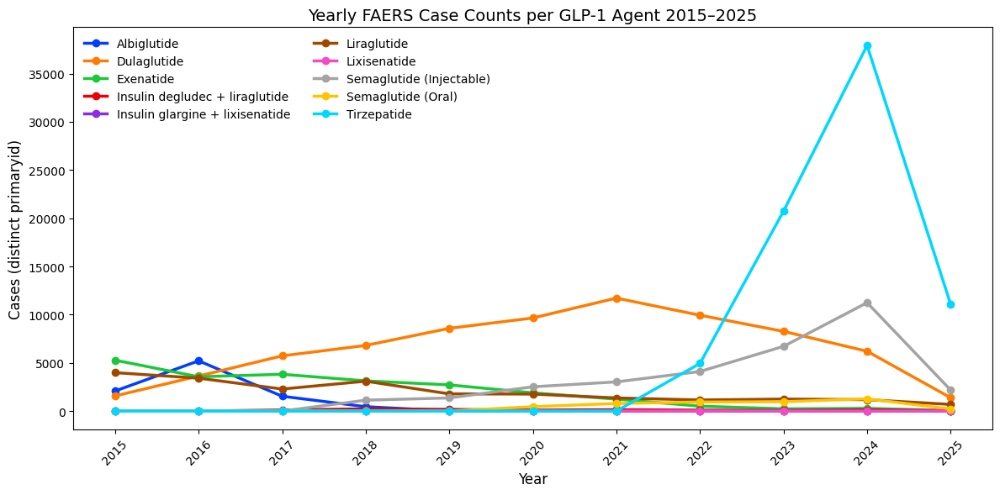

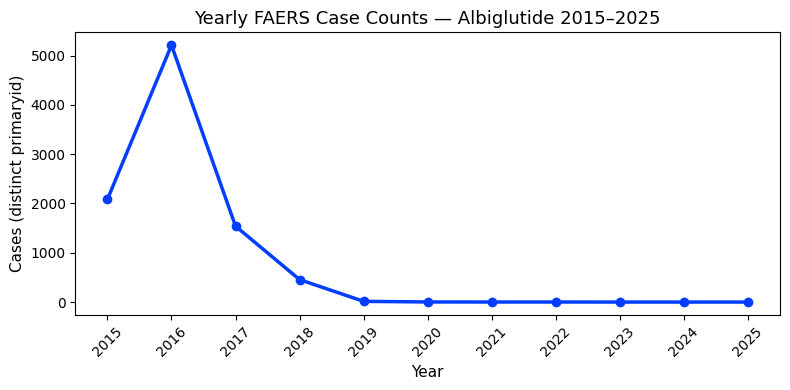

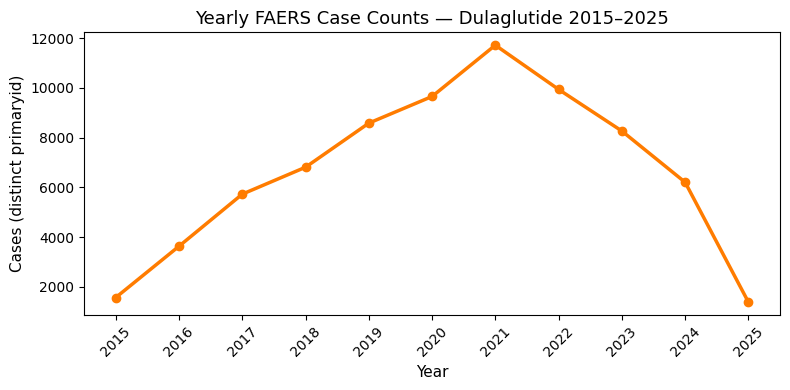

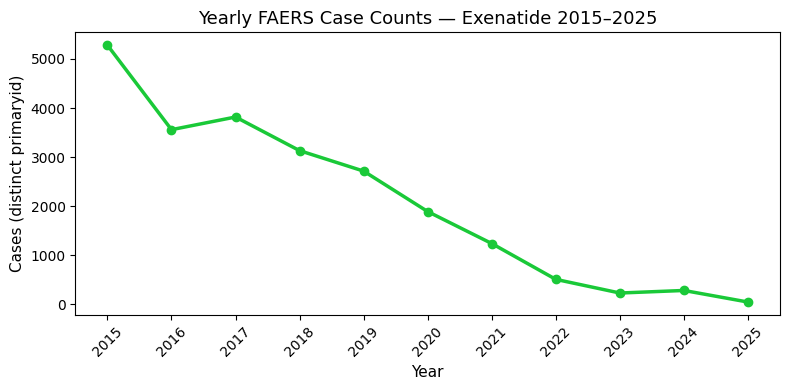

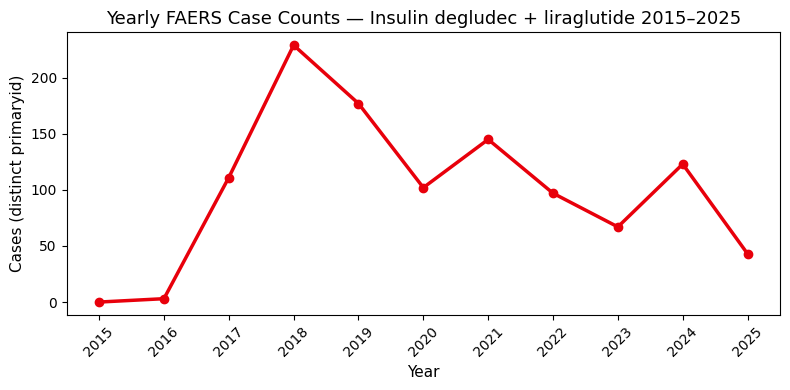

...

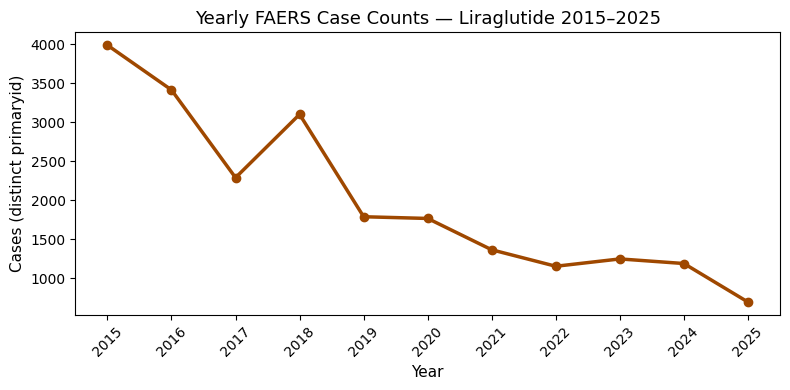

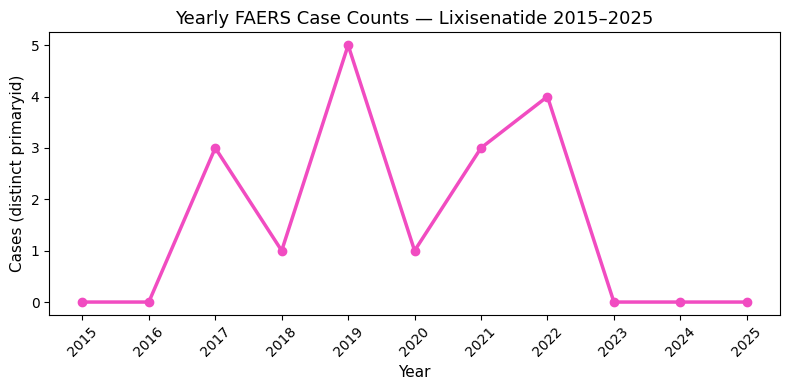

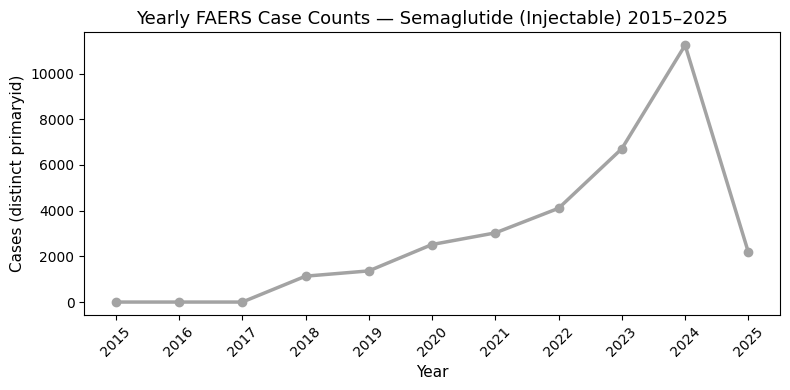

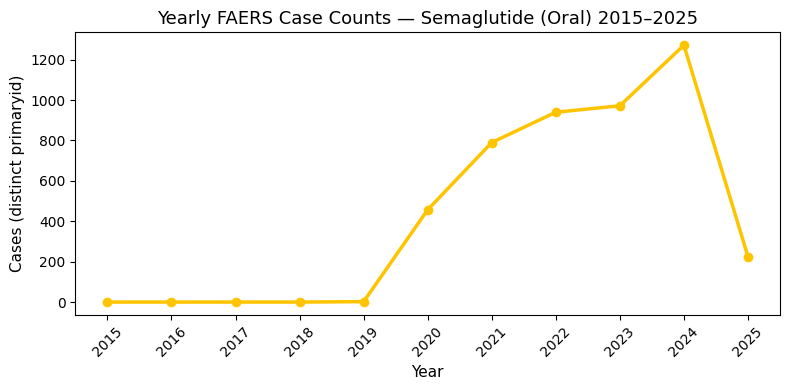

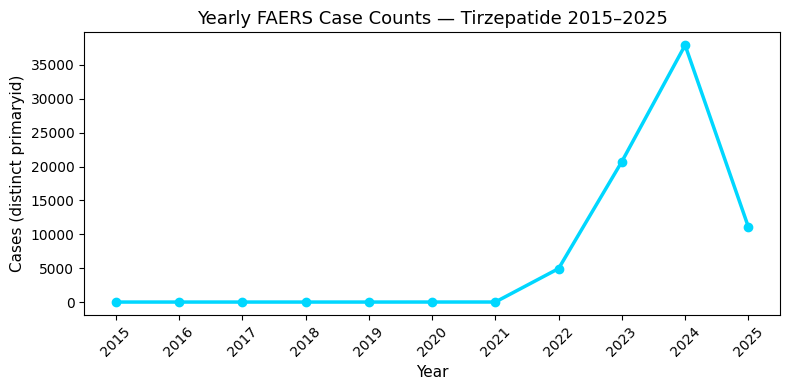

In [ ]:
import matplotlib.pyplot as plt

# Yearly counts per agent using the SAME mapping as glp1_brand_hits_windowed,
# but NOT filtered by agent windows; restrict only by global 2015–2025 range.
yearly_df = con.execute(r"""
WITH raw_hits AS (
  SELECT DISTINCT
    d.primaryid,
    atm.agent_key
  FROM drug_names_raw d
  JOIN glp1_agent_term_map atm
    ON d.name_raw LIKE '%' || atm.term || '%'
  WHERE d.role_cod IN ('PS','SS')              -- same PS/SS preference
),
dated AS (
  SELECT
    rh.primaryid,
    rh.agent_key,
    fn.receipt_date
  FROM raw_hits rh
  JOIN faers_norm fn USING (primaryid)
),
labeled AS (
  SELECT
    c.agent_label,
    d.primaryid,
    d.receipt_date
  FROM dated d
  JOIN glp1_agent_catalog c USING (agent_key)
),
yearly AS (
  SELECT
    agent_label,
    EXTRACT(YEAR FROM receipt_date)::INT AS year,
    COUNT(DISTINCT primaryid)            AS cases
  FROM labeled
  WHERE receipt_date BETWEEN DATE '2015-01-01' AND DATE '2025-12-31'
  GROUP BY 1,2
)
SELECT * FROM yearly
ORDER BY agent_label, year;
""").fetchdf()

# combine brand columns into generic columns
yearly_df["agent_label"] = yearly_df["agent_label"].replace(combine_map)
yearly_grouped = (
    yearly_df.groupby(["agent_label", "year"], as_index=False)
             .agg({"cases": "sum"})
)

display(yearly_df.head())

# make every agent have a value for every year 2015..2025
years  = list(range(2015, 2026))

# IMPORTANT: build from the grouped df (unique pairs), not the raw yearly_df
agents = sorted(yearly_grouped["agent_label"].unique().tolist())
full_index = pd.MultiIndex.from_product([agents, years], names=["agent_label", "year"])

yearly_full = (
    yearly_grouped
      .set_index(["agent_label", "year"])   # unique after groupby → OK
      .reindex(full_index, fill_value=0)
      .reset_index()
)

# plots
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import seaborn as sns

# use distinct, high-contrast colors
plt.figure(figsize=(12, 6))
palette = sns.color_palette("bright", len(agents))  # very distinct hues
colors = palette.as_hex()  # convert to hex for matplotlib

for i, (agent, sub) in enumerate(yearly_full.groupby("agent_label", sort=True)):
    plt.plot(
        sub["year"],
        sub["cases"],
        marker="o",
        linewidth=2.5,
        markersize=6,
        label=agent,
        color=colors[i]
    )

plt.title("Yearly FAERS Case Counts per GLP-1 Agent 2015–2025", fontsize=14)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Cases (distinct primaryid)", fontsize=12)
plt.xticks(years, rotation=45)
plt.grid(False)
plt.legend(ncol=2, fontsize=10, loc="upper left", frameon=False)
plt.tight_layout()
plt.show()

# per-agent plots with same color mapping
color_map = dict(zip(agents, colors))
for agent in agents:
    sub = yearly_full[yearly_full["agent_label"] == agent].sort_values("year")
    plt.figure(figsize=(8, 4))
    plt.plot(
        sub["year"],
        sub["cases"],
        marker="o",
        linewidth=2.5,
        markersize=6,
        color=color_map[agent]
    )
    plt.title(f"Yearly FAERS Case Counts — {agent} 2015–2025", fontsize=13)
    plt.xlabel("Year", fontsize=11)
    plt.ylabel("Cases (distinct primaryid)", fontsize=11)
    plt.xticks(years, rotation=45)
    plt.grid(False)
    plt.tight_layout()
    plt.show()

Attempt: Machine Learning Models

ML: Serious (1) vs Non-serious (0) modeling for GLP-1 cases
Target: 'serious' = has any OUTC code (DE/LT/HO/DS/CA/RI/OT); Non-serious = no OUTC rows.
Features (reportable at submission time):
Demographics: age_years, sex
Reporter: occp_cod (bucketed)
Indication bucket: (Type1, Type2, Obesity, CVD, Others, Unknown)
Molecule + Brand-vs-Generic assignment
Receipt year/month
AE category footprint from REAC (presence of categories defined)  [optional but reportable]

In [81]:
!pip install scikit-learn

In [82]:
import numpy as np
import pandas as pd
import duckdb
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, average_precision_score, classification_report, brier_score_loss
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

242312 from one row per (case, molecule); cases with drug mis-spelled which not shown among is_brand_only, is_generic_only, or mixed are filtered out

In [83]:
# --------------------------------------------
# 0) Indication bucket per case (priority-based)
# --------------------------------------------
con.execute(r"""
CREATE OR REPLACE VIEW glp1_indication_bucket AS
WITH raw AS (
  SELECT CAST(primaryid AS BIGINT) AS primaryid,
         lower(coalesce(indi_pt,'')) AS indi_text
  FROM sqldb.main.INDI
),
classified AS (
  SELECT
    primaryid,
    CASE
      WHEN indi_text = '' THEN 'Unknown'
      WHEN regexp_matches(indi_text, 'type\s*1') THEN 'Type 1 Diabetes'
      WHEN regexp_matches(indi_text, 'type\s*2')
        OR indi_text LIKE '%type ii%'
        OR indi_text LIKE '%t2dm%'             THEN 'Type 2 Diabetes'
      WHEN indi_text LIKE '%obes%' OR indi_text LIKE '%overweight%' THEN 'Obesity'
      WHEN indi_text LIKE '%cardio%' OR indi_text LIKE '%ischemi%' OR
           indi_text LIKE '%coronary%' OR indi_text LIKE '%heart failure%' OR
           indi_text LIKE '%cvd%' OR indi_text LIKE '%myocard%' OR
           indi_text LIKE '%stroke%'              THEN 'Cardiovascular disease'
      ELSE 'Others'
    END AS bucket
  FROM raw
),
ranked AS (
  SELECT primaryid, bucket,
         CASE bucket
           WHEN 'Type 1 Diabetes'        THEN 1
           WHEN 'Type 2 Diabetes'        THEN 2
           WHEN 'Obesity'                THEN 3
           WHEN 'Cardiovascular disease' THEN 4
           WHEN 'Others'                 THEN 5
           ELSE 6
         END AS prio
  FROM classified
),
chosen AS (
  SELECT primaryid, bucket
  FROM (
    SELECT primaryid, bucket,
           ROW_NUMBER() OVER (PARTITION BY primaryid ORDER BY prio) AS rn
    FROM ranked
  )
  WHERE rn = 1
)
SELECT * FROM chosen;
""")


# --------------------------------------------
# 1) Exposure flags per (primaryid, molecule)
#    SOURCE: glp1_case_molecule_exposure  (NO kind)
#    ONLY 3 mutually exclusive classes
# --------------------------------------------
con.execute(r"""
CREATE OR REPLACE VIEW glp1_molecule_case_flags AS
SELECT
  CAST(primaryid AS BIGINT) AS primaryid,
  lower(trim(molecule)) AS molecule,

  CASE WHEN exposure_type = 'brand_only'   THEN 1 ELSE 0 END AS is_brand_only,
  CASE WHEN exposure_type = 'generic_only' THEN 1 ELSE 0 END AS is_generic_only,
  CASE WHEN exposure_type = 'mixed'        THEN 1 ELSE 0 END AS is_mixed

FROM glp1_case_molecule_exposure;
""")


# --------------------------------------------
# 2) Build modeling dataset: one row per (case, molecule)
# --------------------------------------------
ml_df = con.execute(r"""
WITH cohort AS (
  SELECT * FROM glp1_cases_psss
),

lbl AS (
  SELECT c.primaryid,
         CASE WHEN d.primaryid IS NOT NULL THEN 1 ELSE 0 END AS serious
  FROM cohort c
  LEFT JOIN (SELECT DISTINCT primaryid FROM outc_dedup) d USING(primaryid)
),

reporter AS (
  SELECT primaryid,
         CASE UPPER(occp_cod)
           WHEN 'MD' THEN 'Healthcare professional'
           WHEN 'PH' THEN 'Healthcare professional'
           WHEN 'OT' THEN 'Healthcare professional'
           WHEN 'LW' THEN 'Lawyer'
           WHEN 'CN' THEN 'Consumer'
           ELSE 'Unspecified'
         END AS reporter_bucket
  FROM cohort
),

sex_b AS (
  SELECT primaryid,
         CASE UPPER(sex)
           WHEN 'M' THEN 'Male'
           WHEN 'F' THEN 'Female'
           ELSE 'Unknown'
         END AS sex_bucket
  FROM cohort
),

dates AS (
  SELECT primaryid,
         EXTRACT(YEAR FROM receipt_date)::INT AS receipt_year,
         EXTRACT(MONTH FROM receipt_date)::INT AS receipt_month
  FROM cohort
),

indi AS (
  SELECT primaryid, COALESCE(bucket, 'Unknown') AS indication_bucket
  FROM glp1_indication_bucket
),

mol AS (
  SELECT
    primaryid,
    molecule,
    is_brand_only,
    is_generic_only,
    is_mixed
  FROM glp1_molecule_case_flags
),

cat AS (
  SELECT primaryid, category
  FROM glp1_reac_categories_all
),

cat_pivot AS (
  SELECT primaryid,
         MAX(CASE WHEN category='Dosing/Administration Issues' THEN 1 ELSE 0 END) AS cat_dose_admin,
         MAX(CASE WHEN category='Gastrointestinal Disorders'   THEN 1 ELSE 0 END) AS cat_gi,
         MAX(CASE WHEN category='Injection Site Reactions'     THEN 1 ELSE 0 END) AS cat_inj_site,
         MAX(CASE WHEN category='Pancreatic Effects'           THEN 1 ELSE 0 END) AS cat_pancreas,
         MAX(CASE WHEN category='Thyroid'                      THEN 1 ELSE 0 END) AS cat_thyroid,
         MAX(CASE WHEN category='Gallbladder'                  THEN 1 ELSE 0 END) AS cat_gb,
         MAX(CASE WHEN category='Metabolic Effects'            THEN 1 ELSE 0 END) AS cat_metabolic,
         MAX(CASE WHEN category='Renal/Urinary'                THEN 1 ELSE 0 END) AS cat_renal,
         MAX(CASE WHEN category='Psychiatric'                  THEN 1 ELSE 0 END) AS cat_psych,
         MAX(CASE WHEN category='Musculoskeletal/Amputation'   THEN 1 ELSE 0 END) AS cat_msk,
         MAX(CASE WHEN category='Drug Effectiveness'           THEN 1 ELSE 0 END) AS cat_effectiveness,
         MAX(CASE WHEN category='Other'                        THEN 1 ELSE 0 END) AS cat_other
  FROM cat
  GROUP BY primaryid
),

base AS (
  SELECT
    c.primaryid,
    c.age_years,
    m.molecule,
    m.is_brand_only,
    m.is_generic_only,
    m.is_mixed
  FROM cohort c
  INNER JOIN mol m USING (primaryid)
)

SELECT
  b.primaryid,
  l.serious,
  b.age_years,
  sb.sex_bucket,
  r.reporter_bucket,
  COALESCE(i.indication_bucket,'Unknown') AS indication_bucket,
  d.receipt_year,
  d.receipt_month,

  b.molecule,
  b.is_brand_only,
  b.is_generic_only,
  b.is_mixed,

  COALESCE(cp.cat_dose_admin,0)     AS cat_dose_admin,
  COALESCE(cp.cat_gi,0)             AS cat_gi,
  COALESCE(cp.cat_inj_site,0)       AS cat_inj_site,
  COALESCE(cp.cat_pancreas,0)       AS cat_pancreas,
  COALESCE(cp.cat_thyroid,0)        AS cat_thyroid,
  COALESCE(cp.cat_gb,0)             AS cat_gb,
  COALESCE(cp.cat_metabolic,0)      AS cat_metabolic,
  COALESCE(cp.cat_renal,0)          AS cat_renal,
  COALESCE(cp.cat_psych,0)          AS cat_psych,
  COALESCE(cp.cat_msk,0)            AS cat_msk,
  COALESCE(cp.cat_effectiveness,0)  AS cat_effectiveness,
  COALESCE(cp.cat_other,0)          AS cat_other

FROM base b
LEFT JOIN lbl l USING (primaryid)
LEFT JOIN sex_b sb USING (primaryid)
LEFT JOIN reporter r USING (primaryid)
LEFT JOIN dates d USING (primaryid)
LEFT JOIN indi i USING (primaryid)
LEFT JOIN cat_pivot cp USING (primaryid);
""").fetchdf()

ml_df["molecule"] = ml_df["molecule"].replace(combine_map)

print("Modeling rows:", len(ml_df))
print("Flag sums:\n", ml_df[["is_brand_only","is_generic_only","is_mixed"]].sum())

# sanity: should be mutually exclusive for each row
print("Rows with >1 exposure flag set:",
      (ml_df[["is_brand_only","is_generic_only","is_mixed"]].sum(axis=1) > 1).sum())

ml_df.head()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Modeling rows: 242312
Flag sums:
 is_brand_only      238189
is_generic_only      3912
is_mixed              211
dtype: int64
Rows with >1 exposure flag set: 0


,primaryid,serious,age_years,sex_bucket,reporter_bucket,indication_bucket,receipt_year,receipt_month,molecule,is_brand_only,...,cat_inj_site,cat_pancreas,cat_thyroid,cat_gb,cat_metabolic,cat_renal,cat_psych,cat_msk,cat_effectiveness,cat_other
0,165948062,1,62.0,Female,Healthcare professional,Type 2 Diabetes,2019,9,semaglutide,1,...,0,0,0,0,0,0,0,0,0,1
1,248813931,1,NaN,Male,Consumer,Type 2 Diabetes,2025,1,semaglutide,1,...,0,0,0,0,0,0,0,0,0,1
2,120855881,1,51.0,Female,Consumer,Type 2 Diabetes,2016,2,albiglutide,1,...,0,0,0,0,1,0,1,0,0,1
3,182961881,1,NaN,Unknown,Consumer,Others,2020,9,dulaglutide,1,...,0,0,0,0,0,0,0,0,0,1
4,250484691,1,70.0,Female,Healthcare professional,Others,2025,3,semaglutide,1,...,0,0,0,0,0,0,0,0,0,1


In [86]:
# save the model input data and check for NaN
ml_df.to_csv("ml_df.csv", index=False)

In [1]:
import pandas as pd

ml_df = pd.read_csv("/home/zchu/FAERS/ml_df.csv")
print(f"Total rows: {len(ml_df)}")
print(f"Unique primary IDs: {ml_df['primaryid'].nunique()}")

Total rows: 242312
Unique primary IDs: 239869


In [3]:
# Sex
ml_df['sex_bucket'].value_counts()

sex_bucket
Female     142782
Male        76658
Unknown     22872
Name: count, dtype: int64

In [ ]:
# Age group
pd.cut(ml_df['age_years'], bins=[0,18,64,999], labels=['<18','18–64','≥65']).value_counts()

age_years
18–64    84286
≥65      42514
<18        233
Name: count, dtype: int64

In [5]:
# Reporter
ml_df['reporter_bucket'].value_counts()

reporter_bucket
Consumer                   195745
Healthcare professional     27778
Unspecified                 16844
Lawyer                       1945
Name: count, dtype: int64

In [6]:
# Indication
ml_df['indication_bucket'].value_counts()

indication_bucket
Others                    153894
Type 2 Diabetes            77895
Unknown                     6459
Obesity                     2878
Type 1 Diabetes              997
Cardiovascular disease       189
Name: count, dtype: int64

Overall Class Balance

In [3]:
class_counts = ml_df["serious"].value_counts().sort_index()
class_perc = ml_df["serious"].value_counts(normalize=True).sort_index() * 100

print("Class counts:")
print(class_counts)
print("\nClass percentages (%):")
print(class_perc.round(2))

Class counts:
serious
0    180240
1     62072
Name: count, dtype: int64

Class percentages (%):
serious
0    74.38
1    25.62
Name: proportion, dtype: float64


Balance Per Molecule

In [4]:
balance_by_molecule = (
    ml_df
    .groupby("molecule")["serious"]
    .value_counts(normalize=True)
    .unstack(fill_value=0)
    * 100
)

balance_by_molecule.round(2)

serious,0,1
molecule,,
albiglutide,95.05,4.95
dulaglutide,79.92,20.08
exenatide,73.57,26.43
liraglutide,51.91,48.09
lixisenatide,90.91,9.09
semaglutide,47.25,52.75
tirzepatide,87.85,12.15


Check balance by brand/generic flags

In [5]:
flag_cols = [
    "is_brand_only",
    "is_generic_only",
    "is_mixed",
]

for col in flag_cols:
    print(f"\n{col}")
    print(
        ml_df.loc[ml_df[col] == 1, "serious"]
        .value_counts(normalize=True)
        .mul(100)
        .round(2)
    )


is_brand_only
serious
0    75.1
1    24.9
Name: proportion, dtype: float64

is_generic_only
serious
1    68.07
0    31.93
Name: proportion, dtype: float64

is_mixed
serious
0    52.13
1    47.87
Name: proportion, dtype: float64


Due to significant imbalance in albiglutide and lixisenatide, we can't randomly undersample non-serious cases and can't oversample serious cases with SMOTE. And we can't train one global model and trust raw probabilities.

Compute Exact Class Weights

In [6]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

classes = np.array([0, 1])
y_all = ml_df["serious"].astype(int).values

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_all
)

class_weight = {0: weights[0], 1: weights[1]}
class_weight

{0: 0.6721926320461606, 1: 1.9518623533960562}

Train / Evaluate models

In [2]:
# ============================================================
# Clean train/val/test (group-aware) + threshold tuning on VAL
# Works for BOTH Logistic Regression and Random Forest
# ============================================================

import numpy as np
import pandas as pd

from sklearn.model_selection import GroupShuffleSplit
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    classification_report, precision_recall_curve
)
from sklearn.utils.class_weight import compute_class_weight

# ----------------------------
# 0) Columns (update if needed)
# ----------------------------
target_col = "serious"

numeric_cols = ["age_years", "receipt_year", "receipt_month"]

cat_cols = ["sex_bucket","reporter_bucket","indication_bucket","molecule"]

binary_cols = [
    "cat_dose_admin","cat_gi","cat_inj_site","cat_pancreas","cat_thyroid",
    "cat_gb","cat_metabolic","cat_renal","cat_psych","cat_msk",
    "cat_effectiveness","cat_other",
    # exposure flags (3-class, mutually exclusive)
    "is_brand_only","is_generic_only","is_mixed"
]

use_cols = ["primaryid"] + numeric_cols + binary_cols + cat_cols + [target_col]
df = ml_df[use_cols].copy()

# numeric cleaning
for c in numeric_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce")

# ----------------------------
# 1) Group-aware split: TRAIN vs TEST (by primaryid)
# ----------------------------
groups = df["primaryid"].astype(str)  # ensure stable group labels
X_all = df.drop(columns=[target_col])
y_all = df[target_col].astype(int)

gss = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
train_idx, test_idx = next(gss.split(X_all, y_all, groups=groups))

X_train, X_test = X_all.iloc[train_idx].copy(), X_all.iloc[test_idx].copy()
y_train, y_test = y_all.iloc[train_idx].copy(), y_all.iloc[test_idx].copy()

# ----------------------------
# 2) Inside TRAIN: TRAIN2 vs VAL (for threshold tuning; still group-aware)
# ----------------------------
groups_train = X_train["primaryid"].astype(str)

gss2 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=42)
train2_idx, val_idx = next(gss2.split(X_train, y_train, groups=groups_train))

X_tr, X_val = X_train.iloc[train2_idx].copy(), X_train.iloc[val_idx].copy()
y_tr, y_val = y_train.iloc[train2_idx].copy(), y_train.iloc[val_idx].copy()

# Drop primaryid from features (keep it separately only for grouping / reports)
X_tr_feat  = X_tr.drop(columns=["primaryid"])
X_val_feat = X_val.drop(columns=["primaryid"])
X_test_feat = X_test.drop(columns=["primaryid"])

# ----------------------------
# 3) Preprocessor
# ----------------------------
try:
    ohe = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
except TypeError:
    ohe = OneHotEncoder(handle_unknown="ignore", sparse=False)

pre = ColumnTransformer(
    transformers=[
        ("num", Pipeline([("imputer", SimpleImputer(strategy="median"))]), numeric_cols),
        ("bin", Pipeline([("imputer", SimpleImputer(strategy="constant", fill_value=0))]), binary_cols),
        ("cat", Pipeline([
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("ohe", ohe)
        ]), cat_cols),
    ],
    remainder="drop"
)

# ----------------------------
# 4) Exact class weights (computed on TRAIN2 only)
# ----------------------------
classes = np.array([0, 1])
w = compute_class_weight(class_weight="balanced", classes=classes, y=y_tr.values)
class_weight = {0: float(w[0]), 1: float(w[1])}
print("Class weights (from TRAIN2):", class_weight)

# ----------------------------
# 5) Helper: pick threshold on VAL (maximize F1)
# ----------------------------
def pick_threshold_f1(y_true, proba):
    p, r, t = precision_recall_curve(y_true, proba)
    # t has length len(p)-1
    f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-9)
    best_idx = int(np.argmax(f1))
    return float(t[best_idx]), float(f1[best_idx]), float(p[:-1][best_idx]), float(r[:-1][best_idx])

def evaluate(name, y_true, proba, threshold):
    pred = (proba >= threshold).astype(int)
    print(f"\n===== {name} =====")
    print("Threshold:", threshold)
    print("ROC-AUC:", roc_auc_score(y_true, proba))
    print("PR-AUC :", average_precision_score(y_true, proba))
    print("Brier :", brier_score_loss(y_true, proba))
    print(classification_report(y_true, pred, digits=3))

# ============================================================
# 6) Logistic Regression: fit on TRAIN2, tune threshold on VAL, evaluate on TEST
# ============================================================
logit = Pipeline(steps=[
    ("pre", pre),
    ("clf", LogisticRegression(
        max_iter=10000,
        solver="lbfgs",
        class_weight=class_weight
    ))
])

logit.fit(X_tr_feat, y_tr)

# Tune threshold on VAL
proba_val_lr = logit.predict_proba(X_val_feat)[:, 1]
thr_lr, f1_lr, p_lr, r_lr = pick_threshold_f1(y_val.values, proba_val_lr)
print("\n[LR] Best VAL threshold (F1):", thr_lr, "| F1:", round(f1_lr, 4), "| P:", round(p_lr, 4), "| R:", round(r_lr, 4))

# Evaluate on TEST using that threshold
proba_test_lr = logit.predict_proba(X_test_feat)[:, 1]
evaluate("LogReg (threshold tuned on VAL)", y_test.values, proba_test_lr, thr_lr)

# ============================================================
# 7) Random Forest: fit on TRAIN2, tune threshold on VAL, evaluate on TEST
# ============================================================
rf = Pipeline(steps=[
    ("pre", pre),
    ("clf", RandomForestClassifier(
        n_estimators=500,
        min_samples_leaf=30,
        class_weight=class_weight,
        random_state=42,
        n_jobs=-1
    ))
])

rf.fit(X_tr_feat, y_tr)

# Tune threshold on VAL
proba_val_rf = rf.predict_proba(X_val_feat)[:, 1]
thr_rf, f1_rf, p_rf, r_rf = pick_threshold_f1(y_val.values, proba_val_rf)
print("\n[RF] Best VAL threshold (F1):", thr_rf, "| F1:", round(f1_rf, 4), "| P:", round(p_rf, 4), "| R:", round(r_rf, 4))

# Evaluate on TEST using that threshold
proba_test_rf = rf.predict_proba(X_test_feat)[:, 1]
evaluate("RandomForest (threshold tuned on VAL)", y_test.values, proba_test_rf, thr_rf)

# ============================================================
# 8) Molecule-stratified metrics on TEST (for LR & RF)
# ============================================================
def molecule_metrics(name, molecules, y_true, proba, min_n=500):
    out = []
    tmp = pd.DataFrame({"molecule": molecules, "y": y_true, "p": proba})
    for mol, g in tmp.groupby("molecule"):
        if len(g) >= min_n and g["y"].nunique() == 2:
            out.append({
                "model": name,
                "molecule": mol,
                "n": len(g),
                "pos_rate": g["y"].mean(),
                "roc_auc": roc_auc_score(g["y"], g["p"]),
                "pr_auc": average_precision_score(g["y"], g["p"]),
                "brier": brier_score_loss(g["y"], g["p"])
            })
    return pd.DataFrame(out).sort_values(["model","n"], ascending=[True, False])

mol_test = X_test["molecule"].values

mm_lr = molecule_metrics("LogReg", mol_test, y_test.values, proba_test_lr, min_n=500)
mm_rf = molecule_metrics("RF",     mol_test, y_test.values, proba_test_rf, min_n=500)

mol_metrics_df = pd.concat([mm_lr, mm_rf], ignore_index=True)
mol_metrics_df


Class weights (from TRAIN2): {0: 0.6723669120639266, 1: 1.9503943767773784}

[LR] Best VAL threshold (F1): 0.5975596384719234 | F1: 0.6498 | P: 0.6184 | R: 0.6846

===== LogReg (threshold tuned on VAL) =====
Threshold: 0.5975596384719234
ROC-AUC: 0.8766067081260103
PR-AUC : 0.7398299158871741
Brier : 0.14244959010036004
              precision    recall  f1-score   support

           0      0.888     0.856     0.872     45047
           1      0.622     0.687     0.653     15540

    accuracy                          0.813     60587
   macro avg      0.755     0.772     0.762     60587
weighted avg      0.820     0.813     0.815     60587


[RF] Best VAL threshold (F1): 0.5946310569023829 | F1: 0.7231 | P: 0.722 | R: 0.7241

===== RandomForest (threshold tuned on VAL) =====
Threshold: 0.5946310569023829
ROC-AUC: 0.9160862997117354
PR-AUC : 0.8220730788754578
Brier : 0.12237902026709378
              precision    recall  f1-score   support

           0      0.907     0.906     0.906  

,model,molecule,n,pos_rate,roc_auc,pr_auc,brier
0,LogReg,tirzepatide,19069,0.121873,0.886624,0.572789,0.088859
1,LogReg,dulaglutide,18290,0.202242,0.854319,0.651510,0.132408
2,LogReg,semaglutide,10009,0.530023,0.758194,0.799583,0.238773
3,LogReg,liraglutide,5708,0.484583,0.804937,0.824917,0.216751
4,LogReg,exenatide,5175,0.257971,0.855239,0.739036,0.154271
5,LogReg,albiglutide,2328,0.047680,0.889718,0.477289,0.037344
6,RF,tirzepatide,19069,0.121873,0.909340,0.624956,0.087455
7,RF,dulaglutide,18290,0.202242,0.880602,0.691447,0.127281
8,RF,semaglutide,10009,0.530023,0.913500,0.921901,0.161174
9,RF,liraglutide,5708,0.484583,0.891576,0.893190,0.171824


Raw probabilities are not comparable across molecules due to base-rate differences.

Fix this by post-hoc calibration per molecule.

Class weights (TRAIN2): {0: 0.6723669120639266, 1: 1.9503943767773784}



[LR+Platt] Best VAL threshold: 0.3732249579906385 | F1: 0.6498 | P: 0.6184 | R: 0.6846

===== LogReg + Platt (TEST, calibrated) =====
Threshold: 0.3732249579906385
ROC-AUC: 0.8766067081260103
PR-AUC : 0.7398299158871742
Brier : 0.12001212530931064
              precision    recall  f1-score   support

           0      0.888     0.856     0.872     45047
           1      0.622     0.687     0.653     15540

    accuracy                          0.813     60587
   macro avg      0.755     0.772     0.762     60587
weighted avg      0.820     0.813     0.815     60587


[LR+Iso] Best VAL threshold: 0.3711279953243718 | F1: 0.6498 | P: 0.6184 | R: 0.6846

===== LogReg + Isotonic (TEST, calibrated) =====
Threshold: 0.3711279953243718
ROC-AUC: 0.8765498048813254
PR-AUC : 0.727797856991335
Brier : 0.11737699128214561
              precision    recall  f1-score   support

           0      0.888     0.856     0.872     45047
           1      0.622     0.687     0.653     15540

    accurac

,model,molecule,n,pos_rate,brier,roc_auc,pr_auc
5,LR+Platt,tirzepatide,19069,0.121873,0.076007,0.886624,0.572789
1,LR+Platt,dulaglutide,18290,0.202242,0.110962,0.854319,0.651510
4,LR+Platt,semaglutide,10009,0.530023,0.203053,0.758194,0.799583
3,LR+Platt,liraglutide,5708,0.484583,0.181442,0.804937,0.824917
2,LR+Platt,exenatide,5175,0.257971,0.124754,0.855239,0.739036
0,LR+Platt,albiglutide,2328,0.047680,0.033442,0.889718,0.477289



Top molecule-wise Brier (LR+Iso):


,model,molecule,n,pos_rate,brier,roc_auc,pr_auc
5,LR+Iso,tirzepatide,19069,0.121873,0.074482,0.886349,0.557660
1,LR+Iso,dulaglutide,18290,0.202242,0.109784,0.853932,0.634837
4,LR+Iso,semaglutide,10009,0.530023,0.197100,0.759855,0.788810
3,LR+Iso,liraglutide,5708,0.484583,0.176680,0.804361,0.812163
2,LR+Iso,exenatide,5175,0.257971,0.120771,0.854792,0.728251
0,LR+Iso,albiglutide,2328,0.047680,0.032784,0.889872,0.464032


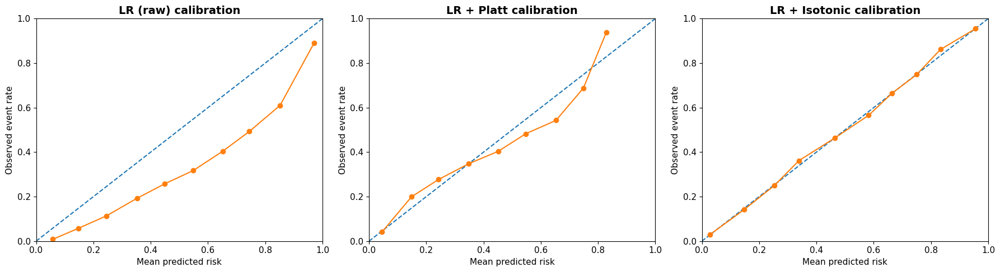

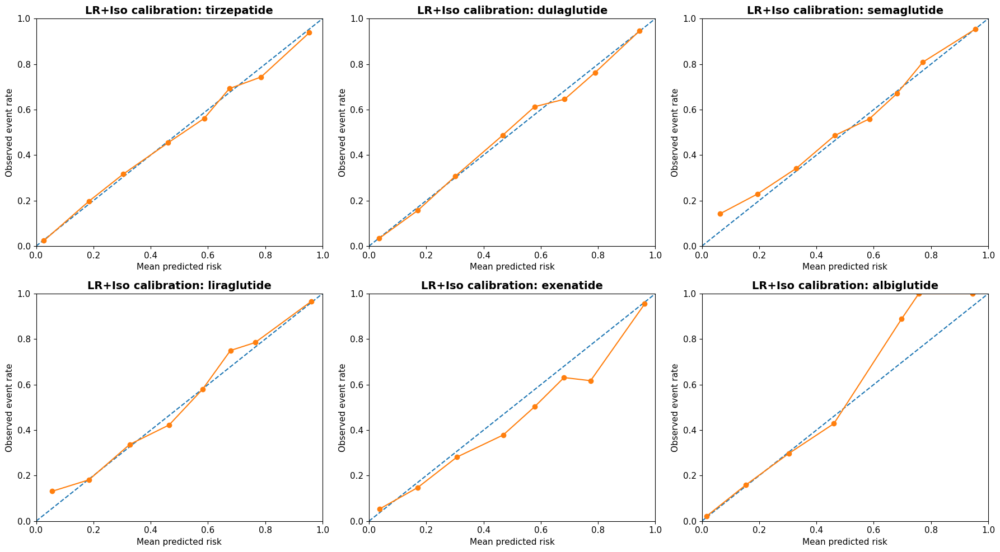


[RF+Platt] Best VAL threshold: 0.404829365668105 | F1: 0.7231 | P: 0.722 | R: 0.7241

===== RF + Platt (TEST, calibrated) =====
Threshold: 0.404829365668105
ROC-AUC: 0.9160862997117354
PR-AUC : 0.8220730788754578
Brier : 0.09651271953971254
              precision    recall  f1-score   support

           0      0.907     0.906     0.906     45047
           1      0.728     0.730     0.729     15540

    accuracy                          0.861     60587
   macro avg      0.817     0.818     0.818     60587
weighted avg      0.861     0.861     0.861     60587


[RF+Iso] Best VAL threshold: 0.36964980544747084 | F1: 0.7231 | P: 0.722 | R: 0.7241

===== RF + Isotonic (TEST, calibrated) =====
Threshold: 0.36964980544747084
ROC-AUC: 0.9159416045629334
PR-AUC : 0.8149358103741233
Brier : 0.0958593212231837
              precision    recall  f1-score   support

           0      0.907     0.906     0.906     45047
           1      0.728     0.730     0.729     15540

    accuracy         

,model,molecule,n,pos_rate,brier,roc_auc,pr_auc
5,RF+Platt,tirzepatide,19069,0.121873,0.069573,0.909340,0.624956
1,RF+Platt,dulaglutide,18290,0.202242,0.103552,0.880602,0.691447
4,RF+Platt,semaglutide,10009,0.530023,0.119976,0.913500,0.921901
3,RF+Platt,liraglutide,5708,0.484583,0.135324,0.891576,0.893190
2,RF+Platt,exenatide,5175,0.257971,0.112098,0.876579,0.776055
0,RF+Platt,albiglutide,2328,0.047680,0.031128,0.928054,0.540776



Top molecule-wise Brier (RF+Iso):


,model,molecule,n,pos_rate,brier,roc_auc,pr_auc
5,RF+Iso,tirzepatide,19069,0.121873,0.069300,0.909238,0.613523
1,RF+Iso,dulaglutide,18290,0.202242,0.103245,0.880083,0.681455
4,RF+Iso,semaglutide,10009,0.530023,0.118180,0.913021,0.917404
3,RF+Iso,liraglutide,5708,0.484583,0.134663,0.891437,0.887564
2,RF+Iso,exenatide,5175,0.257971,0.110905,0.876084,0.766923
0,RF+Iso,albiglutide,2328,0.047680,0.030844,0.927798,0.522445


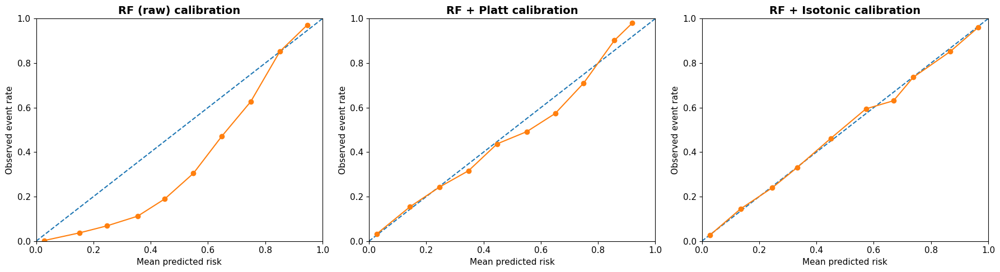

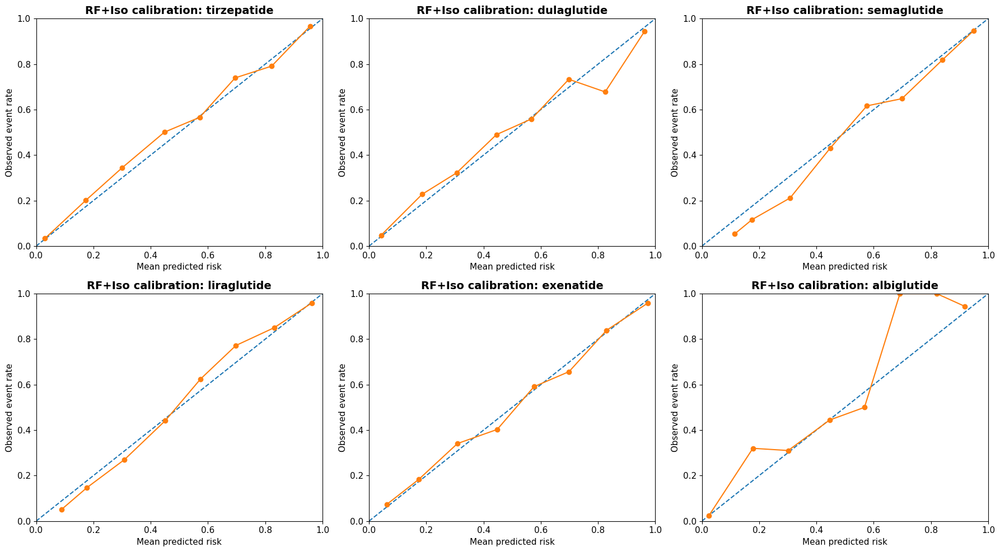

,model,molecule,n,pos_rate,brier,roc_auc,pr_auc
11,LR+Iso,albiglutide,2328,0.047680,0.032784,0.889872,0.464032
5,LR+Platt,albiglutide,2328,0.047680,0.033442,0.889718,0.477289
23,RF+Iso,albiglutide,2328,0.047680,0.030844,0.927798,0.522445
17,RF+Platt,albiglutide,2328,0.047680,0.031128,0.928054,0.540776
7,LR+Iso,dulaglutide,18290,0.202242,0.109784,0.853932,0.634837
1,LR+Platt,dulaglutide,18290,0.202242,0.110962,0.854319,0.651510
19,RF+Iso,dulaglutide,18290,0.202242,0.103245,0.880083,0.681455
13,RF+Platt,dulaglutide,18290,0.202242,0.103552,0.880602,0.691447
10,LR+Iso,exenatide,5175,0.257971,0.120771,0.854792,0.728251
4,LR+Platt,exenatide,5175,0.257971,0.124754,0.855239,0.739036


In [5]:
# ============================================================
# Publication-clean calibration + thresholding (group-aware)
# - Group split: TRAIN / TEST by primaryid
# - Inside TRAIN: TRAIN2 / VAL by primaryid
# - Fit base model on TRAIN2
# - Fit calibrator on VAL (NO leakage)
# - Tune threshold on calibrated VAL probs
# - Evaluate on calibrated TEST probs (overall + per-molecule)
# - Plot calibration curves (overall + per-molecule)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import GroupShuffleSplit
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    precision_recall_curve, classification_report
)
from sklearn.isotonic import IsotonicRegression

# ----------------------------
# 0) Columns
# ----------------------------
target_col = "serious"

numeric_cols = ["age_years", "receipt_year", "receipt_month"]
cat_cols = ["sex_bucket","reporter_bucket","indication_bucket","molecule"]
binary_cols = [
    "cat_dose_admin","cat_gi","cat_inj_site","cat_pancreas","cat_thyroid",
    "cat_gb","cat_metabolic","cat_renal","cat_psych","cat_msk",
    "cat_effectiveness","cat_other",
    "is_brand_only","is_generic_only","is_mixed"
]

use_cols = ["primaryid"] + numeric_cols + binary_cols + cat_cols + [target_col]
df = ml_df[use_cols].copy()
for c in numeric_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce")

groups = df["primaryid"].astype(str)
X_all = df.drop(columns=[target_col])
y_all = df[target_col].astype(int)

# ----------------------------
# 1) Group split: TRAIN / TEST
# ----------------------------
gss = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
train_idx, test_idx = next(gss.split(X_all, y_all, groups=groups))

X_train, X_test = X_all.iloc[train_idx].copy(), X_all.iloc[test_idx].copy()
y_train, y_test = y_all.iloc[train_idx].copy(), y_all.iloc[test_idx].copy()

# ----------------------------
# 2) Group split inside TRAIN: TRAIN2 / VAL
# ----------------------------
groups_train = X_train["primaryid"].astype(str)

gss2 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=42)
train2_idx, val_idx = next(gss2.split(X_train, y_train, groups=groups_train))

X_tr, X_val = X_train.iloc[train2_idx].copy(), X_train.iloc[val_idx].copy()
y_tr, y_val = y_train.iloc[train2_idx].copy(), y_train.iloc[val_idx].copy()

# Keep molecule labels for reporting; drop primaryid for modeling
mol_test = X_test["molecule"].values
mol_val  = X_val["molecule"].values

X_tr_feat   = X_tr.drop(columns=["primaryid"])
X_val_feat  = X_val.drop(columns=["primaryid"])
X_test_feat = X_test.drop(columns=["primaryid"])

# ----------------------------
# 3) Preprocessor
# ----------------------------
try:
    ohe = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
except TypeError:
    ohe = OneHotEncoder(handle_unknown="ignore", sparse=False)

pre = ColumnTransformer(
    transformers=[
        ("num", Pipeline([("imputer", SimpleImputer(strategy="median"))]), numeric_cols),
        ("bin", Pipeline([("imputer", SimpleImputer(strategy="constant", fill_value=0))]), binary_cols),
        ("cat", Pipeline([
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("ohe", ohe)
        ]), cat_cols),
    ],
    remainder="drop"
)

# ----------------------------
# 4) Class weights from TRAIN2 only
# ----------------------------
classes = np.array([0, 1])
w = compute_class_weight(class_weight="balanced", classes=classes, y=y_tr.values)
class_weight = {0: float(w[0]), 1: float(w[1])}
print("Class weights (TRAIN2):", class_weight)

# ----------------------------
# Helpers
# ----------------------------
def pick_threshold_f1(y_true, proba):
    p, r, t = precision_recall_curve(y_true, proba)
    f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-9)
    best_idx = int(np.argmax(f1))
    return float(t[best_idx]), float(f1[best_idx]), float(p[:-1][best_idx]), float(r[:-1][best_idx])

def evaluate_block(name, y_true, proba, threshold):
    pred = (proba >= threshold).astype(int)
    print(f"\n===== {name} =====")
    print("Threshold:", threshold)
    print("ROC-AUC:", roc_auc_score(y_true, proba))
    print("PR-AUC :", average_precision_score(y_true, proba))
    print("Brier :", brier_score_loss(y_true, proba))
    print(classification_report(y_true, pred, digits=3))

def calibration_curve_manual(y_true, proba, n_bins=10):
    # returns mean_pred, frac_pos, counts per bin
    y_true = np.asarray(y_true)
    proba = np.asarray(proba)
    bins = np.linspace(0.0, 1.0, n_bins + 1)
    idx = np.digitize(proba, bins) - 1
    idx = np.clip(idx, 0, n_bins - 1)

    mean_pred, frac_pos, counts = [], [], []
    for b in range(n_bins):
        m = idx == b
        if m.sum() == 0:
            continue
        mean_pred.append(proba[m].mean())
        frac_pos.append(y_true[m].mean())
        counts.append(int(m.sum()))
    return np.array(mean_pred), np.array(frac_pos), np.array(counts)

def plot_calibration(ax, y_true, proba, title, n_bins=10):
    mp, fp, c = calibration_curve_manual(y_true, proba, n_bins=n_bins)
    ax.plot([0,1], [0,1], linestyle="--")
    ax.plot(mp, fp, marker="o")
    ax.set_xlim(0,1); ax.set_ylim(0,1)
    ax.set_title(title)
    ax.set_xlabel("Mean predicted risk")
    ax.set_ylabel("Observed event rate")

def molecule_brier_table(model_name, molecules, y_true, proba, min_n=500):
    out = []
    tmp = pd.DataFrame({"molecule": molecules, "y": y_true, "p": proba})
    for mol, g in tmp.groupby("molecule"):
        if len(g) >= min_n:
            out.append({
                "model": model_name,
                "molecule": mol,
                "n": len(g),
                "pos_rate": g["y"].mean(),
                "brier": brier_score_loss(g["y"], g["p"]),
                "roc_auc": roc_auc_score(g["y"], g["p"]) if g["y"].nunique() == 2 else np.nan,
                "pr_auc": average_precision_score(g["y"], g["p"]) if g["y"].nunique() == 2 else np.nan,
            })
    return pd.DataFrame(out).sort_values("n", ascending=False)

# ============================================================
# A) Logistic Regression + calibration (Isotonic and Platt)
# ============================================================

logit = Pipeline(steps=[
    ("pre", pre),
    ("clf", LogisticRegression(
        max_iter=10000,
        solver="lbfgs",
        class_weight=class_weight
    ))
])

# Fit base on TRAIN2
logit.fit(X_tr_feat, y_tr)

# Raw probs on VAL/TEST
proba_val_lr_raw  = logit.predict_proba(X_val_feat)[:, 1]
proba_test_lr_raw = logit.predict_proba(X_test_feat)[:, 1]

# --- Platt scaling (sigmoid): fit logistic on VAL raw probs ---
platt_lr = LogisticRegression(max_iter=10000, solver="lbfgs")
platt_lr.fit(proba_val_lr_raw.reshape(-1, 1), y_val.values)
proba_val_lr_platt  = platt_lr.predict_proba(proba_val_lr_raw.reshape(-1, 1))[:, 1]
proba_test_lr_platt = platt_lr.predict_proba(proba_test_lr_raw.reshape(-1, 1))[:, 1]

# --- Isotonic regression: fit on VAL raw probs ---
iso_lr = IsotonicRegression(out_of_bounds="clip")
iso_lr.fit(proba_val_lr_raw, y_val.values)
proba_val_lr_iso  = iso_lr.transform(proba_val_lr_raw)
proba_test_lr_iso = iso_lr.transform(proba_test_lr_raw)

# Threshold tuning on CALIBRATED VAL probs, then evaluate on CALIBRATED TEST probs
thr_lr_platt, f1, p_, r_ = pick_threshold_f1(y_val.values, proba_val_lr_platt)
print("\n[LR+Platt] Best VAL threshold:", thr_lr_platt, "| F1:", round(f1,4), "| P:", round(p_,4), "| R:", round(r_,4))
evaluate_block("LogReg + Platt (TEST, calibrated)", y_test.values, proba_test_lr_platt, thr_lr_platt)

thr_lr_iso, f1, p_, r_ = pick_threshold_f1(y_val.values, proba_val_lr_iso)
print("\n[LR+Iso] Best VAL threshold:", thr_lr_iso, "| F1:", round(f1,4), "| P:", round(p_,4), "| R:", round(r_,4))
evaluate_block("LogReg + Isotonic (TEST, calibrated)", y_test.values, proba_test_lr_iso, thr_lr_iso)

# Molecule-wise Brier tables
brier_lr_platt = molecule_brier_table("LR+Platt", mol_test, y_test.values, proba_test_lr_platt, min_n=500)
brier_lr_iso   = molecule_brier_table("LR+Iso",   mol_test, y_test.values, proba_test_lr_iso,   min_n=500)

print("\nTop molecule-wise Brier (LR+Platt):")
display(brier_lr_platt.head(10))
print("\nTop molecule-wise Brier (LR+Iso):")
display(brier_lr_iso.head(10))

# Calibration curves (overall + per-molecule)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
plot_calibration(axes[0], y_test.values, proba_test_lr_raw,   "LR (raw) calibration", n_bins=10)
plot_calibration(axes[1], y_test.values, proba_test_lr_platt, "LR + Platt calibration", n_bins=10)
plot_calibration(axes[2], y_test.values, proba_test_lr_iso,   "LR + Isotonic calibration", n_bins=10)
plt.tight_layout()
plt.show()

# Optional: per-molecule calibration curves for big molecules
big_mols = pd.Series(mol_test).value_counts()
big_mols = big_mols[big_mols >= 500].index.tolist()[:6]  # top 6

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()
for ax, mol in zip(axes, big_mols):
    m = (mol_test == mol)
    plot_calibration(ax, y_test.values[m], proba_test_lr_iso[m], f"LR+Iso calibration: {mol}", n_bins=8)
plt.tight_layout()
plt.show()

# ============================================================
# B) Random Forest + calibration (Isotonic and Platt)
# ============================================================

rf = Pipeline(steps=[
    ("pre", pre),
    ("clf", RandomForestClassifier(
        n_estimators=500,
        min_samples_leaf=30,
        class_weight=class_weight,
        random_state=42,
        n_jobs=-1
    ))
])

# Fit base on TRAIN2
rf.fit(X_tr_feat, y_tr)

# Raw probs on VAL/TEST
proba_val_rf_raw  = rf.predict_proba(X_val_feat)[:, 1]
proba_test_rf_raw = rf.predict_proba(X_test_feat)[:, 1]

# Platt scaling on VAL raw probs
platt_rf = LogisticRegression(max_iter=10000, solver="lbfgs")
platt_rf.fit(proba_val_rf_raw.reshape(-1, 1), y_val.values)
proba_val_rf_platt  = platt_rf.predict_proba(proba_val_rf_raw.reshape(-1, 1))[:, 1]
proba_test_rf_platt = platt_rf.predict_proba(proba_test_rf_raw.reshape(-1, 1))[:, 1]

# Isotonic regression on VAL raw probs
iso_rf = IsotonicRegression(out_of_bounds="clip")
iso_rf.fit(proba_val_rf_raw, y_val.values)
proba_val_rf_iso  = iso_rf.transform(proba_val_rf_raw)
proba_test_rf_iso = iso_rf.transform(proba_test_rf_raw)

# Threshold tuning on calibrated VAL probs; evaluate on calibrated TEST probs
thr_rf_platt, f1, p_, r_ = pick_threshold_f1(y_val.values, proba_val_rf_platt)
print("\n[RF+Platt] Best VAL threshold:", thr_rf_platt, "| F1:", round(f1,4), "| P:", round(p_,4), "| R:", round(r_,4))
evaluate_block("RF + Platt (TEST, calibrated)", y_test.values, proba_test_rf_platt, thr_rf_platt)

thr_rf_iso, f1, p_, r_ = pick_threshold_f1(y_val.values, proba_val_rf_iso)
print("\n[RF+Iso] Best VAL threshold:", thr_rf_iso, "| F1:", round(f1,4), "| P:", round(p_,4), "| R:", round(r_,4))
evaluate_block("RF + Isotonic (TEST, calibrated)", y_test.values, proba_test_rf_iso, thr_rf_iso)

# Molecule-wise Brier tables
brier_rf_platt = molecule_brier_table("RF+Platt", mol_test, y_test.values, proba_test_rf_platt, min_n=500)
brier_rf_iso   = molecule_brier_table("RF+Iso",   mol_test, y_test.values, proba_test_rf_iso,   min_n=500)

print("\nTop molecule-wise Brier (RF+Platt):")
display(brier_rf_platt.head(10))
print("\nTop molecule-wise Brier (RF+Iso):")
display(brier_rf_iso.head(10))

# Calibration curves (overall + per-molecule)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
plot_calibration(axes[0], y_test.values, proba_test_rf_raw,   "RF (raw) calibration", n_bins=10)
plot_calibration(axes[1], y_test.values, proba_test_rf_platt, "RF + Platt calibration", n_bins=10)
plot_calibration(axes[2], y_test.values, proba_test_rf_iso,   "RF + Isotonic calibration", n_bins=10)
plt.tight_layout()
plt.show()

# Per-molecule calibration curves for big molecules
big_mols = pd.Series(mol_test).value_counts()
big_mols = big_mols[big_mols >= 500].index.tolist()[:6]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.ravel()
for ax, mol in zip(axes, big_mols):
    m = (mol_test == mol)
    plot_calibration(ax, y_test.values[m], proba_test_rf_iso[m], f"RF+Iso calibration: {mol}", n_bins=8)
plt.tight_layout()
plt.show()

# ============================================================
# Combined per-molecule Brier summary (choose best calibrated)
# ============================================================
brier_all = pd.concat([brier_lr_platt, brier_lr_iso, brier_rf_platt, brier_rf_iso], ignore_index=True)
brier_all.sort_values(["molecule","model"], inplace=True)
brier_all

In [13]:
# ============================================================
# ABLATION: Remove cat_* features — LR and RF
# ============================================================

import pandas as pd
import numpy as np
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss
from sklearn.isotonic import IsotonicRegression

# ── 1. Define cat_* columns to drop ──
ablation_drop = [
    'cat_dose_admin', 'cat_gi', 'cat_inj_site', 'cat_pancreas', 'cat_thyroid',
    'cat_gb', 'cat_metabolic', 'cat_renal', 'cat_psych', 'cat_msk',
    'cat_effectiveness', 'cat_other'
]

# Use the same X_tr / X_val_feat / X_test_feat from cell 126
X_tr_nocat   = X_tr.drop(columns=ablation_drop, errors='ignore')
X_val_nocat  = X_val_feat.drop(columns=ablation_drop, errors='ignore')
X_test_nocat = X_test_feat.drop(columns=ablation_drop, errors='ignore')

print(f"Features: {X_test_feat.shape[1]} (full) -> {X_test_nocat.shape[1]} (no cat)")

def eval_nocat(y_true, y_prob, label):
    auc   = roc_auc_score(y_true, y_prob)
    pr    = average_precision_score(y_true, y_prob)
    brier = brier_score_loss(y_true, y_prob)
    print(f"[{label}]  ROC-AUC={auc:.4f}  PR-AUC={pr:.4f}  Brier={brier:.4f}")
    return {'model': label, 'roc_auc': round(auc,3), 'pr_auc': round(pr,3), 'brier': round(brier,3)}

results_nocat = []

# ── 2. LR (no cat) — re-use same preprocessor/pipeline structure as cell 126 ──
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

num_cols   = ['age_years', 'receipt_year', 'receipt_month']
obj_cols   = ['sex_bucket', 'reporter_bucket', 'indication_bucket', 'molecule']
bin_cols   = ['is_brand_only', 'is_generic_only', 'is_mixed']  # exposure flags kept

pre_nocat = ColumnTransformer([
    ('num', SimpleImputer(strategy='median'), num_cols),
    ('bin', SimpleImputer(strategy='most_frequent'), bin_cols),
    ('cat', Pipeline([
        ('imp', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ]), obj_cols)
], remainder='drop')

cw = compute_class_weight('balanced', classes=np.array([0,1]), y=y_tr.values)
class_weight = {0: cw[0], 1: cw[1]}

# LR
lr_nocat = Pipeline([
    ('pre', pre_nocat),
    ('clf', LogisticRegression(max_iter=5000, solver='saga', random_state=42,
                               class_weight=class_weight, C=1.0))
])
lr_nocat.fit(X_tr_nocat, y_tr)

# Isotonic on val
iso_lr_nocat = IsotonicRegression(out_of_bounds='clip')
iso_lr_nocat.fit(lr_nocat.predict_proba(X_val_nocat)[:, 1], y_val.values)
lr_prob_nocat = iso_lr_nocat.transform(lr_nocat.predict_proba(X_test_nocat)[:, 1])
results_nocat.append(eval_nocat(y_test.values, lr_prob_nocat, 'LR+Iso (no cat)'))

# ── 3. RF + Isotonic (no cat) ──
rf_nocat = Pipeline([
    ('pre', pre_nocat),
    ('clf', RandomForestClassifier(n_estimators=100, random_state=42,
                                   class_weight=class_weight, n_jobs=-1))
])
rf_nocat.fit(X_tr_nocat, y_tr)

iso_rf_nocat = IsotonicRegression(out_of_bounds='clip')
iso_rf_nocat.fit(rf_nocat.predict_proba(X_val_nocat)[:, 1], y_val.values)
rf_prob_nocat = iso_rf_nocat.transform(rf_nocat.predict_proba(X_test_nocat)[:, 1])
results_nocat.append(eval_nocat(y_test.values, rf_prob_nocat, 'RF+Iso (no cat)'))

# ── 4. Summary ──
df_nocat = pd.DataFrame(results_nocat)
print("\n=== ABLATION RESULTS (no cat_* features) ===")
print(df_nocat.to_string(index=False))

print("\n=== AUROC DROP vs FULL MODEL ===")
full = {'LR+Iso (no cat)': 0.876, 'RF+Iso (no cat)': 0.916}
for r in results_nocat:
    drop = full[r['model']] - r['roc_auc']
    print(f"  {r['model']}: {full[r['model']]:.3f} -> {r['roc_auc']:.3f}  (Δ={drop:+.3f})")

Features: 22 (full) -> 10 (no cat)


/home/zchu/FAERS/faers/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[LR+Iso (no cat)]  ROC-AUC=0.7668  PR-AUC=0.5611  Brier=0.1507
[RF+Iso (no cat)]  ROC-AUC=0.7853  PR-AUC=0.6725  Brier=0.1296

=== ABLATION RESULTS (no cat_* features) ===
          model  roc_auc  pr_auc  brier
LR+Iso (no cat)    0.767   0.561  0.151
RF+Iso (no cat)    0.785   0.673  0.130

=== AUROC DROP vs FULL MODEL ===
  LR+Iso (no cat): 0.876 -> 0.767  (Δ=+0.109)
  RF+Iso (no cat): 0.916 -> 0.785  (Δ=+0.131)


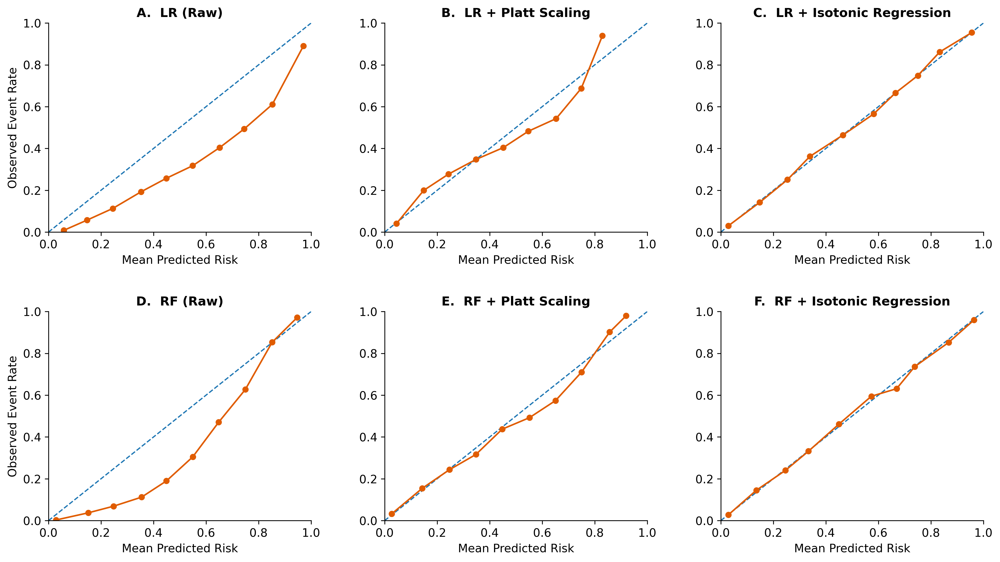

In [6]:
import matplotlib as mpl

# ── Apply consistent style (match SHAP figures) ──────────────────
mpl.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor":   "white",
    "axes.edgecolor":   "black",
    "axes.linewidth":   0.8,
    "font.size":        11,
    "axes.titlesize":   12,
    "axes.titleweight": "bold",
})

# ── Updated plot_calibration with publication styling ─────────────────
def plot_calibration(ax, y_true, proba, title, n_bins=10):
    mp, fp, c = calibration_curve_manual(y_true, proba, n_bins=n_bins)
    ax.plot([0, 1], [0, 1], linestyle="--", color="#1f77b4",
            linewidth=1.2, label="Perfect calibration")
    ax.plot(mp, fp, marker="o", color="#e05c00",
            linewidth=1.5, markersize=5, label="Model")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title(title, pad=6)
    ax.set_xlabel("Mean Predicted Risk")
    ax.set_ylabel("Observed Event Rate")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.grid(False)

# ── Resolution calculation ─────────────────────────────────────────────
# Full page width = 164 mm = 6.46 in
# figsize=(13, 8) at DPI=300 → 3900 px wide → 3900/6.46 = 603 dpi
FIG_W, FIG_H, DPI = 14, 8, 300

# ── Single combined 2×3 figure ────────────────────────────────────────
fig, axes = plt.subplots(
    2, 3,
    figsize=(FIG_W, FIG_H),
    dpi=DPI,
    facecolor="white"
)

# Row 0: LR
plot_calibration(axes[0, 0], y_test.values, proba_test_lr_raw,
                 "A.  LR (Raw)", n_bins=10)
plot_calibration(axes[0, 1], y_test.values, proba_test_lr_platt,
                 "B.  LR + Platt Scaling", n_bins=10)
plot_calibration(axes[0, 2], y_test.values, proba_test_lr_iso,
                 "C.  LR + Isotonic Regression", n_bins=10)

# Row 1: RF
plot_calibration(axes[1, 0], y_test.values, proba_test_rf_raw,
                 "D.  RF (Raw)", n_bins=10)
plot_calibration(axes[1, 1], y_test.values, proba_test_rf_platt,
                 "E.  RF + Platt Scaling", n_bins=10)
plot_calibration(axes[1, 2], y_test.values, proba_test_rf_iso,
                 "F.  RF + Isotonic Regression", n_bins=10)

# Remove y-axis labels on middle and right columns to reduce clutter
for row in range(2):
    for col in range(1, 3):
        axes[row, col].set_ylabel("")

fig.subplots_adjust(left=0.08, right=0.97, top=0.93, bottom=0.10,
                    hspace=0.38, wspace=0.28)

# ── Save as TIFF ──────────────────────────────────────────────────────
plt.savefig(
    "fig3.tif",
    dpi=DPI,
    bbox_inches="tight",
    facecolor="white",
    format="tiff",
    pil_kwargs={"compression": "tiff_lzw", "dpi": (DPI, DPI)}
)

from PIL import Image

# Run this after saving each figure — fixes both RGBA and re-saves correctly
Image.open("fig3.tif").convert("RGB").save(
    "fig3.tif", format="tiff", compression="tiff_lzw", dpi=(300, 300)
)

plt.savefig("fig3.pdf", bbox_inches="tight", facecolor="white")  # vector backup
plt.show()
plt.close()

Shapley Analysis

Use the original (uncalibrated) base models for SHAP.

Why:

Calibration (Platt / isotonic) is a post-hoc 1D transformation of the model score/probability. It doesn’t change what the base model “uses” (feature contributions), it only rescales the output to be better-calibrated. So SHAP on the calibrated output is either:

not well-defined in a clean way (esp. isotonic), or

just a monotonic remapping of the same ranking/attribution story.

Molecule-specific calibration is even more post-hoc (a different mapping per molecule). SHAP would then be explaining a piecewise, group-conditional wrapper, not the underlying learned relationships—hard to interpret and not “publication clean.”

So: fit base LR / base RF on TRAIN2, then compute SHAP on that base predictor.

/home/zchu/FAERS/faers/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/zchu/FAERS/faers/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/zchu/FAERS/faers/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/zchu/FAERS/faers/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/zchu/FAERS/faers/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/home/zchu/FAERS/faers/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature 

Mean predicted prob: 0.3972
Mean SHAP value: -0.0004
Top feature mean |SHAP|: 0.1392


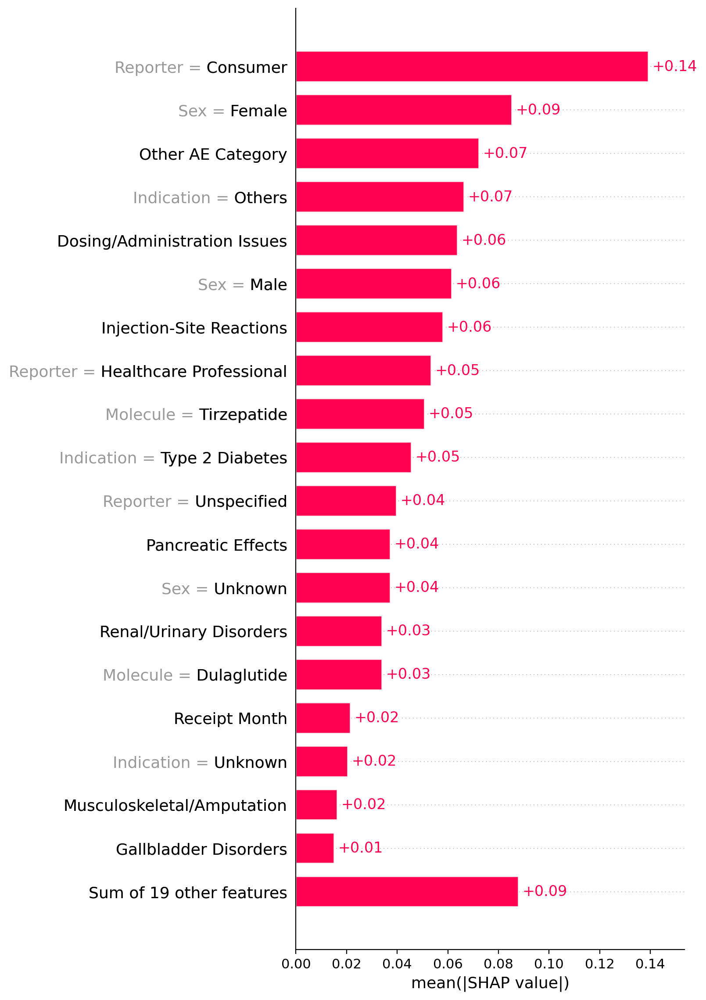

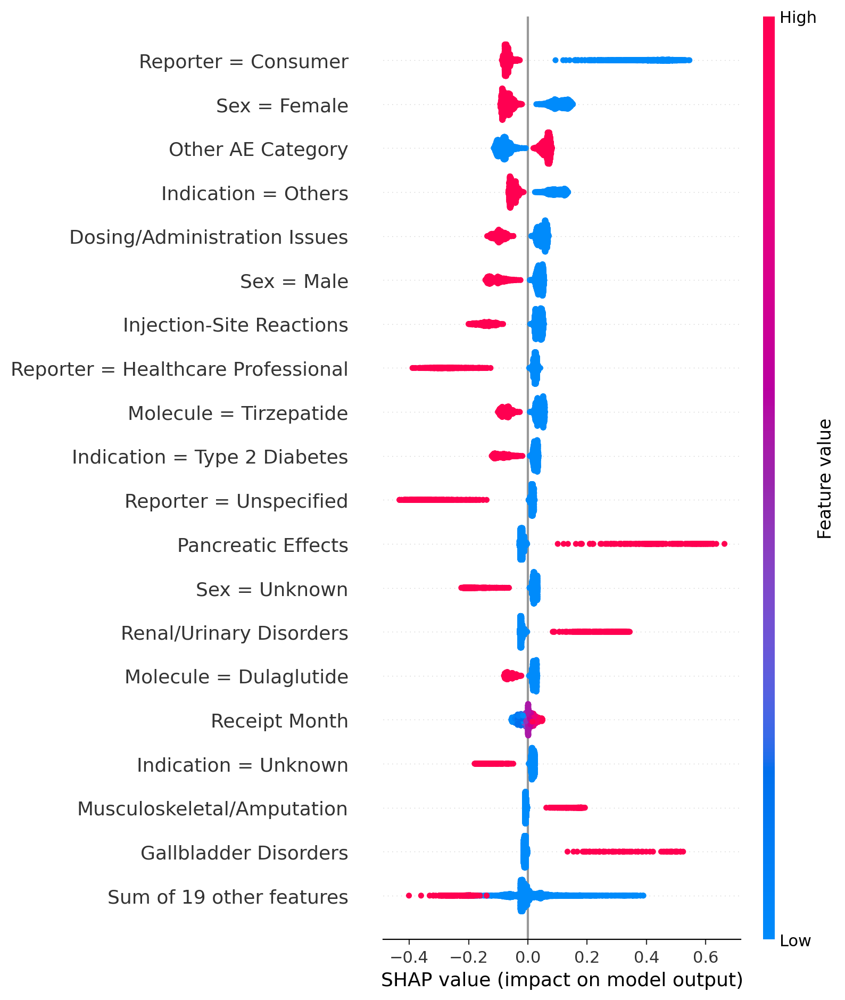

In [9]:
# ============================================================
# SHAP for base (uncalibrated) models
# - Use the SAME train/val/test group-aware split we already built
# - Fit base LR / RF on TRAIN2 (X_tr_feat, y_tr)
# - Explain on TEST (X_test_feat)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import shap

# ----------------------------
# 0) Fit base models (UNCALIBRATED)
# ----------------------------
logit = Pipeline(steps=[
    ("pre", pre),
    ("clf", LogisticRegression(
        max_iter=10000,
        solver="lbfgs",
        class_weight=class_weight
    ))
])
logit.fit(X_tr_feat, y_tr)

rf = Pipeline(steps=[
    ("pre", pre),
    ("clf", RandomForestClassifier(
        n_estimators=500,
        min_samples_leaf=30,
        class_weight=class_weight,
        random_state=42,
        n_jobs=-1
    ))
])
rf.fit(X_tr_feat, y_tr)

# ----------------------------
# 1) Grab fitted preprocessor + feature names (post-OHE)
# ----------------------------
preproc = logit.named_steps["pre"]  # same as rf.named_steps["pre"] (identical pre object)
feat_names_tx = preproc.get_feature_names_out().tolist()

import re

# Canonical human-readable labels
NICE_LABELS = {
    # AE categories
    "cat_dose_admin": "Dosing/Administration Issues",
    "cat_gi": "Gastrointestinal Disorders",
    "cat_inj_site": "Injection-Site Reactions",
    "cat_pancreas": "Pancreatic Effects",
    "cat_thyroid": "Thyroid Disorders",
    "cat_gb": "Gallbladder Disorders",
    "cat_metabolic": "Metabolic Effects",
    "cat_renal": "Renal/Urinary Disorders",
    "cat_psych": "Psychiatric Disorders",
    "cat_msk": "Musculoskeletal/Amputation",
    "cat_effectiveness": "Drug Effectiveness",
    "cat_other": "Other AE Category",

    # Exposure flags
    "is_brand_only": "Brand-Only Exposure",
    "is_generic_only": "Generic-Only Exposure",
    "is_mixed": "Mixed Brand/Generic Exposure",

    # Numeric
    "receipt_year": "Receipt Year",
    "receipt_month": "Receipt Month",
    "age_years": "Age (Years)"
}

def prettify_feature_name(raw: str) -> str:
    """
    Converts model feature names into publication-ready labels.
    """

    # Remove ColumnTransformer prefixes (num__, cat__, bin__)
    f = re.sub(r'^[^_]+__', '', raw)

    # Remove literal word "bucket"
    f = f.replace("bucket_", "").replace("_bucket", "")

    # Handle OneHot encoded categoricals
    for base in ["sex", "reporter", "indication", "molecule"]:
        if f.startswith(base + "_"):
            val = f[len(base) + 1:].replace("_", " ").title()
            return f"{base.title()} = {val}"

    # Handle known binary/numeric features
    if f in NICE_LABELS:
        return NICE_LABELS[f]

    # Fallback: title case with spaces
    return f.replace("_", " ").title()

pretty_names = [prettify_feature_name(n) for n in feat_names_tx]

# ----------------------------
# 2) Transform train/test into the model feature space
# ----------------------------
X_train_tx = preproc.transform(X_tr_feat)    # TRAIN2 only
X_test_tx  = preproc.transform(X_test_feat)  # TEST

def to_dense_df(X_tx, columns):
    if hasattr(X_tx, "toarray"):
        X_tx = X_tx.toarray()
    return pd.DataFrame(X_tx, columns=columns)

X_train_tx_df = to_dense_df(X_train_tx, pretty_names)
X_test_tx_df  = to_dense_df(X_test_tx,  pretty_names)

# Sample for speed (adjust sizes)
rng = np.random.default_rng(42)
bg_n   = min(3000, len(X_train_tx_df))
test_n = min(5000, len(X_test_tx_df))

bg_idx   = rng.choice(len(X_train_tx_df), size=bg_n, replace=False)
test_idx = rng.choice(len(X_test_tx_df),  size=test_n, replace=False)

bg_data   = X_train_tx_df.iloc[bg_idx]
test_data = X_test_tx_df.iloc[test_idx]

# ============================================================
# 3) SHAP for Logistic Regression
# ============================================================
lr_clf = logit.named_steps["clf"]

# bg_data and test_data are already preprocessed (post-OHE DataFrames)
# No need to transform again — just pass directly to the wrapper

def lr_predict_proba_tx(X):
    return lr_clf.predict_proba(X)[:, 1]

lr_explainer = shap.Explainer(lr_predict_proba_tx, bg_data, feature_names=pretty_names)
lr_shap = lr_explainer(test_data)

# Verify scale
print(f"Mean predicted prob: {lr_clf.predict_proba(bg_data)[:,1].mean():.4f}")
print(f"Mean SHAP value: {lr_shap.values.mean():.4f}")
print(f"Top feature mean |SHAP|: {np.abs(lr_shap.values).mean(axis=0).max():.4f}")

# Save global importance table
lr_importance = np.abs(lr_shap.values).mean(axis=0)
lr_imp_df = (pd.DataFrame({"feature": pretty_names, "mean_abs_shap": lr_importance})
             .sort_values("mean_abs_shap", ascending=False))
lr_imp_df.to_csv("shap_logreg_mean_abs_importance.csv", index=False)

TARGET_H = 1600  # pixels
DPI      = 200
HEIGHT_IN = TARGET_H / DPI

plt.figure(figsize=(9, HEIGHT_IN), dpi=DPI)
shap.plots.bar(lr_shap, max_display=20, show=False)
plt.tight_layout()
plt.savefig("shap_logreg_bar_top20.png", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close()

plt.figure(figsize=(9, HEIGHT_IN), dpi=DPI)
shap.plots.beeswarm(lr_shap, max_display=20, show=False)
plt.tight_layout()
plt.savefig("shap_logreg_beeswarm_top20.png", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close()

100%|===================| 9990/10000 [14:02<00:00]        

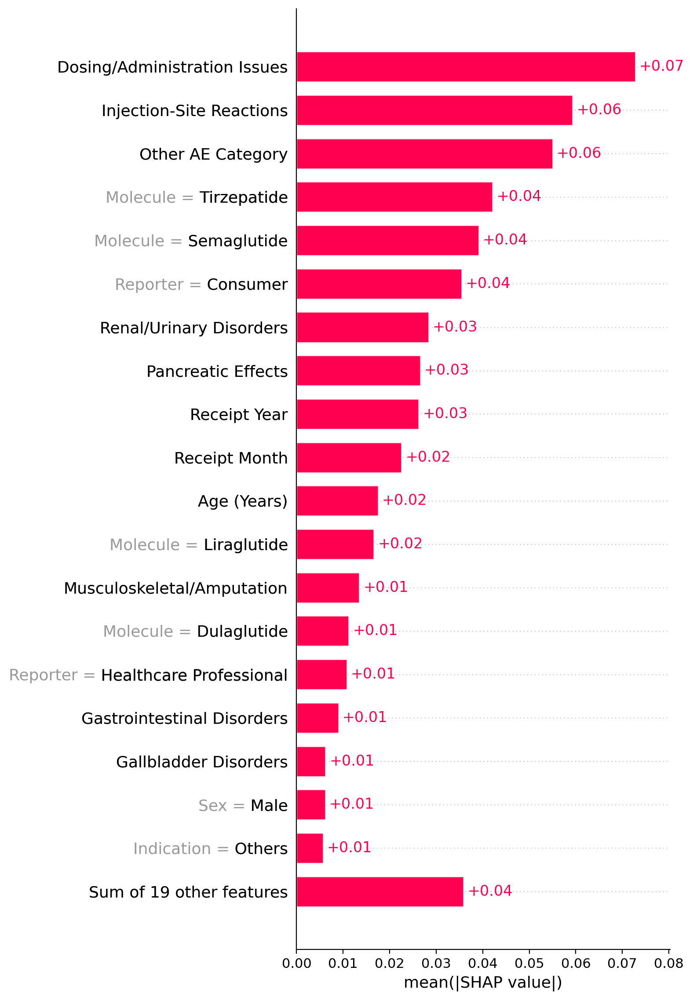

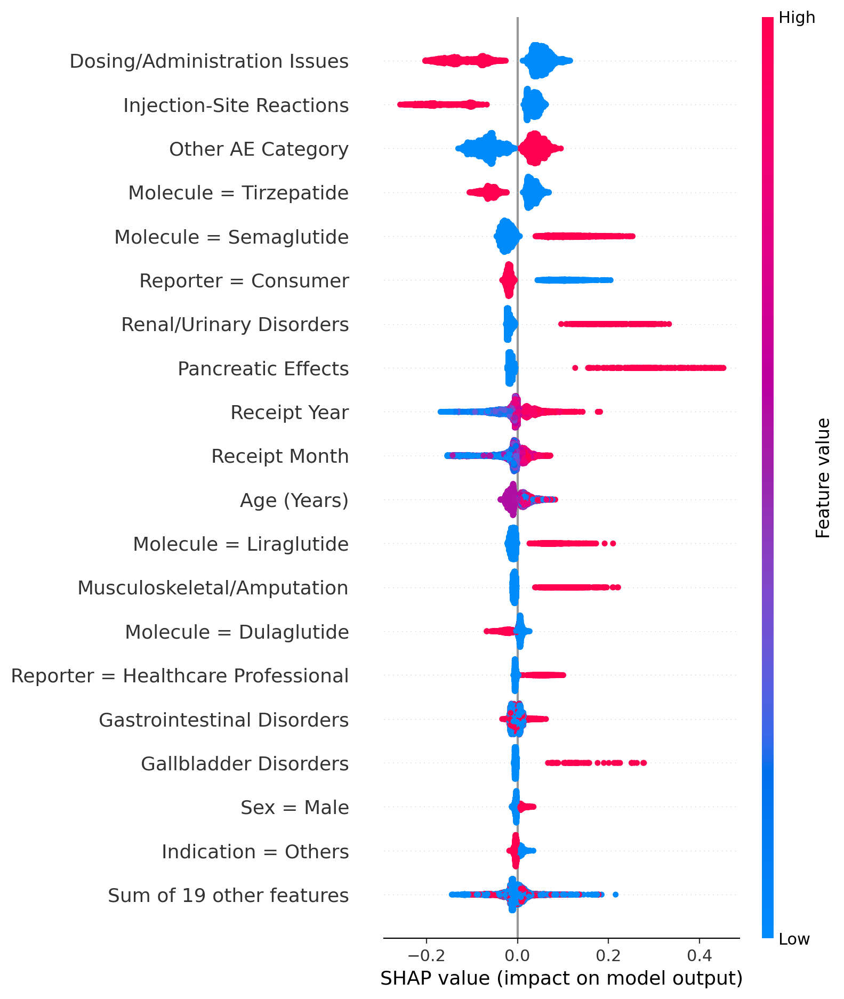

In [8]:
# ============================================================
# 4) SHAP for Random Forest (robust handling for binary output)
# ============================================================
rf_clf = rf.named_steps["clf"]

rf_explainer = shap.TreeExplainer(
    rf_clf,
    data=bg_data,
    feature_perturbation="interventional"
)

rf_shap = rf_explainer(test_data)

# ---- robust extraction of "positive class" (serious=1) SHAP values ----
rf_values = rf_shap.values
rf_base   = rf_shap.base_values

# Case A: list-of-arrays per class (older SHAP)
if isinstance(rf_values, list):
    rf_values_pos = rf_values[1]  # (n_samples, n_features)
    rf_base_pos   = rf_base[1] if isinstance(rf_base, list) else rf_base

# Case B: ndarray with output dim (n, f, 2) or (n, f)
else:
    rf_values = np.asarray(rf_values)
    rf_base   = np.asarray(rf_base)

    if rf_values.ndim == 3 and rf_values.shape[-1] == 2:
        rf_values_pos = rf_values[..., 1]  # (n_samples, n_features)
    else:
        rf_values_pos = rf_values           # (n_samples, n_features)

    # base values can be (n,2) or (n,) depending on SHAP version
    if rf_base.ndim == 2 and rf_base.shape[-1] == 2:
        rf_base_pos = rf_base[..., 1]       # (n_samples,)
    else:
        rf_base_pos = rf_base               # (n_samples,) or scalar

# Wrap as Explanation so shap.plots.* works consistently
rf_shap_pos = shap.Explanation(
    values=rf_values_pos,
    base_values=rf_base_pos,
    data=test_data.values,          # ok as ndarray
    feature_names=pretty_names
)

# Global importance (1D)
rf_importance = np.abs(rf_shap_pos.values).mean(axis=0)  # (n_features,)

rf_imp_df = (
    pd.DataFrame({"feature": pretty_names, "mean_abs_shap": rf_importance})
      .sort_values("mean_abs_shap", ascending=False)
)
rf_imp_df.to_csv("shap_rf_mean_abs_importance.csv", index=False)

plt.figure(figsize=(9, HEIGHT_IN), dpi=DPI)
shap.plots.bar(rf_shap_pos, max_display=20, show=False)
plt.tight_layout()
plt.savefig("shap_rf_bar_top20.png", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close()

plt.figure(figsize=(9, HEIGHT_IN), dpi=DPI)
shap.plots.beeswarm(rf_shap_pos, max_display=20, show=False)
plt.tight_layout()
plt.savefig("shap_rf_beeswarm_top20.png", dpi=DPI, bbox_inches="tight")
plt.show()
plt.close()

In [43]:
# ============================================================
# A6: Reporting Frequency vs PRR vs Mean |SHAP| (RF) comparison table
# ============================================================
import pandas as pd
import numpy as np

CAT_COLUMNS = [
    'cat_dose_admin','cat_inj_site','cat_gi','cat_pancreas','cat_thyroid',
    'cat_gb','cat_metabolic','cat_renal','cat_psych','cat_msk',
    'cat_effectiveness','cat_other'
]

# Reuse the existing NICE_LABELS mapping already defined in cell 131
# so the "feature" strings in rf_imp_df match these category names exactly
CAT_TO_PRETTY = {c: NICE_LABELS[c] for c in CAT_COLUMNS}

TARGET = 'serious'
N_total = len(ml_df)

freq_prr_rows = []
for cat_col in CAT_COLUMNS:
    in_cat     = ml_df[cat_col] >= 0.5
    not_in_cat = ~in_cat

    a = int(((in_cat) & (ml_df[TARGET] == 1)).sum())
    b = int(((in_cat) & (ml_df[TARGET] == 0)).sum())
    c = int(((not_in_cat) & (ml_df[TARGET] == 1)).sum())
    d = int(((not_in_cat) & (ml_df[TARGET] == 0)).sum())

    n_cat = a + b
    reporting_freq_pct = 100 * n_cat / N_total

    prr_num = a / (a + b) if (a + b) > 0 else np.nan
    prr_den = c / (c + d) if (c + d) > 0 else np.nan
    prr = prr_num / prr_den if (prr_den and prr_den > 0) else np.nan

    freq_prr_rows.append({
        'category': CAT_TO_PRETTY[cat_col],
        'cat_col': cat_col,
        'n_reports': n_cat,
        'reporting_freq_pct': round(reporting_freq_pct, 2),
        'serious_in_cat_pct': round(100 * a / n_cat, 1) if n_cat > 0 else np.nan,
        'PRR_serious': round(prr, 3) if not np.isnan(prr) else np.nan,
    })

freq_prr_df = pd.DataFrame(freq_prr_rows)

# ── Merge with RF mean |SHAP| (from cell 132's rf_imp_df) ──
rf_shap_lookup = rf_imp_df.set_index('feature')['mean_abs_shap'].to_dict()
freq_prr_df['mean_abs_shap_rf'] = freq_prr_df['category'].map(rf_shap_lookup)

# Sort by SHAP importance, descending
freq_prr_df = freq_prr_df.sort_values('mean_abs_shap_rf', ascending=False)

print("=== A6: Reporting Frequency vs PRR vs Mean |SHAP| (RF) ===")
print(freq_prr_df[['category','reporting_freq_pct','serious_in_cat_pct','PRR_serious','mean_abs_shap_rf']].to_string(index=False))

freq_prr_df.to_csv('ae_category_frequency_prr_shap.csv', index=False)
print("\nSaved: ae_category_frequency_prr_shap.csv")

=== A6: Reporting Frequency vs PRR vs Mean |SHAP| (RF) ===
                    category  reporting_freq_pct  serious_in_cat_pct  PRR_serious  mean_abs_shap_rf
Dosing/Administration Issues               31.55                 8.0        0.238          0.072770
    Injection-Site Reactions               20.96                 5.3        0.172          0.059313
           Other AE Category               45.70                34.9        1.959          0.055018
     Renal/Urinary Disorders                4.97                71.0        3.055          0.028360
          Pancreatic Effects                4.06                96.7        4.278          0.026573
  Musculoskeletal/Amputation                5.81                50.2        2.082          0.013474
  Gastrointestinal Disorders               26.78                32.5        1.404          0.008994
       Gallbladder Disorders                1.31                91.3        3.691          0.006240
           Metabolic Effects             

Make Panel Picture

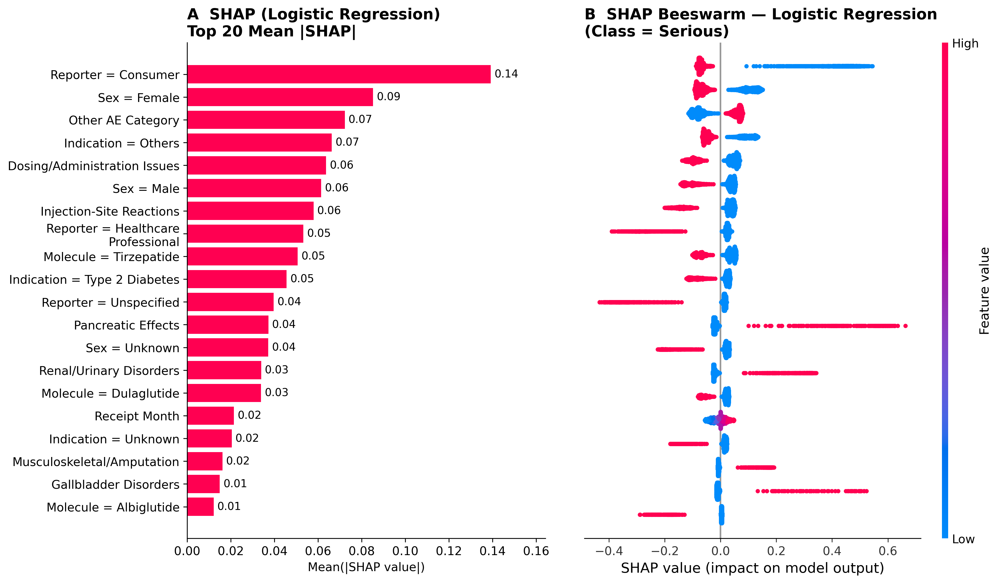

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import shap
import textwrap
import matplotlib as mpl

# -----------------------------
# Publication styling
# -----------------------------
mpl.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
})

def wrap_label(s, width=30):
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=False))

def remove_shap_guides(ax):
    ax.grid(False)
    # remove dotted guide lines SHAP may draw
    for line in list(ax.lines):
        if line.get_linestyle() in ("--", ":"):
            try:
                line.remove()
            except Exception:
                pass

# -----------------------------
# lr_shap must be shap.Explanation
# -----------------------------
topk = 20

# mean(|SHAP|) per feature
imp = np.abs(lr_shap.values).mean(axis=0)
idx = np.argsort(imp)[::-1][:topk]     # top features (descending importance)

# reverse for plotting so most important is at top
idx_plot = idx[::-1]

# labels + values for panel A
labels = [wrap_label(lr_shap.feature_names[i], width=30) for i in idx_plot]
vals   = imp[idx_plot]

# -----------------------------
# Figure layout
# -----------------------------
FIG_W, FIG_H, DPI = 16, 8, 300
fig = plt.figure(figsize=(FIG_W, FIG_H), dpi=DPI, facecolor="white")

gs = fig.add_gridspec(
    1, 2,
    width_ratios=[1.15, 1.35],
    wspace=0.10
)

# =============================
# Panel A — manual bar (clean + stable)
# =============================
ax1 = fig.add_subplot(gs[0, 0])
bar_color = "#ff0051"

ax1.barh(np.arange(topk), vals, color=bar_color, edgecolor="none")
ax1.set_yticks(np.arange(topk))
ax1.set_yticklabels(labels)
ax1.set_xlabel("Mean(|SHAP value|)")

xmax = float(vals.max()) * 1.18
ax1.set_xlim(0, xmax)

for y, v in enumerate(vals):
    ax1.text(v + xmax*0.01, y, f"{v:.02f}", va="center", ha="left", fontsize=10)

ax1.set_title("A  SHAP (Logistic Regression)\nTop 20 Mean |SHAP|", loc="left")
ax1.grid(False)
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# =============================
# Panel B — beeswarm (same top-20, same order)
# =============================
ax2 = fig.add_subplot(gs[0, 1])
plt.sca(ax2)

lr_top = lr_shap[:, idx][:, ::-1]   # same 20 features, same order as panel A

shap.plots.beeswarm(
    lr_top,
    max_display=topk,
    show=False,
    plot_size=None
)

ax2.set_title("B  SHAP Beeswarm — Logistic Regression\n(Class = Serious)", loc="left")
remove_shap_guides(ax2)

# KEY: prevent “middle overlap” by removing y labels on panel B
ax2.set_yticklabels([])
ax2.set_ylabel("")
ax2.tick_params(axis="y", length=0)

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)

# -----------------------------
# Final margins
# -----------------------------
fig.subplots_adjust(left=0.30, right=0.96, top=0.92, bottom=0.12)

plt.savefig("shap_logreg_panel_AB_pub.png", dpi=DPI, bbox_inches="tight", facecolor="white")
plt.savefig("shap_logreg_panel_AB_pub.pdf", bbox_inches="tight", facecolor="white")
plt.show()
plt.close()

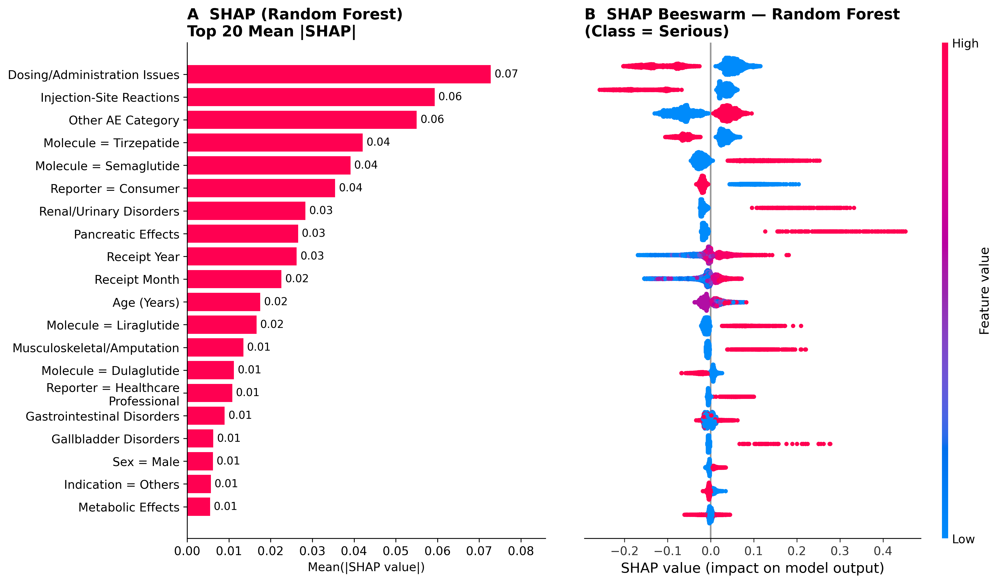

In [10]:

import numpy as np
import matplotlib.pyplot as plt
import shap
import textwrap
import matplotlib as mpl

mpl.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
})

def wrap_label(s, width=30):
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=False))

def remove_shap_guides(ax):
    ax.grid(False)
    # SHAP sometimes draws faint dotted guide lines as Line2D
    for line in list(ax.lines):
        # remove only very light guide lines
        if line.get_linestyle() in ("--", ":"):
            try:
                line.remove()
            except Exception:
                pass

# -----------------------------
# Use rf_shap_pos (Explanation)
# -----------------------------
topk = 20
imp = np.abs(rf_shap_pos.values).mean(axis=0)
idx = np.argsort(imp)[::-1][:topk]

# Reverse order so biggest at top in both panels
idx_plot = idx[::-1]
labels = [wrap_label(rf_shap_pos.feature_names[i], width=30) for i in idx_plot]
vals   = imp[idx_plot]

FIG_W, FIG_H, DPI = 16, 8, 300
fig = plt.figure(figsize=(FIG_W, FIG_H), dpi=DPI, facecolor="white")

gs = fig.add_gridspec(
    1, 2,
    width_ratios=[1.15, 1.35],
    wspace=0.1  # bigger gap
)

# =============================
# Panel A — bar
# =============================
ax1 = fig.add_subplot(gs[0, 0])
bar_color = "#ff0051"

ax1.barh(np.arange(topk), vals, color=bar_color, edgecolor="none")
ax1.set_yticks(np.arange(topk))
ax1.set_yticklabels(labels)
ax1.set_xlabel("Mean(|SHAP value|)")

xmax = float(vals.max()) * 1.18
ax1.set_xlim(0, xmax)

for y, v in enumerate(vals):
    ax1.text(v + xmax*0.01, y, f"{v:.02f}", va="center", ha="left", fontsize=10)

ax1.set_title("A  SHAP (Random Forest)\nTop 20 Mean |SHAP|", loc="left")
ax1.grid(False)
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# =============================
# Panel B — beeswarm
# =============================
ax2 = fig.add_subplot(gs[0, 1])
plt.sca(ax2)

rf_top = rf_shap_pos[:, idx][:, ::-1]  # same 20, same order as Panel A

shap.plots.beeswarm(
    rf_top,
    max_display=topk,
    show=False,
    plot_size=None
)

ax2.set_title("B  SHAP Beeswarm — Random Forest\n(Class = Serious)", loc="left")
remove_shap_guides(ax2)

# KEY FIX: remove y labels on Panel B so nothing spills into the middle
ax2.set_yticklabels([])
ax2.set_ylabel("")
ax2.tick_params(axis="y", length=0)

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)

# -----------------------------
# Final margins (more left room)
# -----------------------------
fig.subplots_adjust(left=0.30, right=0.96, top=0.92, bottom=0.12)

plt.savefig("shap_rf_panel_AB_pub.png", dpi=DPI, bbox_inches="tight", facecolor="white")
plt.savefig("shap_rf_panel_AB_pub.pdf", bbox_inches="tight", facecolor="white")
plt.show()
plt.close()

Tabular Transformer

In [14]:
!pip install -U tabular-transformer torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.1/532.1 MB 9.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 423.1/423.1 MB 12.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 366.2/366.2 MB 13.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.1/170.1 MB 25.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 MB 54.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 148.2 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.3/201.3 MB 20.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.0/206.0 MB 24.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 MB 57.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.9/145.9 MB 28.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.1/214.1 MB 22.8 MB/s eta 0:00:0000:0100:01
     

In [15]:
pip uninstall -y rtdl libzero

Note: you may need to restart the kernel to use updated packages.


Class weights (from TRAIN2): {0: 0.6723669120639266, 1: 1.9503943767773784}
TRAIN2 counts BEFORE: {0: 108124, 1: 37274}
TRAIN2 counts AFTER : {1: 108124, 0: 108124}
VAL counts          : {0: 27069, 1: 9258}
TEST counts         : {0: 45047, 1: 15540}
Saved splits:
  TRAIN2_BAL: ttf_splits/train2_bal.csv
  VAL      : ttf_splits/val.csv
  TEST     : ttf_splits/test.csv
start reading file, it may take a while..
read file completed.
num parameter tensors: 62, with 364,080 parameters
Transformer num decayed parameter tensors: 43, with 323,008 parameters
Transformer num non-decayed parameter tensors: 13, with 832 parameters
Output num decayed parameter tensors: 5, with 40,064 parameters
Output num non-decayed parameter tensors: 1, with 176 parameters
using fused AdamW: False


/home/zchu/FAERS/faers/lib/python3.10/site-packages/tabular_transformer/trainer.py:189: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  scaler = torch.amp.GradScaler(
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


step 0: train loss 0.6931, val loss 0.6931
0 | epoch 0.0000 | loss 0.6931 |lr 0.000000e+00 | 1118.26ms | mfu -100.00%
1 | epoch 0.0030 | loss 0.6932 |lr 5.000000e-06 | 205.48ms | mfu -100.00%
2 | epoch 0.0059 | loss 0.6931 |lr 1.000000e-05 | 207.75ms | mfu -100.00%
3 | epoch 0.0089 | loss 0.6931 |lr 1.500000e-05 | 203.23ms | mfu -100.00%
4 | epoch 0.0119 | loss 0.6931 |lr 2.000000e-05 | 218.89ms | mfu -100.00%
5 | epoch 0.0148 | loss 0.6931 |lr 2.500000e-05 | 222.86ms | mfu  0.04%
6 | epoch 0.0178 | loss 0.6931 |lr 3.000000e-05 | 214.73ms | mfu  0.04%
7 | epoch 0.0208 | loss 0.6930 |lr 3.500000e-05 | 195.60ms | mfu  0.04%
8 | epoch 0.0237 | loss 0.6929 |lr 4.000000e-05 | 206.39ms | mfu  0.04%
9 | epoch 0.0267 | loss 0.6930 |lr 4.500000e-05 | 211.49ms | mfu  0.04%
10 | epoch 0.0297 | loss 0.6930 |lr 5.000000e-05 | 203.68ms | mfu  0.04%
11 | epoch 0.0326 | loss 0.6928 |lr 5.500000e-05 | 194.15ms | mfu  0.04%
12 | epoch 0.0356 | loss 0.6928 |lr 6.000000e-05 | 201.50ms | mfu  0.04%
13 | ep

100%|██████████| 36/36 [00:01<00:00, 28.83it/s]


binary cross entropy loss: 0.352805
auc score: 0.915504
f1 macro score: 0.796533
samples: 36327, accuracy: 0.8334
save prediction output to file: out/val_predictions.csv
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 60/60 [00:02<00:00, 28.93it/s]


binary cross entropy loss: 0.351055
auc score: 0.917717
f1 macro score: 0.798993
samples: 60587, accuracy: 0.8349
save prediction output to file: out/test_predictions.csv
VAL prediction columns: ['prediction', 'probability']
TEST prediction columns: ['prediction', 'probability']

Using prob col (VAL): probability
Using prob col (TEST): probability
[INFO] probability seems to be P(class=0). Flipping. VAL AUC 0.084 -> 0.916
[SANITY] mean prob where prediction==1: 0.8030256628990173
[SANITY] mean prob where prediction==0: 0.14350101351737976

[TTF] Best VAL threshold (F1): 0.616801 | F1=0.7237 | P=0.7279 | R=0.7195

===== TabularTransformer (GroupSplit + TRAIN2 oversample + VAL threshold) =====
Threshold: 0.6168010234832764
ROC-AUC: 0.917717380351407
PR-AUC : 0.8275024376888475
Brier  : 0.1118856155550449
              precision    recall  f1-score   support

           0      0.905     0.908     0.906     45047
           1      0.730     0.724     0.727     15540

    accuracy          

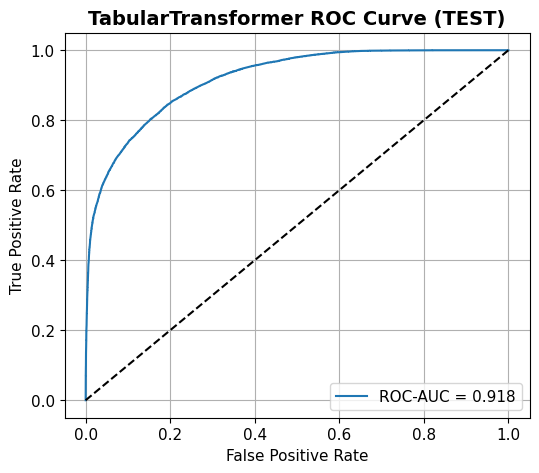

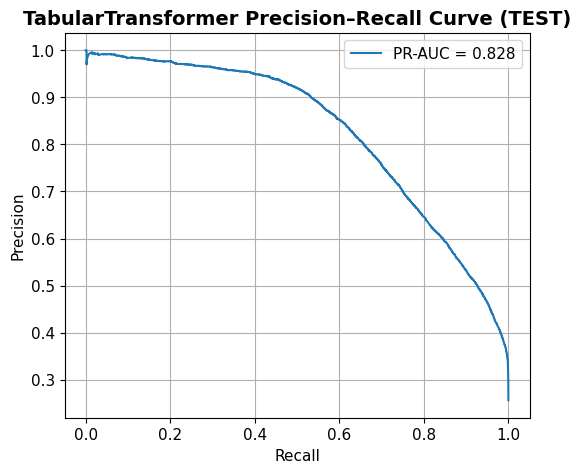

In [ ]:
# ============================================================
# Tabular Transformer (tabular_transformer / ttf)
# CONSISTENT with Logistic Regression + Random Forest:
#  1) Group-aware split by primaryid: TRAIN vs TEST (25%)
#  2) Group-aware split inside TRAIN: TRAIN2 vs VAL (20% of TRAIN)
#  3) Imbalance handling learned from TRAIN2:
#       - compute class weights (balanced) on TRAIN2 (manual)
#       - oversample TRAIN2 ONLY
#  4) Train on TRAIN2_bal (NO internal resplitting)
#  5) Tune threshold on VAL (maximize F1)
#  6) Final metrics on TEST using VAL threshold
#
# Fix for tabular_transformer build:
#  - For BINCLASS: dataset.n_class == 1  => must use output_dim=1
#  - loss_type must be 'BINCE' for binclass
#  - DataReader requires ALL columns be declared cat/num, so we include TARGET
#    in ensure_numerical_cols (schema compliance) while still using label=TARGET.
# ============================================================

# import shutil
# shutil.rmtree("out", ignore_errors=True)        # IMPORTANT: remove old checkpoint + feature stats
# shutil.rmtree("ttf_splits", ignore_errors=True) # optional: remove old CSVs

import os
import numpy as np
import pandas as pd
import torch
import tabular_transformer as ttf

from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    precision_recall_curve, classification_report, roc_curve
)
import matplotlib.pyplot as plt

# -------------------------
# 0) Load data
# -------------------------
try:
    ml_df
except NameError:
    ml_df = pd.read_csv("ml_df.csv")

# -------------------------
# 1) Columns
# -------------------------
TARGET = "serious"

NUMERIC_FEATURES = ["age_years", "receipt_year", "receipt_month"]
BINARY_FEATURES  = [
    "cat_dose_admin","cat_gi","cat_inj_site","cat_pancreas","cat_thyroid",
    "cat_gb","cat_metabolic","cat_renal","cat_psych","cat_msk",
    "cat_effectiveness","cat_other",
    "is_brand_only","is_generic_only","is_mixed"
]
NUMERIC_ALL = NUMERIC_FEATURES + BINARY_FEATURES

CAT_FEATURES = ["sex_bucket", "reporter_bucket", "indication_bucket", "molecule"]

ALL_COLS = ["primaryid"] + CAT_FEATURES + NUMERIC_ALL + [TARGET]
df = ml_df[ALL_COLS].copy()

# -------------------------
# 2) Hard dtype enforcement (BEFORE splitting)
# -------------------------
df["primaryid"] = df["primaryid"].astype(str)

# label: strict 0/1 int
df[TARGET] = pd.to_numeric(df[TARGET], errors="coerce").fillna(0).astype(np.int64)
df[TARGET] = (df[TARGET] > 0).astype(np.int64)

# numeric features float32
for c in NUMERIC_FEATURES:
    df[c] = pd.to_numeric(df[c], errors="coerce").astype("float32")

for c in BINARY_FEATURES:
    df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0).astype("float32")

# categoricals as string
for c in CAT_FEATURES:
    df[c] = df[c].astype("string").fillna("MISSING")

# -------------------------
# 3) Group-aware split: TRAIN vs TEST (25%)
# -------------------------
gss = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
train_idx, test_idx = next(gss.split(df, df[TARGET], groups=df["primaryid"]))
train_df = df.iloc[train_idx].copy()
test_df  = df.iloc[test_idx].copy()

# -------------------------
# 4) Group-aware split: TRAIN2 vs VAL (20% of TRAIN)
# -------------------------
gss2 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=42)
train2_idx, val_idx = next(gss2.split(train_df, train_df[TARGET], groups=train_df["primaryid"]))
train2_df = train_df.iloc[train2_idx].copy()
val_df    = train_df.iloc[val_idx].copy()

# -------------------------
# 5) Manual "balanced" class weights on TRAIN2 (reporting only)
#    w_c = n_samples / (n_classes * n_c)
# -------------------------
n0 = int((train2_df[TARGET] == 0).sum())
n1 = int((train2_df[TARGET] == 1).sum())
n  = n0 + n1
w0 = (n / (2.0 * n0)) if n0 > 0 else 1.0
w1 = (n / (2.0 * n1)) if n1 > 0 else 1.0
print("Class weights (from TRAIN2):", {0: float(w0), 1: float(w1)})

# -------------------------
# 6) Oversample TRAIN2 ONLY
# -------------------------
def oversample_train(df_in, target_col="serious", random_state=42):
    pos = df_in[df_in[target_col] == 1]
    neg = df_in[df_in[target_col] == 0]
    if len(pos) == 0 or len(neg) == 0:
        return df_in.sample(frac=1, random_state=random_state).reset_index(drop=True)
    if len(pos) < len(neg):
        pos_up = pos.sample(n=len(neg), replace=True, random_state=random_state)
        out = pd.concat([neg, pos_up], ignore_index=True)
    else:
        neg_up = neg.sample(n=len(pos), replace=True, random_state=random_state)
        out = pd.concat([pos, neg_up], ignore_index=True)
    return out.sample(frac=1, random_state=random_state).reset_index(drop=True)

train2_bal = oversample_train(train2_df, target_col=TARGET, random_state=42)

print("TRAIN2 counts BEFORE:", train2_df[TARGET].value_counts().to_dict())
print("TRAIN2 counts AFTER :", train2_bal[TARGET].value_counts().to_dict())
print("VAL counts          :", val_df[TARGET].value_counts().to_dict())
print("TEST counts         :", test_df[TARGET].value_counts().to_dict())

# -------------------------
# 7) Write CSV splits (drop primaryid, enforce column order/types)
# -------------------------
out_dir = "ttf_splits"
os.makedirs(out_dir, exist_ok=True)

feature_cols = CAT_FEATURES + NUMERIC_ALL + [TARGET]

def write_split(path, dfx):
    d = dfx.drop(columns=["primaryid"]).copy()
    d = d[feature_cols]

    # --- FORCE categoricals to be non-numeric strings (prevents type flips) ---
    for c in CAT_FEATURES:
        d[c] = d[c].astype(str).fillna("MISSING")
        d[c] = "CAT_" + d[c]   # <--- KEY LINE (prevents numeric inference)

    # label as 0/1 int (but ALSO include it in ensure_cat in DataReader)
    d[TARGET] = pd.to_numeric(d[TARGET], errors="coerce").fillna(0).astype(np.int64)
    d[TARGET] = (d[TARGET] > 0).astype(np.int64)

    for c in NUMERIC_ALL:
        d[c] = pd.to_numeric(d[c], errors="coerce").fillna(0).astype("float32")

    d.to_csv(path, index=False)


train_csv = os.path.join(out_dir, "train2_bal.csv")
val_csv   = os.path.join(out_dir, "val.csv")
test_csv  = os.path.join(out_dir, "test.csv")

write_split(train_csv, train2_bal)
write_split(val_csv, val_df)
write_split(test_csv, test_df)

print("Saved splits:")
print("  TRAIN2_BAL:", train_csv)
print("  VAL      :", val_csv)
print("  TEST     :", test_csv)

# -------------------------
# 8) DataReader schema:
#    This library requires ALL columns to be listed as cat or num.
#    Our CSV includes TARGET; declare it as numerical for schema compliance.
#    label=TARGET still tells it the target column.
# -------------------------
ENSURE_CAT = CAT_FEATURES + [TARGET]
ENSURE_NUM = NUMERIC_ALL

faers_reader = ttf.DataReader(
    file_path=train_csv,
    ensure_categorical_cols=ENSURE_CAT, # <-- includes TARGET for schema
    ensure_numerical_cols=ENSURE_NUM,   
    label=TARGET,
)

train_reader = faers_reader(file_path=train_csv)
val_reader   = faers_reader(file_path=val_csv)
test_reader  = faers_reader(file_path=test_csv)

# -------------------------
# 9) Hardware settings
# -------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
dtype  = "bfloat16" if (torch.cuda.is_available() and torch.cuda.is_bf16_supported()) else "float16"
ts = ttf.TrainSettings(wandb_log=False, device=device, dtype=dtype)

# -------------------------
# 10) Train params
#  - BINCLASS expects output_dim == n_class == 1
# -------------------------
tp = ttf.TrainParameters(
    max_iters=3000,
    learning_rate=5e-4,
    output_dim=1,          # <-- KEY FIX for n_class=1
    loss_type='BINCE',     # allowed for BINCLASS
    batch_size=512,
    eval_interval=100,
    eval_iters=20,
    warmup_iters=100,
    validate_split=0.2, # validation: 20% of training
    output_checkpoint='ckpt.pt',
)

hp = ttf.HyperParameters(dim=64, n_layers=6, n_heads=8, dropout=0.1)
trainer = ttf.Trainer(hp=hp, ts=ts)

# -------------------------
# 11) Train
# -------------------------
trainer.train(data_reader=train_reader, tp=tp, resume=False)

import os, glob
from pathlib import Path

print("CWD:", os.getcwd())
print("Does ./out exist?", os.path.exists("out"))
print("Top-level files:", sorted([p.name for p in Path(".").iterdir()]))

# show anything that looks like a checkpoint anywhere nearby
cands = glob.glob("**/*.pt", recursive=True) + glob.glob("**/*.pth", recursive=True)
print("Found pt/pth files (first 50):")
for p in sorted(cands)[:50]:
    print("  ", p)

print("Files in ./out:", glob.glob("out/*"))

# -------------------------
# 12) Predict on VAL + TEST
# -------------------------
predictor = ttf.Predictor(checkpoint='out/ckpt.pt')

pred_val_df = predictor.predict(
    data_reader=val_reader,
    save_as=("val_predictions.csv"),
)
pred_test_df = predictor.predict(
    data_reader=test_reader,
    save_as=("test_predictions.csv"),
)

print("VAL prediction columns:", list(pred_val_df.columns))
print("TEST prediction columns:", list(pred_test_df.columns))

# -------------------------
# 13) Get y_true from the split CSVs
# -------------------------
val_true  = pd.read_csv(val_csv)[TARGET].astype(int).to_numpy()
test_true = pd.read_csv(test_csv)[TARGET].astype(int).to_numpy()

# -------------------------
# 14) Extract raw probability column
# -------------------------
def find_prob_col(pred_df):
    candidates = ["probability", "prob_1", "proba", "y_prob", "score"]
    for c in candidates:
        if c in pred_df.columns:
            return c
    for c in pred_df.columns:
        if np.issubdtype(pred_df[c].dtype, np.number):
            return c
    raise RuntimeError(f"Could not find probability column in: {list(pred_df.columns)}")

prob_col_val  = find_prob_col(pred_val_df)
prob_col_test = find_prob_col(pred_test_df)
print("\nUsing prob col (VAL):", prob_col_val)
print("Using prob col (TEST):", prob_col_test)

val_prob_raw  = pd.to_numeric(pred_val_df[prob_col_val],  errors="coerce").fillna(0.5).to_numpy()
test_prob_raw = pd.to_numeric(pred_test_df[prob_col_test], errors="coerce").fillna(0.5).to_numpy()

val_prob_raw  = np.nan_to_num(val_prob_raw,  nan=0.5, posinf=1.0, neginf=0.0).clip(0, 1)
test_prob_raw = np.nan_to_num(test_prob_raw, nan=0.5, posinf=1.0, neginf=0.0).clip(0, 1)

# -------------------------
# 15) Auto-fix probability direction (P(class=0) vs P(class=1))
#     Pick orientation that yields higher ROC-AUC on VAL.
# -------------------------
def orient_prob_using_val(y_true_val, prob_val_raw, prob_test_raw):
    auc_raw  = roc_auc_score(y_true_val, prob_val_raw)
    auc_flip = roc_auc_score(y_true_val, 1.0 - prob_val_raw)
    if auc_flip > auc_raw:
        print(f"[INFO] probability seems to be P(class=0). Flipping. VAL AUC {auc_raw:.3f} -> {auc_flip:.3f}")
        return 1.0 - prob_val_raw, 1.0 - prob_test_raw
    else:
        print(f"[INFO] probability seems to be P(class=1). Keeping. VAL AUC {auc_raw:.3f}")
        return prob_val_raw, prob_test_raw

val_prob, test_prob = orient_prob_using_val(val_true, val_prob_raw, test_prob_raw)

# Quick sanity: mean prob by predicted class (optional)
try:
    pred_cls = pd.to_numeric(pred_test_df.get("prediction", np.nan), errors="coerce")
    if pred_cls.notna().any():
        print("[SANITY] mean prob where prediction==1:", float(np.nanmean(test_prob[pred_cls.to_numpy()==1])))
        print("[SANITY] mean prob where prediction==0:", float(np.nanmean(test_prob[pred_cls.to_numpy()==0])))
except Exception as e:
    print("[SANITY] skipped:", e)

# -------------------------
# 16) Tune threshold on VAL (maximize F1)
# -------------------------
def pick_threshold_f1(y_true, proba):
    p, r, t = precision_recall_curve(y_true, proba)
    # t has length len(p)-1
    f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-9)
    best_idx = int(np.argmax(f1))
    return float(t[best_idx]), float(f1[best_idx]), float(p[:-1][best_idx]), float(r[:-1][best_idx])

thr, f1, prec, rec = pick_threshold_f1(val_true, val_prob)
print(f"\n[TTF] Best VAL threshold (F1): {thr:.6f} | F1={f1:.4f} | P={prec:.4f} | R={rec:.4f}")

# -------------------------
# 17) Final TEST evaluation
# -------------------------
def evaluate(name, y_true, proba, threshold):
    pred = (proba >= threshold).astype(int)
    print(f"\n===== {name} =====")
    print("Threshold:", threshold)
    print("ROC-AUC:", roc_auc_score(y_true, proba))
    print("PR-AUC :", average_precision_score(y_true, proba))
    print("Brier  :", brier_score_loss(y_true, proba))
    print(classification_report(y_true, pred, digits=3))

evaluate("TabularTransformer (GroupSplit + TRAIN2 oversample + VAL threshold)", test_true, test_prob, thr)

auc   = roc_auc_score(test_true, test_prob)
ap    = average_precision_score(test_true, test_prob)
brier = brier_score_loss(test_true, test_prob)
print(f"\n[TabularTransformer] ROC-AUC={auc:.3f}  PR-AUC={ap:.3f}  Brier={brier:.3f}")

# -------------------------
# 18) Curves (TEST)
# -------------------------
fpr, tpr, _ = roc_curve(test_true, test_prob)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"ROC-AUC = {auc:.3f}")
plt.plot([0,1],[0,1],"k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("TabularTransformer ROC Curve (TEST)")
plt.legend()
plt.grid(True)
plt.show()

prec_curve, rec_curve, _ = precision_recall_curve(test_true, test_prob)
plt.figure(figsize=(6,5))
plt.plot(rec_curve, prec_curve, label=f"PR-AUC = {ap:.3f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("TabularTransformer Precision–Recall Curve (TEST)")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# ============================================================
# ABLATION: TTF (no cat_* features)
# ============================================================
import shutil, os
import tabular_transformer as ttf

# ── 1. Remove cat_* from column lists ──
ABLATION_DROP = [
    'cat_dose_admin','cat_gi','cat_inj_site','cat_pancreas','cat_thyroid',
    'cat_gb','cat_metabolic','cat_renal','cat_psych','cat_msk',
    'cat_effectiveness','cat_other'
]
BINARY_FEATURES_NOCAT = ['is_brand_only', 'is_generic_only', 'is_mixed']
NUMERIC_ALL_NOCAT = NUMERIC_FEATURES + BINARY_FEATURES_NOCAT

# ── 2. Rebuild splits without cat_* ──
ALL_COLS_NOCAT = ['primaryid'] + CAT_FEATURES + NUMERIC_ALL_NOCAT + [TARGET]
df_nocat = ml_df[ALL_COLS_NOCAT].copy()

# same dtype enforcement as original cell
df_nocat['primaryid'] = df_nocat['primaryid'].astype(str)
df_nocat[TARGET] = pd.to_numeric(df_nocat[TARGET], errors='coerce').fillna(0).astype(np.int64)
df_nocat[TARGET] = (df_nocat[TARGET] > 0).astype(np.int64)
for col in NUMERIC_FEATURES:
    df_nocat[col] = pd.to_numeric(df_nocat[col], errors='coerce').astype('float32')
for col in BINARY_FEATURES_NOCAT:
    df_nocat[col] = pd.to_numeric(df_nocat[col], errors='coerce').fillna(0).astype('float32')
for col in CAT_FEATURES:
    df_nocat[col] = df_nocat[col].astype('string').fillna('MISSING')

# same group-aware splits
gss  = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
gss2 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=42)
train_idx_n, test_idx_n = next(gss.split(df_nocat, df_nocat[TARGET], groups=df_nocat['primaryid']))
train_df_n = df_nocat.iloc[train_idx_n].copy()
test_df_n  = df_nocat.iloc[test_idx_n].copy()
train2_idx_n, val_idx_n = next(gss2.split(train_df_n, train_df_n[TARGET], groups=train_df_n['primaryid']))
train2_df_n = train_df_n.iloc[train2_idx_n].copy()
val_df_n    = train_df_n.iloc[val_idx_n].copy()
train2_bal_n = oversample_train(train2_df_n, target_col=TARGET, random_state=42)

# ── 3. Write no-cat CSV splits ──
out_dir_n = 'ttf_splits_nocat'
os.makedirs(out_dir_n, exist_ok=True)
feature_cols_nocat = CAT_FEATURES + NUMERIC_ALL_NOCAT + [TARGET]

def write_split_nocat(path, dfx):
    d = dfx.drop(columns=['primaryid']).copy()[feature_cols_nocat]
    for col in CAT_FEATURES:
        d[col] = 'CAT_' + d[col].astype(str).fillna('MISSING')
    d[TARGET] = pd.to_numeric(d[TARGET], errors='coerce').fillna(0).astype(np.int64)
    d[TARGET] = (d[TARGET] > 0).astype(np.int64)
    for col in NUMERIC_ALL_NOCAT:
        d[col] = pd.to_numeric(d[col], errors='coerce').fillna(0).astype('float32')
    d.to_csv(path, index=False)

train_csv_n = os.path.join(out_dir_n, 'train2_bal.csv')
val_csv_n   = os.path.join(out_dir_n, 'val.csv')
test_csv_n  = os.path.join(out_dir_n, 'test.csv')
write_split_nocat(train_csv_n, train2_bal_n)
write_split_nocat(val_csv_n,   val_df_n)
write_split_nocat(test_csv_n,  test_df_n)
print('Saved no-cat TTF splits.')

# ── 4. Train TTF on no-cat features ──
# clear old checkpoint so it doesn't resume from full-feature run
# shutil.rmtree('out_nocat_ttf', ignore_errors=True)
# os.makedirs('out_nocat_ttf', exist_ok=True)

ENSURE_CAT_N = CAT_FEATURES + [TARGET]
ENSURE_NUM_N = NUMERIC_ALL_NOCAT

faers_reader_n = ttf.DataReader(
    file_path=train_csv_n,
    ensure_categorical_cols=ENSURE_CAT_N,
    ensure_numerical_cols=ENSURE_NUM_N,
    label=TARGET,
)
train_reader_n = faers_reader_n(file_path=train_csv_n)
val_reader_n   = faers_reader_n(file_path=val_csv_n)
test_reader_n  = faers_reader_n(file_path=test_csv_n)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
dtype  = 'bfloat16' if (torch.cuda.is_available() and torch.cuda.is_bf16_supported()) else 'float16'
ts_n = ttf.TrainSettings(wandb_log=False, device=device, dtype=dtype)
tp_n = ttf.TrainParameters(
    max_iters=3000, learning_rate=5e-4, output_dim=1,
    loss_type='BINCE', batch_size=512, eval_interval=100,
    eval_iters=20, warmup_iters=100, validate_split=0.2,
    output_checkpoint='ckpt_nocat_ttf.pt',
)
hp_n = ttf.HyperParameters(dim=64, n_layers=6, n_heads=8, dropout=0.1)
trainer_n = ttf.Trainer(hp=hp_n, ts=ts_n)
trainer_n.train(data_reader=train_reader_n, tp=tp_n, resume=False)

# ── 5. Predict and evaluate ──
predictor_n = ttf.Predictor(checkpoint='out/ckpt_nocat_ttf.pt')
pred_val_n  = predictor_n.predict(data_reader=val_reader_n,  save_as='val_predictions_nocat_ttf.csv')
pred_test_n = predictor_n.predict(data_reader=test_reader_n, save_as='test_predictions_nocat_ttf.csv')

val_true_n  = pd.read_csv(val_csv_n)[TARGET].astype(int).to_numpy()
test_true_n = pd.read_csv(test_csv_n)[TARGET].astype(int).to_numpy()

prob_col_n = find_prob_col(pred_test_n)
ttf_prob_nocat = pred_test_n[prob_col_n].to_numpy()
ttf_val_prob_n = pred_val_n[prob_col_n].to_numpy()

# flip if needed
if roc_auc_score(test_true_n, ttf_prob_nocat) < 0.5:
    ttf_prob_nocat = 1 - ttf_prob_nocat
    ttf_val_prob_n = 1 - ttf_val_prob_n

results_nocat.append(eval_nocat(test_true_n, ttf_prob_nocat, 'TTF (no cat)'))

In [19]:
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss

# Reload predictions from saved CSV
pred_test_n = pd.read_csv('out/test_predictions_nocat_ttf.csv')
test_true_n = pd.read_csv(test_csv_n)[TARGET].astype(int).to_numpy()

prob_col_n = find_prob_col(pred_test_n)
ttf_prob_nocat = pred_test_n[prob_col_n].to_numpy()

if roc_auc_score(test_true_n, ttf_prob_nocat) < 0.5:
    ttf_prob_nocat = 1 - ttf_prob_nocat

auroc = roc_auc_score(test_true_n, ttf_prob_nocat)
prauc = average_precision_score(test_true_n, ttf_prob_nocat)
brier = brier_score_loss(test_true_n, ttf_prob_nocat)

print(f"TTF (no cat) — AUROC: {auroc:.4f}, PR-AUC: {prauc:.4f}, Brier: {brier:.4f}")

TTF (no cat) — AUROC: 0.8171, PR-AUC: 0.6994, Brier: 0.1511


Shapley Analysis for Tabular Transformer

load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 36/36 [00:01<00:00, 25.48it/s]


binary cross entropy loss: 0.352805
auc score: 0.915504
f1 macro score: 0.796533
samples: 36327, accuracy: 0.8334
[SHAP] ORIENT_FLIP=True (VAL AUC raw=0.0845, flip=0.9155)
Building SHAP explainer...
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 78.77it/s]

binary cross entropy loss: 1.866875
auc score: 0.457200
f1 macro score: 0.416667
samples: 100, accuracy: 0.4400
Computing SHAP values...


  0%|          | 0/300 [00:00<?, ?it/s]

load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 282.90it/s]

binary cross entropy loss: 2.738269


auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 23.76it/s]


binary cross entropy loss: 2.047611
auc score: 0.492773
f1 macro score: 0.462512
samples: 10000, accuracy: 0.4781
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 316.50it/s]


binary cross entropy loss: 2.892783
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.07it/s]


binary cross entropy loss: 2.209002
auc score: 0.476053
f1 macro score: 0.408709
samples: 10000, accuracy: 0.4850
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 350.34it/s]


binary cross entropy loss: 0.699070
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.08it/s]


binary cross entropy loss: 1.248381
auc score: 0.472527
f1 macro score: 0.473870
samples: 10000, accuracy: 0.4761
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 381.72it/s]


binary cross entropy loss: 0.778957
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.60it/s]


binary cross entropy loss: 1.213071
auc score: 0.477784
f1 macro score: 0.476561
samples: 10000, accuracy: 0.4767
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 356.57it/s]


binary cross entropy loss: 1.051582
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.88it/s]

binary cross entropy loss: 1.368282
auc score: 0.469893
f1 macro score: 0.415435
samples: 10000, accuracy: 0.4768
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.55it/s]


binary cross entropy loss: 0.749574
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.30it/s]


binary cross entropy loss: 1.286605
auc score: 0.467728
f1 macro score: 0.419985
samples: 10000, accuracy: 0.4725
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 331.62it/s]


binary cross entropy loss: 0.769356
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.83it/s]


binary cross entropy loss: 1.206063
auc score: 0.471437
f1 macro score: 0.468418
samples: 10000, accuracy: 0.4688
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 331.20it/s]


binary cross entropy loss: 2.503649
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 28.65it/s]


binary cross entropy loss: 2.007989
auc score: 0.476773
f1 macro score: 0.405718
samples: 10000, accuracy: 0.4747
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 327.55it/s]


binary cross entropy loss: 0.971442
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.89it/s]


binary cross entropy loss: 1.322573
auc score: 0.467847
f1 macro score: 0.416014
samples: 10000, accuracy: 0.4805
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 352.31it/s]


binary cross entropy loss: 0.953363
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 28.54it/s]


binary cross entropy loss: 1.294304
auc score: 0.471211
f1 macro score: 0.464886
samples: 10000, accuracy: 0.4678
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 369.48it/s]


binary cross entropy loss: 0.708691
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.40it/s]


binary cross entropy loss: 1.187450
auc score: 0.470369
f1 macro score: 0.473915
samples: 10000, accuracy: 0.4765
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 345.81it/s]


binary cross entropy loss: 0.705386
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.61it/s]


binary cross entropy loss: 1.226188
auc score: 0.473033
f1 macro score: 0.447637
samples: 10000, accuracy: 0.4758
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 314.42it/s]


binary cross entropy loss: 0.694345
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.37it/s]


binary cross entropy loss: 1.218225
auc score: 0.475344
f1 macro score: 0.475242
samples: 10000, accuracy: 0.4771
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 307.03it/s]


binary cross entropy loss: 0.979051
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.28it/s]


binary cross entropy loss: 1.280759
auc score: 0.472145
f1 macro score: 0.410174
samples: 10000, accuracy: 0.4805
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 304.29it/s]


binary cross entropy loss: 2.829113
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.88it/s]


binary cross entropy loss: 2.153367
auc score: 0.476178
f1 macro score: 0.412294
samples: 10000, accuracy: 0.4831
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 299.79it/s]


binary cross entropy loss: 1.347649
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.33it/s]


binary cross entropy loss: 1.572733
auc score: 0.479505
f1 macro score: 0.402477
samples: 10000, accuracy: 0.4823
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 353.59it/s]


binary cross entropy loss: 1.939628
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.18it/s]


binary cross entropy loss: 1.537731
auc score: 0.499375
f1 macro score: 0.472064
samples: 10000, accuracy: 0.4818
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 374.59it/s]


binary cross entropy loss: 2.706939
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.79it/s]


binary cross entropy loss: 2.121471
auc score: 0.484558
f1 macro score: 0.409526
samples: 10000, accuracy: 0.4855
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.90it/s]


binary cross entropy loss: 1.221568
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.84it/s]


binary cross entropy loss: 1.356905
auc score: 0.477175
f1 macro score: 0.464166
samples: 10000, accuracy: 0.4744
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 310.41it/s]


binary cross entropy loss: 3.505173
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.21it/s]


binary cross entropy loss: 2.462359
auc score: 0.487775
f1 macro score: 0.404824
samples: 10000, accuracy: 0.4856
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 326.28it/s]


binary cross entropy loss: 2.693848
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.52it/s]


binary cross entropy loss: 1.884575
auc score: 0.502431
f1 macro score: 0.460561
samples: 10000, accuracy: 0.4829
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 351.28it/s]


binary cross entropy loss: 2.377619
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.65it/s]


binary cross entropy loss: 2.003501
auc score: 0.480472
f1 macro score: 0.406495
samples: 10000, accuracy: 0.4802
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 348.83it/s]


binary cross entropy loss: 0.974397
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.36it/s]


binary cross entropy loss: 1.321688
auc score: 0.475078
f1 macro score: 0.424934
samples: 10000, accuracy: 0.4843
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 377.83it/s]


binary cross entropy loss: 0.694050
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.65it/s]


binary cross entropy loss: 1.247107
auc score: 0.477919
f1 macro score: 0.485428
samples: 10000, accuracy: 0.4859
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 334.39it/s]


binary cross entropy loss: 1.155591
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.40it/s]


binary cross entropy loss: 1.625918
auc score: 0.469319
f1 macro score: 0.428258
samples: 10000, accuracy: 0.4735
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 330.65it/s]


binary cross entropy loss: 0.806345
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.23it/s]


binary cross entropy loss: 1.318087
auc score: 0.467073
f1 macro score: 0.414340
samples: 10000, accuracy: 0.4719
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 309.84it/s]


binary cross entropy loss: 1.005196
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.88it/s]


binary cross entropy loss: 1.366619
auc score: 0.466304
f1 macro score: 0.406912
samples: 10000, accuracy: 0.4773
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 305.66it/s]


binary cross entropy loss: 1.519743
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.24it/s]


binary cross entropy loss: 1.650387
auc score: 0.479639
f1 macro score: 0.418756
samples: 10000, accuracy: 0.4753
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 384.66it/s]


binary cross entropy loss: 3.489855
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.96it/s]


binary cross entropy loss: 2.348127
auc score: 0.487011
f1 macro score: 0.414610
samples: 10000, accuracy: 0.4834
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 395.88it/s]


binary cross entropy loss: 3.019089
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.86it/s]


binary cross entropy loss: 2.185467
auc score: 0.487128
f1 macro score: 0.407724
samples: 10000, accuracy: 0.4885
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.33it/s]


binary cross entropy loss: 2.596727
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.88it/s]


binary cross entropy loss: 1.891104
auc score: 0.495342
f1 macro score: 0.462040
samples: 10000, accuracy: 0.4792
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 323.83it/s]


binary cross entropy loss: 1.086317
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.36it/s]


binary cross entropy loss: 1.298531
auc score: 0.487003
f1 macro score: 0.442449
samples: 10000, accuracy: 0.4878
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 307.21it/s]


binary cross entropy loss: 0.727742
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.31it/s]


binary cross entropy loss: 1.182259
auc score: 0.484222
f1 macro score: 0.471046
samples: 10000, accuracy: 0.4778
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 389.37it/s]


binary cross entropy loss: 2.609726
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.60it/s]


binary cross entropy loss: 2.186356
auc score: 0.478167
f1 macro score: 0.401096
samples: 10000, accuracy: 0.4788
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 323.96it/s]


binary cross entropy loss: 2.833482
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.90it/s]


binary cross entropy loss: 2.176346
auc score: 0.476488
f1 macro score: 0.400844
samples: 10000, accuracy: 0.4815
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 362.92it/s]


binary cross entropy loss: 2.545112
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.08it/s]


binary cross entropy loss: 1.835573
auc score: 0.502388
f1 macro score: 0.456852
samples: 10000, accuracy: 0.4797
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 345.86it/s]


binary cross entropy loss: 0.698274
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 23.41it/s]


binary cross entropy loss: 1.179490
auc score: 0.470464
f1 macro score: 0.436149
samples: 10000, accuracy: 0.4796
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 346.78it/s]


binary cross entropy loss: 1.100752
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.20it/s]


binary cross entropy loss: 1.334004
auc score: 0.483968
f1 macro score: 0.435909
samples: 10000, accuracy: 0.4857
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 359.69it/s]


binary cross entropy loss: 3.353885
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.52it/s]


binary cross entropy loss: 2.241601
auc score: 0.495939
f1 macro score: 0.452482
samples: 10000, accuracy: 0.4854
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 388.87it/s]


binary cross entropy loss: 2.106087
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.63it/s]


binary cross entropy loss: 1.721597
auc score: 0.491533
f1 macro score: 0.456354
samples: 10000, accuracy: 0.4746
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 370.72it/s]


binary cross entropy loss: 3.071140
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.73it/s]


binary cross entropy loss: 2.143087
auc score: 0.484798
f1 macro score: 0.404768
samples: 10000, accuracy: 0.4808
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 329.20it/s]


binary cross entropy loss: 1.473860
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.98it/s]


binary cross entropy loss: 1.685236
auc score: 0.479363
f1 macro score: 0.407329
samples: 10000, accuracy: 0.4816
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 334.07it/s]


binary cross entropy loss: 0.773292
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.72it/s]


binary cross entropy loss: 1.141494
auc score: 0.479212
f1 macro score: 0.465409
samples: 10000, accuracy: 0.4869
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 322.59it/s]


binary cross entropy loss: 2.466780
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.76it/s]


binary cross entropy loss: 1.773302
auc score: 0.496653
f1 macro score: 0.456359
samples: 10000, accuracy: 0.4764
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 327.83it/s]


binary cross entropy loss: 1.558636
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.32it/s]


binary cross entropy loss: 1.709295
auc score: 0.475827
f1 macro score: 0.424751
samples: 10000, accuracy: 0.4739
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 361.36it/s]


binary cross entropy loss: 3.454481
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.59it/s]


binary cross entropy loss: 2.381867
auc score: 0.488893
f1 macro score: 0.413908
samples: 10000, accuracy: 0.4817
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.33it/s]


binary cross entropy loss: 0.723405
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.17it/s]


binary cross entropy loss: 1.194136
auc score: 0.475471
f1 macro score: 0.468788
samples: 10000, accuracy: 0.4690
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 359.78it/s]


binary cross entropy loss: 0.809700
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.66it/s]


binary cross entropy loss: 1.289060
auc score: 0.468087
f1 macro score: 0.467742
samples: 10000, accuracy: 0.4680
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 327.14it/s]


binary cross entropy loss: 1.833134
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.23it/s]


binary cross entropy loss: 1.507925
auc score: 0.503337
f1 macro score: 0.466083
samples: 10000, accuracy: 0.4841
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 306.47it/s]


binary cross entropy loss: 1.993341
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 22.66it/s]


binary cross entropy loss: 1.906563
auc score: 0.477636
f1 macro score: 0.407794
samples: 10000, accuracy: 0.4782
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 314.34it/s]


binary cross entropy loss: 2.450879
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 22.73it/s]


binary cross entropy loss: 1.734746
auc score: 0.501141
f1 macro score: 0.459993
samples: 10000, accuracy: 0.4847
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 311.20it/s]


binary cross entropy loss: 0.858041
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.36it/s]


binary cross entropy loss: 1.171208
auc score: 0.473703
f1 macro score: 0.464781
samples: 10000, accuracy: 0.4654
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 334.79it/s]


binary cross entropy loss: 0.776026
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.59it/s]


binary cross entropy loss: 1.313337
auc score: 0.469340
f1 macro score: 0.423876
samples: 10000, accuracy: 0.4774
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 378.79it/s]


binary cross entropy loss: 1.303799
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.91it/s]


binary cross entropy loss: 1.343589
auc score: 0.479438
f1 macro score: 0.457407
samples: 10000, accuracy: 0.4678
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 368.41it/s]


binary cross entropy loss: 1.707135
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.00it/s]


binary cross entropy loss: 1.637642
auc score: 0.475846
f1 macro score: 0.410303
samples: 10000, accuracy: 0.4818
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 341.42it/s]


binary cross entropy loss: 0.772144
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.80it/s]


binary cross entropy loss: 1.217067
auc score: 0.466595
f1 macro score: 0.412705
samples: 10000, accuracy: 0.4798
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 364.88it/s]


binary cross entropy loss: 0.703438
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.24it/s]


binary cross entropy loss: 1.168143
auc score: 0.461602
f1 macro score: 0.425746
samples: 10000, accuracy: 0.4719
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 333.23it/s]


binary cross entropy loss: 2.675203
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.34it/s]


binary cross entropy loss: 2.086502
auc score: 0.476186
f1 macro score: 0.399012
samples: 10000, accuracy: 0.4820
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 372.30it/s]


binary cross entropy loss: 0.747366
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 23.76it/s]


binary cross entropy loss: 1.247838
auc score: 0.466219
f1 macro score: 0.464155
samples: 10000, accuracy: 0.4657
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 334.82it/s]


binary cross entropy loss: 2.010606
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.44it/s]


binary cross entropy loss: 1.597632
auc score: 0.502568
f1 macro score: 0.482429
samples: 10000, accuracy: 0.4849
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 321.21it/s]


binary cross entropy loss: 0.969852
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.28it/s]


binary cross entropy loss: 1.374264
auc score: 0.470687
f1 macro score: 0.409231
samples: 10000, accuracy: 0.4791
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 274.50it/s]


binary cross entropy loss: 0.782090
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.76it/s]


binary cross entropy loss: 1.245892
auc score: 0.481871
f1 macro score: 0.477246
samples: 10000, accuracy: 0.4805
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 374.73it/s]


binary cross entropy loss: 0.784361
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.60it/s]


binary cross entropy loss: 1.307947
auc score: 0.465624
f1 macro score: 0.429422
samples: 10000, accuracy: 0.4747
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 347.15it/s]


binary cross entropy loss: 0.738421
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.21it/s]


binary cross entropy loss: 1.289619
auc score: 0.475032
f1 macro score: 0.461460
samples: 10000, accuracy: 0.4773
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 335.76it/s]


binary cross entropy loss: 0.733565
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 23.55it/s]


binary cross entropy loss: 1.287804
auc score: 0.462082
f1 macro score: 0.414020
samples: 10000, accuracy: 0.4744
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 333.97it/s]


binary cross entropy loss: 1.043494
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.01it/s]


binary cross entropy loss: 1.361126
auc score: 0.475536
f1 macro score: 0.421998
samples: 10000, accuracy: 0.4832
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 274.77it/s]


binary cross entropy loss: 0.716049
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.13it/s]


binary cross entropy loss: 1.255836
auc score: 0.465884
f1 macro score: 0.442401
samples: 10000, accuracy: 0.4762
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 298.08it/s]


binary cross entropy loss: 2.232922
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.93it/s]


binary cross entropy loss: 1.878280
auc score: 0.482315
f1 macro score: 0.426907
samples: 10000, accuracy: 0.4798
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 309.54it/s]


binary cross entropy loss: 1.014220
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.49it/s]


binary cross entropy loss: 1.358308
auc score: 0.475835
f1 macro score: 0.410728
samples: 10000, accuracy: 0.4737
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 354.79it/s]


binary cross entropy loss: 1.403576
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.16it/s]


binary cross entropy loss: 1.426383
auc score: 0.489726
f1 macro score: 0.457267
samples: 10000, accuracy: 0.4774
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 288.98it/s]


binary cross entropy loss: 3.305024
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.02it/s]


binary cross entropy loss: 2.443849
auc score: 0.482973
f1 macro score: 0.402325
samples: 10000, accuracy: 0.4849
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 304.91it/s]


binary cross entropy loss: 2.392418
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.71it/s]


binary cross entropy loss: 1.960689
auc score: 0.478188
f1 macro score: 0.402932
samples: 10000, accuracy: 0.4830
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 273.35it/s]


binary cross entropy loss: 2.166706
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.59it/s]


binary cross entropy loss: 1.628805
auc score: 0.504255
f1 macro score: 0.445128
samples: 10000, accuracy: 0.4838
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 325.67it/s]


binary cross entropy loss: 3.074308
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.90it/s]


binary cross entropy loss: 2.226887
auc score: 0.479494
f1 macro score: 0.408881
samples: 10000, accuracy: 0.4815
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 309.18it/s]


binary cross entropy loss: 1.924027
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.88it/s]


binary cross entropy loss: 1.839151
auc score: 0.474792
f1 macro score: 0.428317
samples: 10000, accuracy: 0.4780
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 292.25it/s]


binary cross entropy loss: 3.159575
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.35it/s]


binary cross entropy loss: 2.228623
auc score: 0.479516
f1 macro score: 0.403484
samples: 10000, accuracy: 0.4820
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.76it/s]


binary cross entropy loss: 2.547633
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.98it/s]


binary cross entropy loss: 2.034430
auc score: 0.477305
f1 macro score: 0.399934
samples: 10000, accuracy: 0.4836
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 335.54it/s]


binary cross entropy loss: 1.151845
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.62it/s]


binary cross entropy loss: 1.464827
auc score: 0.483231
f1 macro score: 0.418593
samples: 10000, accuracy: 0.4862
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 320.10it/s]


binary cross entropy loss: 1.111834
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.36it/s]


binary cross entropy loss: 1.405469
auc score: 0.468699
f1 macro score: 0.408730
samples: 10000, accuracy: 0.4758
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 330.86it/s]


binary cross entropy loss: 3.534381
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.32it/s]


binary cross entropy loss: 2.488675
auc score: 0.491544
f1 macro score: 0.401982
samples: 10000, accuracy: 0.4831
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 354.25it/s]


binary cross entropy loss: 0.888160
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.41it/s]


binary cross entropy loss: 1.262153
auc score: 0.474755
f1 macro score: 0.421839
samples: 10000, accuracy: 0.4774
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 317.29it/s]


binary cross entropy loss: 1.538488
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.49it/s]


binary cross entropy loss: 1.497115
auc score: 0.502520
f1 macro score: 0.479934
samples: 10000, accuracy: 0.4841
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 321.72it/s]


binary cross entropy loss: 1.085786
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.43it/s]


binary cross entropy loss: 1.375629
auc score: 0.474528
f1 macro score: 0.416583
samples: 10000, accuracy: 0.4764
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 326.46it/s]


binary cross entropy loss: 2.197292
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.80it/s]


binary cross entropy loss: 1.910541
auc score: 0.483722
f1 macro score: 0.404902
samples: 10000, accuracy: 0.4828
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 347.07it/s]


binary cross entropy loss: 0.870362
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.88it/s]


binary cross entropy loss: 1.387596
auc score: 0.474211
f1 macro score: 0.422790
samples: 10000, accuracy: 0.4801
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 359.29it/s]


binary cross entropy loss: 0.937815
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.55it/s]


binary cross entropy loss: 1.222008
auc score: 0.483503
f1 macro score: 0.470198
samples: 10000, accuracy: 0.4750
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 351.66it/s]


binary cross entropy loss: 2.549310
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.01it/s]


binary cross entropy loss: 1.999074
auc score: 0.482385
f1 macro score: 0.412812
samples: 10000, accuracy: 0.4825
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 343.57it/s]


binary cross entropy loss: 0.725738
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.14it/s]


binary cross entropy loss: 1.225968
auc score: 0.482982
f1 macro score: 0.480271
samples: 10000, accuracy: 0.4814
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 286.16it/s]


binary cross entropy loss: 3.085069
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.84it/s]


binary cross entropy loss: 2.211838
auc score: 0.483472
f1 macro score: 0.400070
samples: 10000, accuracy: 0.4843
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 318.72it/s]


binary cross entropy loss: 0.899237
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.10it/s]


binary cross entropy loss: 1.239924
auc score: 0.469862
f1 macro score: 0.421794
samples: 10000, accuracy: 0.4840
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 299.64it/s]


binary cross entropy loss: 0.696531
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.73it/s]


binary cross entropy loss: 1.186921
auc score: 0.471112
f1 macro score: 0.478341
samples: 10000, accuracy: 0.4784
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 330.26it/s]


binary cross entropy loss: 0.726971
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.34it/s]


binary cross entropy loss: 1.228211
auc score: 0.458481
f1 macro score: 0.418280
samples: 10000, accuracy: 0.4767
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.01it/s]


binary cross entropy loss: 2.708811
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.73it/s]


binary cross entropy loss: 2.133498
auc score: 0.480417
f1 macro score: 0.405010
samples: 10000, accuracy: 0.4848
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 323.06it/s]


binary cross entropy loss: 0.808577
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.99it/s]


binary cross entropy loss: 1.222683
auc score: 0.463813
f1 macro score: 0.419839
samples: 10000, accuracy: 0.4757
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 359.26it/s]


binary cross entropy loss: 0.847276
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.94it/s]


binary cross entropy loss: 1.288053
auc score: 0.469442
f1 macro score: 0.426514
samples: 10000, accuracy: 0.4783
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 360.92it/s]


binary cross entropy loss: 0.695762
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.31it/s]


binary cross entropy loss: 1.231499
auc score: 0.469439
f1 macro score: 0.474304
samples: 10000, accuracy: 0.4760
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 337.46it/s]


binary cross entropy loss: 1.355187
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.85it/s]


binary cross entropy loss: 1.430807
auc score: 0.489912
f1 macro score: 0.474830
samples: 10000, accuracy: 0.4795
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 320.89it/s]


binary cross entropy loss: 2.385021
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.77it/s]


binary cross entropy loss: 1.996287
auc score: 0.482840
f1 macro score: 0.403918
samples: 10000, accuracy: 0.4816
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 299.53it/s]


binary cross entropy loss: 1.775628
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.60it/s]


binary cross entropy loss: 1.502664
auc score: 0.497087
f1 macro score: 0.474457
samples: 10000, accuracy: 0.4820
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 348.74it/s]


binary cross entropy loss: 1.757231
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.93it/s]


binary cross entropy loss: 1.712450
auc score: 0.478828
f1 macro score: 0.416501
samples: 10000, accuracy: 0.4792
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 334.47it/s]


binary cross entropy loss: 2.928216
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.48it/s]


binary cross entropy loss: 2.237304
auc score: 0.475014
f1 macro score: 0.401879
samples: 10000, accuracy: 0.4754
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 284.84it/s]


binary cross entropy loss: 2.423132
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.78it/s]


binary cross entropy loss: 2.081380
auc score: 0.487907
f1 macro score: 0.409197
samples: 10000, accuracy: 0.4824
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 335.84it/s]


binary cross entropy loss: 0.741064
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.26it/s]


binary cross entropy loss: 1.174905
auc score: 0.465847
f1 macro score: 0.431710
samples: 10000, accuracy: 0.4750
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 377.32it/s]


binary cross entropy loss: 3.008876
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.41it/s]


binary cross entropy loss: 2.265034
auc score: 0.479662
f1 macro score: 0.402541
samples: 10000, accuracy: 0.4764
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 384.94it/s]


binary cross entropy loss: 1.128443
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.08it/s]


binary cross entropy loss: 1.371604
auc score: 0.482863
f1 macro score: 0.431814
samples: 10000, accuracy: 0.4861
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.22it/s]


binary cross entropy loss: 2.390532
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.62it/s]


binary cross entropy loss: 1.894657
auc score: 0.498314
f1 macro score: 0.481091
samples: 10000, accuracy: 0.4865
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 337.33it/s]


binary cross entropy loss: 0.901716
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.07it/s]


binary cross entropy loss: 1.267638
auc score: 0.471708
f1 macro score: 0.465502
samples: 10000, accuracy: 0.4659
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 370.91it/s]


binary cross entropy loss: 0.747718
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.08it/s]


binary cross entropy loss: 1.193173
auc score: 0.467252
f1 macro score: 0.420418
samples: 10000, accuracy: 0.4780
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 270.27it/s]


binary cross entropy loss: 0.842821
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.59it/s]


binary cross entropy loss: 1.239589
auc score: 0.470176
f1 macro score: 0.413733
samples: 10000, accuracy: 0.4715
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 322.49it/s]


binary cross entropy loss: 1.826182
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.05it/s]


binary cross entropy loss: 1.716192
auc score: 0.478882
f1 macro score: 0.412207
samples: 10000, accuracy: 0.4792
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.73it/s]


binary cross entropy loss: 0.795798
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.76it/s]


binary cross entropy loss: 1.180546
auc score: 0.482345
f1 macro score: 0.478397
samples: 10000, accuracy: 0.4802
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 326.08it/s]


binary cross entropy loss: 0.895095
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.61it/s]


binary cross entropy loss: 1.327563
auc score: 0.467746
f1 macro score: 0.397006
samples: 10000, accuracy: 0.4724
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 302.71it/s]


binary cross entropy loss: 0.811764
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.96it/s]


binary cross entropy loss: 1.352845
auc score: 0.467542
f1 macro score: 0.417940
samples: 10000, accuracy: 0.4746
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 347.96it/s]


binary cross entropy loss: 1.805582
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.21it/s]


binary cross entropy loss: 1.692773
auc score: 0.481401
f1 macro score: 0.417565
samples: 10000, accuracy: 0.4825
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 301.57it/s]


binary cross entropy loss: 1.586388
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.89it/s]


binary cross entropy loss: 1.692756
auc score: 0.481465
f1 macro score: 0.411040
samples: 10000, accuracy: 0.4811
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 336.03it/s]


binary cross entropy loss: 2.686578
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.01it/s]


binary cross entropy loss: 2.044845
auc score: 0.476675
f1 macro score: 0.409017
samples: 10000, accuracy: 0.4803
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 286.01it/s]


binary cross entropy loss: 1.722359
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.06it/s]


binary cross entropy loss: 1.707627
auc score: 0.477460
f1 macro score: 0.397897
samples: 10000, accuracy: 0.4782
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 300.28it/s]


binary cross entropy loss: 2.341583
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.80it/s]


binary cross entropy loss: 1.970639
auc score: 0.477442
f1 macro score: 0.404863
samples: 10000, accuracy: 0.4805
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 331.46it/s]


binary cross entropy loss: 1.535735
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.68it/s]


binary cross entropy loss: 1.685373
auc score: 0.476812
f1 macro score: 0.408054
samples: 10000, accuracy: 0.4846
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 304.29it/s]


binary cross entropy loss: 3.053880
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.41it/s]


binary cross entropy loss: 2.256468
auc score: 0.479788
f1 macro score: 0.406283
samples: 10000, accuracy: 0.4837
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 342.11it/s]


binary cross entropy loss: 0.708611
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.04it/s]


binary cross entropy loss: 1.234042
auc score: 0.465851
f1 macro score: 0.421512
samples: 10000, accuracy: 0.4775
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 328.01it/s]


binary cross entropy loss: 0.693261
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.62it/s]


binary cross entropy loss: 1.248317
auc score: 0.467695
f1 macro score: 0.455794
samples: 10000, accuracy: 0.4721
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 330.23it/s]


binary cross entropy loss: 0.921745
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.86it/s]


binary cross entropy loss: 1.304735
auc score: 0.477675
f1 macro score: 0.467404
samples: 10000, accuracy: 0.4759
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 303.65it/s]


binary cross entropy loss: 1.182731
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.33it/s]


binary cross entropy loss: 1.428740
auc score: 0.485541
f1 macro score: 0.462662
samples: 10000, accuracy: 0.4744
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 308.22it/s]


binary cross entropy loss: 1.090825
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.56it/s]


binary cross entropy loss: 1.344248
auc score: 0.484494
f1 macro score: 0.466036
samples: 10000, accuracy: 0.4760
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 329.09it/s]


binary cross entropy loss: 2.252951
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.23it/s]


binary cross entropy loss: 1.917067
auc score: 0.474109
f1 macro score: 0.406017
samples: 10000, accuracy: 0.4824
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 366.38it/s]


binary cross entropy loss: 0.702659
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.82it/s]


binary cross entropy loss: 1.280627
auc score: 0.474182
f1 macro score: 0.479690
samples: 10000, accuracy: 0.4797
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.45it/s]


binary cross entropy loss: 3.028773
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.34it/s]


binary cross entropy loss: 2.276674
auc score: 0.485640
f1 macro score: 0.404017
samples: 10000, accuracy: 0.4816
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 290.97it/s]


binary cross entropy loss: 1.860585
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.64it/s]


binary cross entropy loss: 1.611402
auc score: 0.502795
f1 macro score: 0.482949
samples: 10000, accuracy: 0.4863
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 404.50it/s]


binary cross entropy loss: 2.022900
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.39it/s]


binary cross entropy loss: 1.781810
auc score: 0.496770
f1 macro score: 0.466665
samples: 10000, accuracy: 0.4848
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 330.18it/s]


binary cross entropy loss: 0.855655
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.64it/s]


binary cross entropy loss: 1.241134
auc score: 0.482922
f1 macro score: 0.472994
samples: 10000, accuracy: 0.4777
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 345.61it/s]


binary cross entropy loss: 2.403157
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.87it/s]


binary cross entropy loss: 1.783359
auc score: 0.494407
f1 macro score: 0.464685
samples: 10000, accuracy: 0.4763
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 357.63it/s]


binary cross entropy loss: 0.886191
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.34it/s]


binary cross entropy loss: 1.209160
auc score: 0.479361
f1 macro score: 0.481905
samples: 10000, accuracy: 0.4836
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 367.95it/s]


binary cross entropy loss: 1.115870
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.02it/s]


binary cross entropy loss: 1.316037
auc score: 0.473240
f1 macro score: 0.409201
samples: 10000, accuracy: 0.4735
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 363.68it/s]


binary cross entropy loss: 2.086397
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.02it/s]


binary cross entropy loss: 1.911099
auc score: 0.475952
f1 macro score: 0.409652
samples: 10000, accuracy: 0.4800
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 286.30it/s]


binary cross entropy loss: 0.694954
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.76it/s]


binary cross entropy loss: 1.186495
auc score: 0.478403
f1 macro score: 0.466949
samples: 10000, accuracy: 0.4827
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 299.51it/s]


binary cross entropy loss: 0.784601
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.90it/s]


binary cross entropy loss: 1.222237
auc score: 0.460897
f1 macro score: 0.421965
samples: 10000, accuracy: 0.4722
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 329.79it/s]


binary cross entropy loss: 0.825625
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.68it/s]


binary cross entropy loss: 1.274841
auc score: 0.458867
f1 macro score: 0.407037
samples: 10000, accuracy: 0.4786
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 332.83it/s]


binary cross entropy loss: 1.973893
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.11it/s]


binary cross entropy loss: 1.560335
auc score: 0.490390
f1 macro score: 0.462318
samples: 10000, accuracy: 0.4810
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 337.43it/s]


binary cross entropy loss: 2.429184
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.75it/s]


binary cross entropy loss: 1.987972
auc score: 0.475746
f1 macro score: 0.402409
samples: 10000, accuracy: 0.4799
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 312.94it/s]


binary cross entropy loss: 0.707320
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.32it/s]


binary cross entropy loss: 1.183520
auc score: 0.460597
f1 macro score: 0.431307
samples: 10000, accuracy: 0.4765
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 345.89it/s]


binary cross entropy loss: 1.754677
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.06it/s]


binary cross entropy loss: 1.712529
auc score: 0.477068
f1 macro score: 0.414482
samples: 10000, accuracy: 0.4798
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 399.12it/s]


binary cross entropy loss: 0.699693
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.53it/s]


binary cross entropy loss: 1.189135
auc score: 0.480217
f1 macro score: 0.487052
samples: 10000, accuracy: 0.4871
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 388.69it/s]


binary cross entropy loss: 2.940946
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.99it/s]


binary cross entropy loss: 2.185113
auc score: 0.476905
f1 macro score: 0.397028
samples: 10000, accuracy: 0.4778
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 381.20it/s]


binary cross entropy loss: 3.622583
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.93it/s]


binary cross entropy loss: 2.520957
auc score: 0.490942
f1 macro score: 0.414882
samples: 10000, accuracy: 0.4830
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 380.37it/s]


binary cross entropy loss: 1.745325
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.31it/s]


binary cross entropy loss: 1.721797
auc score: 0.476417
f1 macro score: 0.410462
samples: 10000, accuracy: 0.4756
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 372.40it/s]


binary cross entropy loss: 1.299946
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.02it/s]


binary cross entropy loss: 1.314909
auc score: 0.489080
f1 macro score: 0.480785
samples: 10000, accuracy: 0.4832
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 356.90it/s]


binary cross entropy loss: 2.145356
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.39it/s]


binary cross entropy loss: 1.889242
auc score: 0.479168
f1 macro score: 0.409553
samples: 10000, accuracy: 0.4818
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 381.72it/s]


binary cross entropy loss: 2.357882
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.21it/s]


binary cross entropy loss: 2.026745
auc score: 0.478608
f1 macro score: 0.425897
samples: 10000, accuracy: 0.4799
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 348.45it/s]


binary cross entropy loss: 0.839097
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.31it/s]


binary cross entropy loss: 1.248648
auc score: 0.473581
f1 macro score: 0.434387
samples: 10000, accuracy: 0.4802
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 324.81it/s]


binary cross entropy loss: 1.726280
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.55it/s]


binary cross entropy loss: 1.779717
auc score: 0.474243
f1 macro score: 0.409291
samples: 10000, accuracy: 0.4781
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 387.54it/s]


binary cross entropy loss: 0.807455
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.49it/s]


binary cross entropy loss: 1.236916
auc score: 0.464541
f1 macro score: 0.419214
samples: 10000, accuracy: 0.4725
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 319.69it/s]


binary cross entropy loss: 0.891568
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.08it/s]


binary cross entropy loss: 1.449129
auc score: 0.476753
f1 macro score: 0.421629
samples: 10000, accuracy: 0.4803
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 343.80it/s]


binary cross entropy loss: 2.030927
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.48it/s]


binary cross entropy loss: 1.790215
auc score: 0.476423
f1 macro score: 0.422194
samples: 10000, accuracy: 0.4830
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 342.39it/s]


binary cross entropy loss: 0.706281
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.72it/s]


binary cross entropy loss: 1.238686
auc score: 0.463006
f1 macro score: 0.434362
samples: 10000, accuracy: 0.4679
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 347.99it/s]


binary cross entropy loss: 1.128839
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 23.91it/s]


binary cross entropy loss: 1.372511
auc score: 0.495731
f1 macro score: 0.489174
samples: 10000, accuracy: 0.4899
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 354.97it/s]


binary cross entropy loss: 1.413297
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.05it/s]


binary cross entropy loss: 1.600564
auc score: 0.471270
f1 macro score: 0.408838
samples: 10000, accuracy: 0.4777
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 392.95it/s]


binary cross entropy loss: 0.708521
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.73it/s]


binary cross entropy loss: 1.213139
auc score: 0.471875
f1 macro score: 0.447299
samples: 10000, accuracy: 0.4794
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 328.09it/s]


binary cross entropy loss: 1.036783
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.29it/s]


binary cross entropy loss: 1.286671
auc score: 0.481773
f1 macro score: 0.469388
samples: 10000, accuracy: 0.4780
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.78it/s]


binary cross entropy loss: 0.782015
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.83it/s]


binary cross entropy loss: 1.269402
auc score: 0.467002
f1 macro score: 0.410236
samples: 10000, accuracy: 0.4795
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 336.24it/s]


binary cross entropy loss: 3.250752
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.74it/s]


binary cross entropy loss: 2.306271
auc score: 0.484802
f1 macro score: 0.400720
samples: 10000, accuracy: 0.4845
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 348.83it/s]


binary cross entropy loss: 3.068418
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.68it/s]


binary cross entropy loss: 2.229810
auc score: 0.481029
f1 macro score: 0.407417
samples: 10000, accuracy: 0.4813
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 348.13it/s]


binary cross entropy loss: 1.299061
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.29it/s]


binary cross entropy loss: 1.518234
auc score: 0.475901
f1 macro score: 0.411262
samples: 10000, accuracy: 0.4790
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 375.80it/s]


binary cross entropy loss: 0.694306
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.64it/s]


binary cross entropy loss: 1.133216
auc score: 0.474142
f1 macro score: 0.481267
samples: 10000, accuracy: 0.4856
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 354.37it/s]


binary cross entropy loss: 1.082904
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.91it/s]


binary cross entropy loss: 1.377275
auc score: 0.470515
f1 macro score: 0.407483
samples: 10000, accuracy: 0.4814
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 309.06it/s]


binary cross entropy loss: 0.697784
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.98it/s]


binary cross entropy loss: 1.247526
auc score: 0.477912
f1 macro score: 0.486045
samples: 10000, accuracy: 0.4861
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 358.89it/s]


binary cross entropy loss: 3.579896
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.16it/s]


binary cross entropy loss: 2.498061
auc score: 0.484345
f1 macro score: 0.411228
samples: 10000, accuracy: 0.4829
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.59it/s]


binary cross entropy loss: 0.704840
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.13it/s]


binary cross entropy loss: 1.220284
auc score: 0.465980
f1 macro score: 0.428177
samples: 10000, accuracy: 0.4764
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 335.68it/s]


binary cross entropy loss: 2.328107
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.03it/s]


binary cross entropy loss: 2.013864
auc score: 0.487549
f1 macro score: 0.406283
samples: 10000, accuracy: 0.4837
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 379.88it/s]


binary cross entropy loss: 0.700843
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.21it/s]


binary cross entropy loss: 1.168832
auc score: 0.474909
f1 macro score: 0.456050
samples: 10000, accuracy: 0.4847
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 316.89it/s]


binary cross entropy loss: 1.295462
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.57it/s]


binary cross entropy loss: 1.540655
auc score: 0.480663
f1 macro score: 0.413015
samples: 10000, accuracy: 0.4828
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 331.38it/s]


binary cross entropy loss: 0.790675
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.39it/s]


binary cross entropy loss: 1.284795
auc score: 0.476207
f1 macro score: 0.472952
samples: 10000, accuracy: 0.4733
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 339.98it/s]


binary cross entropy loss: 2.527396
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.17it/s]


binary cross entropy loss: 1.995548
auc score: 0.498407
f1 macro score: 0.469625
samples: 10000, accuracy: 0.4824
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 317.65it/s]


binary cross entropy loss: 3.329574
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.11it/s]


binary cross entropy loss: 2.281122
auc score: 0.482265
f1 macro score: 0.415703
samples: 10000, accuracy: 0.4821
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 376.78it/s]


binary cross entropy loss: 2.830461
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.75it/s]


binary cross entropy loss: 2.238486
auc score: 0.481799
f1 macro score: 0.406241
samples: 10000, accuracy: 0.4870
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 336.62it/s]


binary cross entropy loss: 1.836594
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.78it/s]


binary cross entropy loss: 1.492067
auc score: 0.503540
f1 macro score: 0.474070
samples: 10000, accuracy: 0.4841
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.67it/s]


binary cross entropy loss: 2.055870
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.02it/s]


binary cross entropy loss: 1.565379
auc score: 0.500168
f1 macro score: 0.458804
samples: 10000, accuracy: 0.4808
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 330.62it/s]


binary cross entropy loss: 3.111219
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.52it/s]


binary cross entropy loss: 2.237367
auc score: 0.479828
f1 macro score: 0.406233
samples: 10000, accuracy: 0.4814
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 351.84it/s]


binary cross entropy loss: 0.892653
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.63it/s]


binary cross entropy loss: 1.288282
auc score: 0.478627
f1 macro score: 0.444128
samples: 10000, accuracy: 0.4834
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 342.50it/s]


binary cross entropy loss: 3.220646
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.08it/s]


binary cross entropy loss: 2.288852
auc score: 0.482786
f1 macro score: 0.410394
samples: 10000, accuracy: 0.4832
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 303.43it/s]


binary cross entropy loss: 1.769693
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.37it/s]


binary cross entropy loss: 1.706046
auc score: 0.493917
f1 macro score: 0.478332
samples: 10000, accuracy: 0.4851
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 309.45it/s]


binary cross entropy loss: 3.010298
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.09it/s]


binary cross entropy loss: 2.211331
auc score: 0.483480
f1 macro score: 0.400990
samples: 10000, accuracy: 0.4794
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 314.34it/s]


binary cross entropy loss: 1.246011
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.77it/s]


binary cross entropy loss: 1.568295
auc score: 0.481608
f1 macro score: 0.403085
samples: 10000, accuracy: 0.4820
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.66it/s]


binary cross entropy loss: 2.098264
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.39it/s]


binary cross entropy loss: 1.888178
auc score: 0.472905
f1 macro score: 0.410262
samples: 10000, accuracy: 0.4770
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 356.69it/s]


binary cross entropy loss: 0.734273
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.78it/s]


binary cross entropy loss: 1.270861
auc score: 0.478099
f1 macro score: 0.465774
samples: 10000, accuracy: 0.4658
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 325.77it/s]


binary cross entropy loss: 1.564914
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.21it/s]


binary cross entropy loss: 1.643693
auc score: 0.478721
f1 macro score: 0.407561
samples: 10000, accuracy: 0.4840
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 351.52it/s]


binary cross entropy loss: 1.262799
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.67it/s]


binary cross entropy loss: 1.436830
auc score: 0.468867
f1 macro score: 0.467021
samples: 10000, accuracy: 0.4677
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 339.34it/s]


binary cross entropy loss: 3.506861
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.00it/s]


binary cross entropy loss: 2.347607
auc score: 0.491769
f1 macro score: 0.420427
samples: 10000, accuracy: 0.4824
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 330.65it/s]


binary cross entropy loss: 2.969881
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.01it/s]


binary cross entropy loss: 2.225266
auc score: 0.476161
f1 macro score: 0.409838
samples: 10000, accuracy: 0.4777
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 405.48it/s]


binary cross entropy loss: 1.024901
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.94it/s]


binary cross entropy loss: 1.303886
auc score: 0.468847
f1 macro score: 0.410650
samples: 10000, accuracy: 0.4819
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 356.60it/s]


binary cross entropy loss: 2.232137
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.60it/s]


binary cross entropy loss: 1.821603
auc score: 0.497587
f1 macro score: 0.470929
samples: 10000, accuracy: 0.4805
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 345.44it/s]


binary cross entropy loss: 1.002385
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.48it/s]


binary cross entropy loss: 1.322443
auc score: 0.483311
f1 macro score: 0.440534
samples: 10000, accuracy: 0.4871
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 384.20it/s]


binary cross entropy loss: 1.663593
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.65it/s]


binary cross entropy loss: 1.436880
auc score: 0.501041
f1 macro score: 0.480423
samples: 10000, accuracy: 0.4860
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 383.39it/s]


binary cross entropy loss: 0.706074
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.71it/s]


binary cross entropy loss: 1.119982
auc score: 0.487180
f1 macro score: 0.464805
samples: 10000, accuracy: 0.4836
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 358.12it/s]


binary cross entropy loss: 3.079378
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.75it/s]


binary cross entropy loss: 2.180990
auc score: 0.482933
f1 macro score: 0.404934
samples: 10000, accuracy: 0.4830
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 353.92it/s]


binary cross entropy loss: 0.937960
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.83it/s]


binary cross entropy loss: 1.280153
auc score: 0.474575
f1 macro score: 0.466936
samples: 10000, accuracy: 0.4732
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 345.55it/s]


binary cross entropy loss: 2.460842
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.37it/s]


binary cross entropy loss: 2.044632
auc score: 0.481484
f1 macro score: 0.411131
samples: 10000, accuracy: 0.4822
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.57it/s]


binary cross entropy loss: 0.839097
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.16it/s]


binary cross entropy loss: 1.263321
auc score: 0.474650
f1 macro score: 0.439253
samples: 10000, accuracy: 0.4808
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 387.97it/s]


binary cross entropy loss: 1.990786
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.31it/s]


binary cross entropy loss: 1.575028
auc score: 0.496739
f1 macro score: 0.465416
samples: 10000, accuracy: 0.4773
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 380.44it/s]


binary cross entropy loss: 0.980764
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.78it/s]


binary cross entropy loss: 1.288014
auc score: 0.479181
f1 macro score: 0.432022
samples: 10000, accuracy: 0.4791
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 329.04it/s]


binary cross entropy loss: 2.795793
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.41it/s]


binary cross entropy loss: 2.039853
auc score: 0.499290
f1 macro score: 0.467714
samples: 10000, accuracy: 0.4837
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 350.75it/s]


binary cross entropy loss: 1.087682
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 23.55it/s]


binary cross entropy loss: 1.330834
auc score: 0.490870
f1 macro score: 0.481681
samples: 10000, accuracy: 0.4852
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.86it/s]


binary cross entropy loss: 0.928715
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.82it/s]


binary cross entropy loss: 1.247686
auc score: 0.480841
f1 macro score: 0.471929
samples: 10000, accuracy: 0.4781
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.98it/s]


binary cross entropy loss: 0.693211
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.26it/s]


binary cross entropy loss: 1.216062
auc score: 0.470433
f1 macro score: 0.434673
samples: 10000, accuracy: 0.4789
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 345.35it/s]


binary cross entropy loss: 0.895738
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.43it/s]


binary cross entropy loss: 1.257897
auc score: 0.473386
f1 macro score: 0.466265
samples: 10000, accuracy: 0.4675
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.88it/s]


binary cross entropy loss: 0.698694
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.12it/s]


binary cross entropy loss: 1.265796
auc score: 0.469235
f1 macro score: 0.468552
samples: 10000, accuracy: 0.4696
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 343.12it/s]


binary cross entropy loss: 0.714078
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.54it/s]


binary cross entropy loss: 1.180709
auc score: 0.477706
f1 macro score: 0.483892
samples: 10000, accuracy: 0.4843
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 337.76it/s]


binary cross entropy loss: 2.708918
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.32it/s]


binary cross entropy loss: 2.125396
auc score: 0.494324
f1 macro score: 0.465115
samples: 10000, accuracy: 0.4784
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.48it/s]


binary cross entropy loss: 0.765753
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.15it/s]


binary cross entropy loss: 1.289042
auc score: 0.468891
f1 macro score: 0.416818
samples: 10000, accuracy: 0.4752
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 329.48it/s]


binary cross entropy loss: 2.136398
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.19it/s]


binary cross entropy loss: 1.685931
auc score: 0.504084
f1 macro score: 0.476584
samples: 10000, accuracy: 0.4827
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 353.00it/s]


binary cross entropy loss: 1.055030
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.50it/s]


binary cross entropy loss: 1.324003
auc score: 0.476880
f1 macro score: 0.466962
samples: 10000, accuracy: 0.4750
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.15it/s]


binary cross entropy loss: 1.917768
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.79it/s]


binary cross entropy loss: 1.571437
auc score: 0.502934
f1 macro score: 0.484330
samples: 10000, accuracy: 0.4872
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.39it/s]


binary cross entropy loss: 0.785256
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.69it/s]


binary cross entropy loss: 1.266726
auc score: 0.472430
f1 macro score: 0.471436
samples: 10000, accuracy: 0.4716
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 329.02it/s]


binary cross entropy loss: 0.712159
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.35it/s]


binary cross entropy loss: 1.269709
auc score: 0.468835
f1 macro score: 0.448235
samples: 10000, accuracy: 0.4775
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 308.68it/s]


binary cross entropy loss: 2.655683
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.27it/s]


binary cross entropy loss: 2.118253
auc score: 0.480307
f1 macro score: 0.406657
samples: 10000, accuracy: 0.4803
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 310.48it/s]


binary cross entropy loss: 0.990606
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.94it/s]


binary cross entropy loss: 1.292921
auc score: 0.487012
f1 macro score: 0.448915
samples: 10000, accuracy: 0.4852
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 395.17it/s]


binary cross entropy loss: 0.724538
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.29it/s]


binary cross entropy loss: 1.283697
auc score: 0.471260
f1 macro score: 0.426567
samples: 10000, accuracy: 0.4713
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 338.09it/s]


binary cross entropy loss: 1.658857
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.93it/s]


binary cross entropy loss: 1.533163
auc score: 0.502353
f1 macro score: 0.476515
samples: 10000, accuracy: 0.4814
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.28it/s]


binary cross entropy loss: 1.184631
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.84it/s]


binary cross entropy loss: 1.470217
auc score: 0.478197
f1 macro score: 0.415747
samples: 10000, accuracy: 0.4764
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 390.49it/s]


binary cross entropy loss: 0.796648
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.24it/s]


binary cross entropy loss: 1.341124
auc score: 0.464371
f1 macro score: 0.415080
samples: 10000, accuracy: 0.4769
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 386.93it/s]


binary cross entropy loss: 0.952745
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.22it/s]


binary cross entropy loss: 1.205419
auc score: 0.485988
f1 macro score: 0.473277
samples: 10000, accuracy: 0.4809
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 392.28it/s]


binary cross entropy loss: 0.693362
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.67it/s]


binary cross entropy loss: 1.194295
auc score: 0.474160
f1 macro score: 0.476395
samples: 10000, accuracy: 0.4774
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 336.32it/s]


binary cross entropy loss: 1.093936
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.04it/s]


binary cross entropy loss: 1.382654
auc score: 0.476860
f1 macro score: 0.408699
samples: 10000, accuracy: 0.4779
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 346.69it/s]


binary cross entropy loss: 0.720320
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.77it/s]


binary cross entropy loss: 1.193863
auc score: 0.475856
f1 macro score: 0.474900
samples: 10000, accuracy: 0.4749
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 403.38it/s]


binary cross entropy loss: 0.980608
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.93it/s]


binary cross entropy loss: 1.318837
auc score: 0.465157
f1 macro score: 0.410199
samples: 10000, accuracy: 0.4804
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 331.85it/s]


binary cross entropy loss: 0.700249
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.78it/s]


binary cross entropy loss: 1.139919
auc score: 0.474157
f1 macro score: 0.475707
samples: 10000, accuracy: 0.4765
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 398.77it/s]


binary cross entropy loss: 1.586388
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.84it/s]


binary cross entropy loss: 1.681492
auc score: 0.477377
f1 macro score: 0.406056
samples: 10000, accuracy: 0.4763
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 319.69it/s]


binary cross entropy loss: 0.748990
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.85it/s]


binary cross entropy loss: 1.206058
auc score: 0.472529
f1 macro score: 0.470048
samples: 10000, accuracy: 0.4701
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 352.37it/s]


binary cross entropy loss: 1.652346
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.07it/s]


binary cross entropy loss: 1.712650
auc score: 0.479538
f1 macro score: 0.404739
samples: 10000, accuracy: 0.4815
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 392.17it/s]


binary cross entropy loss: 0.855909
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.86it/s]


binary cross entropy loss: 1.319278
auc score: 0.458879
f1 macro score: 0.423902
samples: 10000, accuracy: 0.4691
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 343.26it/s]


binary cross entropy loss: 0.746930
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.19it/s]


binary cross entropy loss: 1.250582
auc score: 0.475304
f1 macro score: 0.475190
samples: 10000, accuracy: 0.4752
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 326.15it/s]


binary cross entropy loss: 2.520833
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.69it/s]


binary cross entropy loss: 2.023269
auc score: 0.478626
f1 macro score: 0.406373
samples: 10000, accuracy: 0.4822
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 323.39it/s]


binary cross entropy loss: 0.980608
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.74it/s]


binary cross entropy loss: 1.330218
auc score: 0.468771
f1 macro score: 0.407332
samples: 10000, accuracy: 0.4789
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 403.88it/s]


binary cross entropy loss: 3.489151
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.47it/s]


binary cross entropy loss: 2.429778
auc score: 0.487668
f1 macro score: 0.409905
samples: 10000, accuracy: 0.4801
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.58it/s]


binary cross entropy loss: 0.741165
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.34it/s]


binary cross entropy loss: 1.294868
auc score: 0.468235
f1 macro score: 0.431639
samples: 10000, accuracy: 0.4724
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.95it/s]


binary cross entropy loss: 1.045612
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.05it/s]


binary cross entropy loss: 1.407132
auc score: 0.473837
f1 macro score: 0.421593
samples: 10000, accuracy: 0.4842
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 402.41it/s]


binary cross entropy loss: 1.353980
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.13it/s]


binary cross entropy loss: 1.585366
auc score: 0.476287
f1 macro score: 0.409486
samples: 10000, accuracy: 0.4810
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 341.28it/s]


binary cross entropy loss: 1.859058
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 28.57it/s]


binary cross entropy loss: 1.754117
auc score: 0.479093
f1 macro score: 0.399918
samples: 10000, accuracy: 0.4839
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 339.54it/s]


binary cross entropy loss: 2.233650
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.57it/s]


binary cross entropy loss: 1.731461
auc score: 0.491940
f1 macro score: 0.452621
samples: 10000, accuracy: 0.4779
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 366.67it/s]


binary cross entropy loss: 1.036635
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.12it/s]


binary cross entropy loss: 1.386159
auc score: 0.484091
f1 macro score: 0.433354
samples: 10000, accuracy: 0.4827
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 350.23it/s]


binary cross entropy loss: 3.367848
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.55it/s]


binary cross entropy loss: 2.382763
auc score: 0.486080
f1 macro score: 0.401589
samples: 10000, accuracy: 0.4814
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 339.32it/s]


binary cross entropy loss: 1.052577
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.65it/s]


binary cross entropy loss: 1.280875
auc score: 0.477534
f1 macro score: 0.472395
samples: 10000, accuracy: 0.4774
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 366.57it/s]


binary cross entropy loss: 0.951930
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.19it/s]


binary cross entropy loss: 1.337658
auc score: 0.469064
f1 macro score: 0.408702
samples: 10000, accuracy: 0.4751
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 324.86it/s]


binary cross entropy loss: 3.018411
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.95it/s]


binary cross entropy loss: 2.160473
auc score: 0.476988
f1 macro score: 0.402093
samples: 10000, accuracy: 0.4828
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 386.68it/s]


binary cross entropy loss: 0.771106
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.79it/s]


binary cross entropy loss: 1.222950
auc score: 0.481814
f1 macro score: 0.475782
samples: 10000, accuracy: 0.4783
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 368.44it/s]


binary cross entropy loss: 2.315352
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.16it/s]


binary cross entropy loss: 2.004298
auc score: 0.480961
f1 macro score: 0.405293
samples: 10000, accuracy: 0.4813
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 327.45it/s]


binary cross entropy loss: 3.199082
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.20it/s]


binary cross entropy loss: 2.275575
auc score: 0.478302
f1 macro score: 0.417851
samples: 10000, accuracy: 0.4775
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 356.39it/s]


binary cross entropy loss: 0.761328
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.23it/s]


binary cross entropy loss: 1.295747
auc score: 0.460149
f1 macro score: 0.422326
samples: 10000, accuracy: 0.4727
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.51it/s]


binary cross entropy loss: 0.845013
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.01it/s]


binary cross entropy loss: 1.249084
auc score: 0.475129
f1 macro score: 0.437831
samples: 10000, accuracy: 0.4805
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 329.53it/s]


binary cross entropy loss: 1.134117
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.73it/s]


binary cross entropy loss: 1.315962
auc score: 0.481137
f1 macro score: 0.469208
samples: 10000, accuracy: 0.4764
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 334.69it/s]


binary cross entropy loss: 0.762311
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.90it/s]


binary cross entropy loss: 1.260358
auc score: 0.479184
f1 macro score: 0.479548
samples: 10000, accuracy: 0.4796
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 315.84it/s]


binary cross entropy loss: 3.240427
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.31it/s]


binary cross entropy loss: 2.235646
auc score: 0.482407
f1 macro score: 0.411267
samples: 10000, accuracy: 0.4813
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 310.02it/s]


binary cross entropy loss: 0.693200
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.67it/s]


binary cross entropy loss: 1.259840
auc score: 0.473541
f1 macro score: 0.473380
samples: 10000, accuracy: 0.4744
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 360.40it/s]


binary cross entropy loss: 0.887955
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.31it/s]


binary cross entropy loss: 1.181565
auc score: 0.477875
f1 macro score: 0.472346
samples: 10000, accuracy: 0.4769
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 343.32it/s]


binary cross entropy loss: 2.058928
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.99it/s]


binary cross entropy loss: 1.793463
auc score: 0.493139
f1 macro score: 0.465782
samples: 10000, accuracy: 0.4789
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.53it/s]


binary cross entropy loss: 1.337539
auc score: 1.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.08it/s]


binary cross entropy loss: 1.369771
auc score: 0.481619
f1 macro score: 0.465503
samples: 10000, accuracy: 0.4721
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 321.58it/s]


binary cross entropy loss: 1.716336
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.72it/s]


binary cross entropy loss: 1.472053
auc score: 0.501517
f1 macro score: 0.487434
samples: 10000, accuracy: 0.4887
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 334.55it/s]


binary cross entropy loss: 0.707561
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.68it/s]


binary cross entropy loss: 1.219217
auc score: 0.473194
f1 macro score: 0.478447
samples: 10000, accuracy: 0.4785
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 343.40it/s]


binary cross entropy loss: 1.091391
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.86it/s]


binary cross entropy loss: 1.390717
auc score: 0.478290
f1 macro score: 0.423698
samples: 10000, accuracy: 0.4807
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 333.84it/s]


binary cross entropy loss: 2.129500
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.21it/s]


binary cross entropy loss: 1.845215
auc score: 0.480920
f1 macro score: 0.412810
samples: 10000, accuracy: 0.4854
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 371.01it/s]


binary cross entropy loss: 1.082194
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.34it/s]


binary cross entropy loss: 1.357930
auc score: 0.474317
f1 macro score: 0.409404
samples: 10000, accuracy: 0.4820
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 346.04it/s]


binary cross entropy loss: 1.328053
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.53it/s]


binary cross entropy loss: 1.386918
auc score: 0.484551
f1 macro score: 0.466909
samples: 10000, accuracy: 0.4769
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 362.89it/s]


binary cross entropy loss: 2.626412
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 24.94it/s]


binary cross entropy loss: 2.002900
auc score: 0.481864
f1 macro score: 0.413360
samples: 10000, accuracy: 0.4875
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 306.94it/s]


binary cross entropy loss: 3.502396
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.59it/s]


binary cross entropy loss: 2.526001
auc score: 0.489590
f1 macro score: 0.402639
samples: 10000, accuracy: 0.4801
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 320.37it/s]


binary cross entropy loss: 0.944562
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.28it/s]


binary cross entropy loss: 1.318239
auc score: 0.477136
f1 macro score: 0.426726
samples: 10000, accuracy: 0.4787
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 346.32it/s]


binary cross entropy loss: 0.853499
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.55it/s]


binary cross entropy loss: 1.223259
auc score: 0.483150
f1 macro score: 0.450404
samples: 10000, accuracy: 0.4877
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 279.27it/s]


binary cross entropy loss: 1.952203
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.01it/s]


binary cross entropy loss: 1.720373
auc score: 0.495460
f1 macro score: 0.472656
samples: 10000, accuracy: 0.4815
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 320.20it/s]


binary cross entropy loss: 0.707416
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.64it/s]


binary cross entropy loss: 1.226124
auc score: 0.478308
f1 macro score: 0.473961
samples: 10000, accuracy: 0.4792
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 313.62it/s]


binary cross entropy loss: 0.694989
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.47it/s]


binary cross entropy loss: 1.296798
auc score: 0.463860
f1 macro score: 0.424096
samples: 10000, accuracy: 0.4687
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 346.92it/s]


binary cross entropy loss: 2.481467
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.51it/s]


binary cross entropy loss: 1.990696
auc score: 0.479268
f1 macro score: 0.419073
samples: 10000, accuracy: 0.4818
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.78it/s]


binary cross entropy loss: 0.846049
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.47it/s]


binary cross entropy loss: 1.209162
auc score: 0.463016
f1 macro score: 0.421246
samples: 10000, accuracy: 0.4786
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 336.06it/s]


binary cross entropy loss: 0.728103
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.63it/s]


binary cross entropy loss: 1.150000
auc score: 0.467572
f1 macro score: 0.434006
samples: 10000, accuracy: 0.4780
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.50it/s]


binary cross entropy loss: 0.748613
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.10it/s]


binary cross entropy loss: 1.210175
auc score: 0.474751
f1 macro score: 0.477592
samples: 10000, accuracy: 0.4776
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 310.69it/s]


binary cross entropy loss: 0.789231
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.49it/s]


binary cross entropy loss: 1.175882
auc score: 0.457039
f1 macro score: 0.417658
samples: 10000, accuracy: 0.4783
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.72it/s]


binary cross entropy loss: 0.730458
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.36it/s]


binary cross entropy loss: 1.261596
auc score: 0.477104
f1 macro score: 0.470957
samples: 10000, accuracy: 0.4720
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 319.59it/s]


binary cross entropy loss: 0.693213
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.69it/s]


binary cross entropy loss: 1.149394
auc score: 0.466051
f1 macro score: 0.470734
samples: 10000, accuracy: 0.4710
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 370.59it/s]


binary cross entropy loss: 0.794939
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.37it/s]


binary cross entropy loss: 1.327065
auc score: 0.469533
f1 macro score: 0.466914
samples: 10000, accuracy: 0.4674
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 355.81it/s]


binary cross entropy loss: 1.689962
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.22it/s]


binary cross entropy loss: 1.686409
auc score: 0.479311
f1 macro score: 0.402996
samples: 10000, accuracy: 0.4811
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 335.73it/s]


binary cross entropy loss: 0.744757
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.04it/s]


binary cross entropy loss: 1.199376
auc score: 0.475303
f1 macro score: 0.472087
samples: 10000, accuracy: 0.4723
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 335.46it/s]


binary cross entropy loss: 0.811932
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.83it/s]


binary cross entropy loss: 1.340175
auc score: 0.462946
f1 macro score: 0.412661
samples: 10000, accuracy: 0.4774
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 324.18it/s]


binary cross entropy loss: 0.749521
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.05it/s]


binary cross entropy loss: 1.240516
auc score: 0.462269
f1 macro score: 0.417200
samples: 10000, accuracy: 0.4791
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 350.66it/s]


binary cross entropy loss: 2.150417
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.85it/s]


binary cross entropy loss: 1.745352
auc score: 0.494608
f1 macro score: 0.465358
samples: 10000, accuracy: 0.4742
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 304.09it/s]


binary cross entropy loss: 0.694187
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.21it/s]


binary cross entropy loss: 1.209276
auc score: 0.470307
f1 macro score: 0.432056
samples: 10000, accuracy: 0.4778
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.02it/s]


binary cross entropy loss: 0.737533
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.82it/s]


binary cross entropy loss: 1.192847
auc score: 0.477387
f1 macro score: 0.477018
samples: 10000, accuracy: 0.4786
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 312.70it/s]


binary cross entropy loss: 0.754217
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.81it/s]


binary cross entropy loss: 1.313107
auc score: 0.470943
f1 macro score: 0.427074
samples: 10000, accuracy: 0.4795
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.58it/s]


binary cross entropy loss: 2.899663
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.75it/s]


binary cross entropy loss: 2.295362
auc score: 0.480285
f1 macro score: 0.404536
samples: 10000, accuracy: 0.4803
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 321.62it/s]


binary cross entropy loss: 1.076770
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 28.15it/s]


binary cross entropy loss: 1.376445
auc score: 0.467847
f1 macro score: 0.406889
samples: 10000, accuracy: 0.4788
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 344.81it/s]


binary cross entropy loss: 2.215677
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.94it/s]


binary cross entropy loss: 1.668423
auc score: 0.502553
f1 macro score: 0.470281
samples: 10000, accuracy: 0.4819
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 298.04it/s]


binary cross entropy loss: 2.060189
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.24it/s]


binary cross entropy loss: 1.811280
auc score: 0.480566
f1 macro score: 0.426280
samples: 10000, accuracy: 0.4822
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 341.00it/s]


binary cross entropy loss: 1.562137
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.02it/s]


binary cross entropy loss: 1.686514
auc score: 0.477473
f1 macro score: 0.401112
samples: 10000, accuracy: 0.4816
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 389.30it/s]


binary cross entropy loss: 1.844565
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.15it/s]


binary cross entropy loss: 1.838677
auc score: 0.469586
f1 macro score: 0.407559
samples: 10000, accuracy: 0.4773
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 367.73it/s]


binary cross entropy loss: 2.892825
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.31it/s]


binary cross entropy loss: 2.073187
auc score: 0.490744
f1 macro score: 0.466585
samples: 10000, accuracy: 0.4794
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 311.77it/s]


binary cross entropy loss: 1.216017
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.47it/s]


binary cross entropy loss: 1.423888
auc score: 0.485441
f1 macro score: 0.411224
samples: 10000, accuracy: 0.4811
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 314.82it/s]


binary cross entropy loss: 0.820978
auc score: 0.000000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.56it/s]


binary cross entropy loss: 1.251546
auc score: 0.471240
f1 macro score: 0.432800
samples: 10000, accuracy: 0.4773
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 340.81it/s]


binary cross entropy loss: 1.546706
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.72it/s]


binary cross entropy loss: 1.462946
auc score: 0.500082
f1 macro score: 0.464422
samples: 10000, accuracy: 0.4806
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 350.84it/s]


binary cross entropy loss: 0.740654
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 27.03it/s]


binary cross entropy loss: 1.223431
auc score: 0.467363
f1 macro score: 0.424888
samples: 10000, accuracy: 0.4717
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 349.09it/s]


binary cross entropy loss: 0.900914
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 28.77it/s]


binary cross entropy loss: 1.345711
auc score: 0.469779
f1 macro score: 0.414316
samples: 10000, accuracy: 0.4728
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 331.43it/s]


binary cross entropy loss: 1.522852
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.87it/s]


binary cross entropy loss: 1.624083
auc score: 0.480520
f1 macro score: 0.404867
samples: 10000, accuracy: 0.4789
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 357.45it/s]


binary cross entropy loss: 0.709768
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 25.90it/s]


binary cross entropy loss: 1.361800
auc score: 0.472811
f1 macro score: 0.435592
samples: 10000, accuracy: 0.4761
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 1/1 [00:00<00:00, 328.73it/s]


binary cross entropy loss: 0.900914
auc score: 0.500000
f1 macro score: 0.333333
samples: 2, accuracy: 0.5000
load checkpoint from out/ckpt.pt
start reading file, it may take a while..
read file completed.


100%|██████████| 10/10 [00:00<00:00, 26.29it/s]


binary cross entropy loss: 1.328304
auc score: 0.470528
f1 macro score: 0.412700
samples: 10000, accuracy: 0.4742
[SHAP] Saved new artifacts: shap_ttf_artifacts.npz


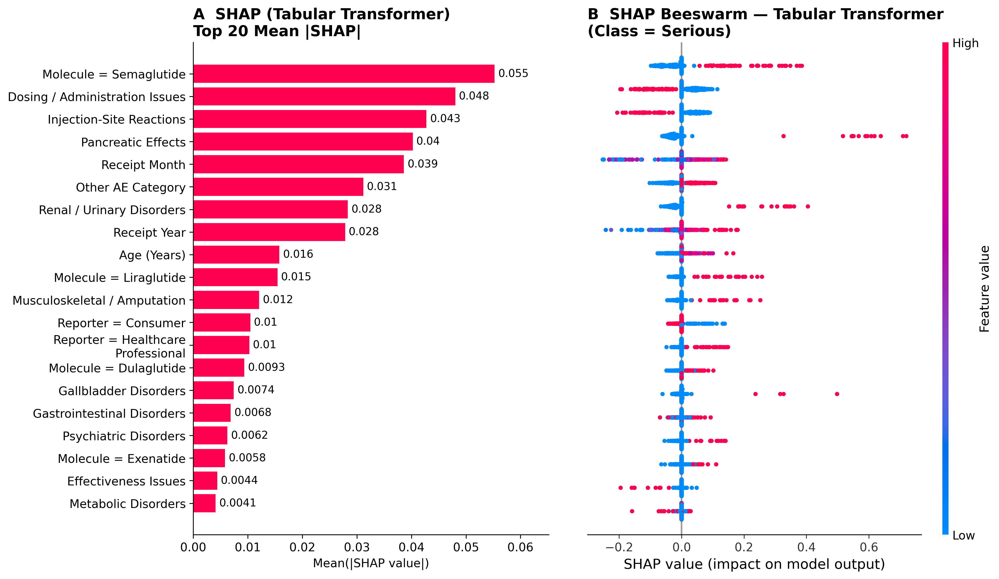

In [17]:
# ============================================================
# SHAP (KernelExplainer) — FINAL NAMING (LR / RF CONSISTENT)
# Includes medical category renaming (Injection-Site Reactions, etc.)
# ============================================================

import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
import tempfile, os

import random

# -------------------------
# Reproducibility controls
# -------------------------
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

# optional: reduce nondeterminism from multi-threaded BLAS
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"

ARTIFACTS = "shap_ttf_artifacts.npz"
FORCE_RERUN = True  # set to False after first run to use cache

# -------------------------
# Safety checks
# -------------------------
required = ["predictor", "TARGET", "CAT_FEATURES", "NUMERIC_ALL", "test_csv"]
missing = [k for k in required if k not in globals()]
if missing:
    raise RuntimeError(f"Missing globals: {missing}")

# -------------------------
# Load TEST split
# -------------------------
test_df = pd.read_csv(test_csv)
X_test = test_df.drop(columns=[TARGET])

# -------------------------
# One-hot encode categoricals
# -------------------------
X_onehot = pd.get_dummies(X_test, columns=CAT_FEATURES, drop_first=False)

# ============================================================
# FINAL pretty feature name mapping (LR / RF CONSISTENT)
# ============================================================

PRETTY_BASE_NAMES = {
    "molecule": "Molecule",
    "reporter_bucket": "Reporter",
    "sex_bucket": "Sex",
    "indication_bucket": "Indication",
}

PRETTY_BINARY_NAMES = {
    "cat_inj_site": "Injection-Site Reactions",
    "cat_dose_admin": "Dosing / Administration Issues",
    "cat_pancreas": "Pancreatic Effects",
    "cat_renal": "Renal / Urinary Disorders",
    "cat_psych": "Psychiatric Disorders",
    "cat_msk": "Musculoskeletal / Amputation",
    "cat_gi": "Gastrointestinal Disorders",
    "cat_thyroid": "Thyroid Disorders",
    "cat_gb": "Gallbladder Disorders",
    "cat_metabolic": "Metabolic Disorders",
    "cat_other": "Other AE Category",
    "cat_effectiveness": "Effectiveness Issues",
    "is_brand_only": "Brand Only",
    "is_generic_only": "Generic Only",
    "is_mixed": "Mixed"
}

PRETTY_NUMERIC_NAMES = {
    "age_years": "Age (Years)",
    "receipt_year": "Receipt Year",
    "receipt_month": "Receipt Month",
}

def pretty_feature_name(col):
    # ---------- One-hot categorical ----------
    if "_CAT_" in col:
        for base, pretty in PRETTY_BASE_NAMES.items():
            prefix = f"{base}_CAT_"
            if col.startswith(prefix):
                value = col[len(prefix):]
                value = value.replace("_", " ").title()
                return f"{pretty} = {value}"

    # ---------- Binary clinical flags ----------
    if col in PRETTY_BINARY_NAMES:
        return PRETTY_BINARY_NAMES[col]

    # ---------- Numeric ----------
    if col in PRETTY_NUMERIC_NAMES:
        return PRETTY_NUMERIC_NAMES[col]

    # ---------- Fallback ----------
    return col.replace("_", " ").title()

# Apply pretty names
X_onehot_pretty = X_onehot.rename(
    columns={c: pretty_feature_name(c) for c in X_onehot.columns}
)

# ============================================================
# Convert one-hot → model feature space
# ============================================================
def onehot_to_model_features(df_onehot):
    out = pd.DataFrame(index=df_onehot.index)

    for col in CAT_FEATURES:
        prefix = col + "_CAT_"
        cols = [c for c in df_onehot.columns if c.startswith(prefix)]
        if cols:
            chosen = df_onehot[cols].idxmax(axis=1).str[len(prefix):]
            out[col] = "CAT_" + chosen.astype(str)
        else:
            out[col] = "CAT_MISSING"

    for col in NUMERIC_ALL:
        out[col] = pd.to_numeric(df_onehot.get(col, 0), errors="coerce").fillna(0)

    return out[CAT_FEATURES + NUMERIC_ALL]

# 1) Determine whether predictor's probability is reversed (P(class=0) vs P(class=1))
_val_pred_df = predictor.predict(data_reader=val_reader)
_val_prob_col = find_prob_col(_val_pred_df)
_val_prob_raw = pd.to_numeric(_val_pred_df[_val_prob_col], errors="coerce").fillna(0.5).to_numpy()
_val_prob_raw = np.nan_to_num(_val_prob_raw, nan=0.5, posinf=1.0, neginf=0.0).clip(0, 1)

auc_raw  = roc_auc_score(val_true, _val_prob_raw)
auc_flip = roc_auc_score(val_true, 1.0 - _val_prob_raw)
ORIENT_FLIP = bool(auc_flip > auc_raw)
print(f"[SHAP] ORIENT_FLIP={ORIENT_FLIP} (VAL AUC raw={auc_raw:.4f}, flip={auc_flip:.4f})")


# 2) Helper: score arbitrary model-feature dataframe using ttf Predictor
def oriented_proba(model_X: pd.DataFrame) -> np.ndarray:
    d = model_X.copy()

    for c in CAT_FEATURES:
        d[c] = d[c].astype(str).fillna("CAT_MISSING")
        if not d[c].str.startswith("CAT_").all():
            d[c] = "CAT_" + d[c]

    for c in NUMERIC_ALL:
        d[c] = pd.to_numeric(d[c], errors="coerce").fillna(0).astype("float32")

    orig_n = len(d)
    if orig_n == 1:
        d_pad = pd.concat([d, d], ignore_index=True)
        d_pad[TARGET] = np.array([0, 1], dtype=np.int64)
    else:
        d_pad = d.reset_index(drop=True)
        d_pad[TARGET] = (np.arange(len(d_pad)) % 2).astype(np.int64)

    with tempfile.TemporaryDirectory() as td:
        tmp_csv = os.path.join(td, "tmp_shap.csv")
        d_pad[CAT_FEATURES + NUMERIC_ALL + [TARGET]].to_csv(tmp_csv, index=False)

        tmp_reader = faers_reader(file_path=tmp_csv)
        pred_df = predictor.predict(data_reader=tmp_reader)

    prob_col = find_prob_col(pred_df)
    p = pd.to_numeric(pred_df[prob_col], errors="coerce").fillna(0.5).to_numpy()
    p = np.nan_to_num(p, nan=0.5, posinf=1.0, neginf=0.0).clip(0, 1)

    if ORIENT_FLIP:
        p = 1.0 - p

    return p[:orig_n]


def shap_predict_fn(x_numpy):
    df_in = pd.DataFrame(x_numpy, columns=X_onehot.columns)
    model_X = onehot_to_model_features(df_in)
    p = oriented_proba(model_X)
    return p.reshape(-1)

# ============================================================
# SHAP KernelExplainer
# ============================================================
SHAP_BG_N     = int(globals().get("SHAP_BG_N", 50))
SHAP_EVAL_N   = int(globals().get("SHAP_EVAL_N", 200))
SHAP_NSAMPLES = int(globals().get("SHAP_NSAMPLES", 200))

# -------------------------
# Fixed BG/EVAL indices (deterministic)
# -------------------------
rng = np.random.default_rng(SEED)
n = len(X_onehot)

bg_n   = min(SHAP_BG_N, n)
eval_n = min(SHAP_EVAL_N, n)

idx_bg   = rng.choice(n, size=bg_n, replace=False)
idx_eval = rng.choice(n, size=eval_n, replace=False)

X_bg   = X_onehot.iloc[idx_bg]
X_eval = X_onehot.iloc[idx_eval]

# -------------------------
# Cache SHAP so results are identical every run
# -------------------------
if os.path.exists(ARTIFACTS) and not FORCE_RERUN:
    print(f"[SHAP] Loading cached artifacts: {ARTIFACTS}")
    data = np.load(ARTIFACTS, allow_pickle=True)

    shap_values = data["shap_values"]
    expected_value = data["expected_value"].item()
    feature_names = list(data["feature_names"])
    idx_eval = data["idx_eval"]
    idx_bg = data["idx_bg"]

    eval_columns = list(data["eval_columns"])
    X_onehot = X_onehot[eval_columns]
    X_onehot_pretty = X_onehot.rename(
        columns={c: pretty_feature_name(c) for c in X_onehot.columns}
    )

    X_eval = X_onehot.iloc[idx_eval]
    X_bg   = X_onehot.iloc[idx_bg]
else:
    print("Building SHAP explainer...")
    explainer = shap.KernelExplainer(shap_predict_fn, X_bg.values)

    print("Computing SHAP values...")
    shap_values = explainer.shap_values(X_eval.values, nsamples=SHAP_NSAMPLES)
    if isinstance(shap_values, list):
        shap_values = shap_values[0]

    expected_value = explainer.expected_value
    feature_names = list(X_onehot.columns)

    np.savez(
        ARTIFACTS,
        shap_values=shap_values,
        expected_value=np.array(expected_value, dtype=object),
        feature_names=np.array(feature_names, dtype=object),
        eval_columns=np.array(X_onehot.columns, dtype=object),
        idx_bg=np.array(idx_bg),
        idx_eval=np.array(idx_eval),
        seed=np.array(SEED),
        shap_bg_n=np.array(SHAP_BG_N),
        shap_eval_n=np.array(SHAP_EVAL_N),
        shap_nsamples=np.array(SHAP_NSAMPLES),
    )
    print(f"[SHAP] Saved new artifacts: {ARTIFACTS}")

if isinstance(shap_values, list):
    shap_values = shap_values[0]

import textwrap
import matplotlib as mpl

mpl.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
})

def wrap_label(s, width=30):
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=False))

def remove_shap_guides(ax):
    ax.grid(False)
    for line in list(ax.lines):
        if line.get_linestyle() in ("--", ":"):
            try:
                line.remove()
            except Exception:
                pass

# ---- compute global importance on the eval set ----
topk = 20
imp = np.abs(shap_values).mean(axis=0)
idx = np.argsort(imp)[::-1][:topk]
idx_plot = idx[::-1]

labels = [wrap_label(pretty_feature_name(feature_names[i]), width=30) for i in idx_plot]
vals   = imp[idx_plot]

FIG_W, FIG_H, DPI = 16, 8, 300
fig = plt.figure(figsize=(FIG_W, FIG_H), dpi=DPI, facecolor="white")
gs = fig.add_gridspec(1, 2, width_ratios=[1.15, 1.35], wspace=0.10)

# =============================
# Panel A — bar
# =============================
ax1 = fig.add_subplot(gs[0, 0])
bar_color = "#ff0051"

ax1.barh(np.arange(topk), vals, color=bar_color, edgecolor="none")
ax1.set_yticks(np.arange(topk))
ax1.set_yticklabels(labels)
ax1.set_xlabel("Mean(|SHAP value|)")

xmax = float(vals.max()) * 1.18
ax1.set_xlim(0, xmax)
for y, v in enumerate(vals):
    ax1.text(v + xmax*0.01, y, f"{v:.2g}", va="center", ha="left", fontsize=10)

ax1.set_title("A  SHAP (Tabular Transformer)\nTop 20 Mean |SHAP|", loc="left")
ax1.grid(False)
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# =============================
# Panel B — beeswarm
# =============================
ax2 = fig.add_subplot(gs[0, 1])
plt.sca(ax2)

X_eval_pretty = X_onehot_pretty.iloc[idx_eval]

idx_rev = idx[::-1]
shap_top = shap_values[:, idx_rev]
X_top = X_eval_pretty.iloc[:, idx_rev]

exp_top = shap.Explanation(
    values=shap_top,
    base_values=np.repeat(expected_value, shap_top.shape[0]),
    data=X_top.values,
    feature_names=list(X_top.columns),
)

shap.plots.beeswarm(exp_top, max_display=topk, show=False, plot_size=None)

ax2.set_title("B  SHAP Beeswarm — Tabular Transformer\n(Class = Serious)", loc="left")
remove_shap_guides(ax2)

ax2.set_yticklabels([])
ax2.set_ylabel("")
ax2.tick_params(axis="y", length=0)

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)

fig.subplots_adjust(left=0.30, right=0.96, top=0.92, bottom=0.12)

plt.savefig("shap_ttf_panel_AB.png", dpi=DPI, bbox_inches="tight", facecolor="white")
plt.savefig("shap_ttf_panel_AB.pdf", bbox_inches="tight", facecolor="white")
plt.show()
plt.close()

SHAP importance ≈ “how sensitive the model is to the embedding slot molecule”
but not “which category (tirzepatide, semaglutide…) increases risk.”

FTTransformer: Feature tokenizer + transformer, works better than TabTransformer because both categorical and numeric variables go into the transformer together

Reference: 
https://github.com/pyg-team/pytorch-frame/blob/master/examples/revisiting.py

https://pytorch-frame.readthedocs.io/en/stable/generated/torch_frame.nn.models.FTTransformer.html

In [20]:
!pip install pytorch-frame

Device: cpu
Full label counts: {0: 180240, 1: 62072}
Class weights (from TRAIN2): {0: 0.6723669120639266, 1: 1.9503943767773784}
TRAIN2 counts BEFORE: {0: 108124, 1: 37274}
TRAIN2 counts AFTER : {1: 108124, 0: 108124}
VAL counts          : {0: 27069, 1: 9258}
TEST counts         : {0: 45047, 1: 15540}
Epoch 001/50 | TrainLoss=0.4134 | VAL AUC=0.884 | VAL AP=0.778 | VAL bestF1=0.6869 @thr=0.7025 (P=0.697, R=0.677)
Epoch 002/50 | TrainLoss=0.3723 | VAL AUC=0.901 | VAL AP=0.805 | VAL bestF1=0.7130 @thr=0.6916 (P=0.759, R=0.673)
Epoch 003/50 | TrainLoss=0.3584 | VAL AUC=0.902 | VAL AP=0.812 | VAL bestF1=0.7212 @thr=0.6311 (P=0.737, R=0.706)
Epoch 004/50 | TrainLoss=0.3515 | VAL AUC=0.903 | VAL AP=0.815 | VAL bestF1=0.7216 @thr=0.7000 (P=0.772, R=0.678)
Epoch 005/50 | TrainLoss=0.3471 | VAL AUC=0.903 | VAL AP=0.810 | VAL bestF1=0.7215 @thr=0.7580 (P=0.778, R=0.673)
Epoch 006/50 | TrainLoss=0.3441 | VAL AUC=0.912 | VAL AP=0.828 | VAL bestF1=0.7320 @thr=0.6724 (P=0.770, R=0.697)
Epoch 007/50 

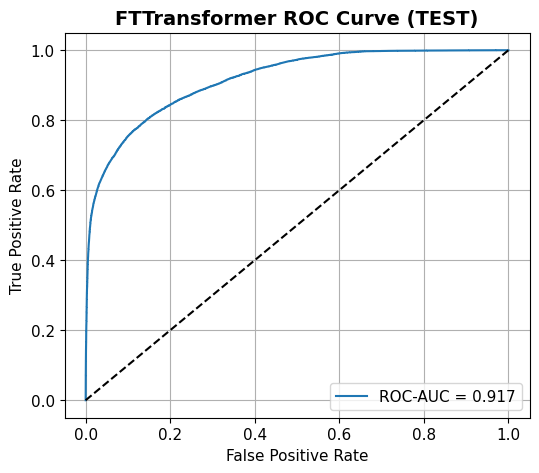

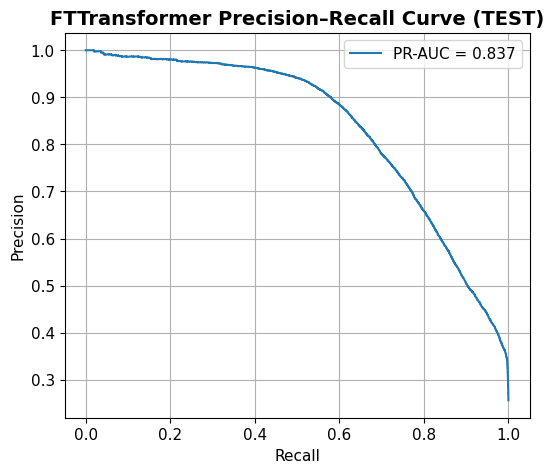

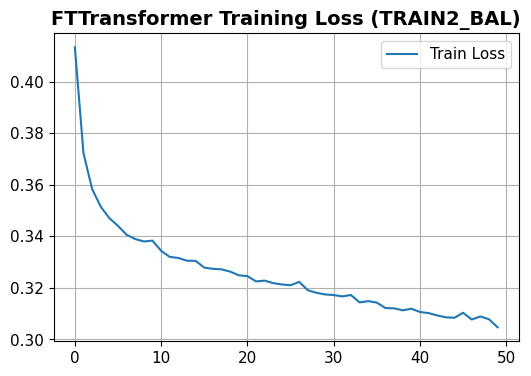

In [ ]:
# =========================
# FTTransformer (GroupSplit + TRAIN2 oversample + VAL threshold)
# CONSISTENT with LR + RF + TabularTransformer (ttf)
# =========================

import copy
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

from torch_frame import stype
from torch_frame.data import Dataset, DataLoader
from torch_frame import categorical, numerical
from torch_frame.nn.models import FTTransformer
from torch_frame.nn.encoder import LinearEncoder, LinearBucketEncoder, LinearPeriodicEncoder
from torch_frame.nn import EmbeddingEncoder

from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    precision_recall_curve, classification_report, roc_curve
)

# -------------------------
# 0) Reproducibility
# -------------------------
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# -------------------------
# 1) Load data
# -------------------------
try:
    ml_df
except NameError:
    ml_df = pd.read_csv("ml_df.csv")

TARGET = "serious"

NUMERIC_FEATURES = ["age_years", "receipt_year", "receipt_month"]
BINARY_FEATURES  = [
    "cat_dose_admin","cat_gi","cat_inj_site","cat_pancreas","cat_thyroid",
    "cat_gb","cat_metabolic","cat_renal","cat_psych","cat_msk",
    "cat_effectiveness","cat_other",
    "is_brand_only","is_generic_only","is_mixed"
]
NUMERIC_ALL = NUMERIC_FEATURES + BINARY_FEATURES
CAT_FEATURES = ["sex_bucket", "reporter_bucket", "indication_bucket", "molecule"]

ALL_COLS = ["primaryid"] + CAT_FEATURES + NUMERIC_ALL + [TARGET]
df = ml_df[ALL_COLS].copy()

# -------------------------
# 2) Hard dtype enforcement (BEFORE splitting)
# -------------------------
df["primaryid"] = df["primaryid"].astype(str)

df[TARGET] = pd.to_numeric(df[TARGET], errors="coerce").fillna(0).astype(np.int64)
df[TARGET] = (df[TARGET] > 0).astype(np.int64)

for c in NUMERIC_FEATURES:
    df[c] = pd.to_numeric(df[c], errors="coerce").astype("float32")

for c in BINARY_FEATURES:
    df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0).astype("float32")

for c in CAT_FEATURES:
    df[c] = df[c].astype("string").fillna("MISSING")

print("Full label counts:", df[TARGET].value_counts().to_dict())

# -------------------------
# 3) Group-aware split: TRAIN vs TEST (25%)
# -------------------------
gss = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=SEED)
train_idx, test_idx = next(gss.split(df, df[TARGET], groups=df["primaryid"]))
train_df = df.iloc[train_idx].copy()
test_df  = df.iloc[test_idx].copy()

# -------------------------
# 4) Group-aware split: TRAIN2 vs VAL (20% of TRAIN)
# -------------------------
gss2 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=SEED)
train2_idx, val_idx = next(gss2.split(train_df, train_df[TARGET], groups=train_df["primaryid"]))
train2_df = train_df.iloc[train2_idx].copy()
val_df    = train_df.iloc[val_idx].copy()

# -------------------------
# 5) Manual "balanced" class weights on TRAIN2 (reporting only)
# -------------------------
n0 = int((train2_df[TARGET] == 0).sum())
n1 = int((train2_df[TARGET] == 1).sum())
n  = n0 + n1
w0 = (n / (2.0 * n0)) if n0 > 0 else 1.0
w1 = (n / (2.0 * n1)) if n1 > 0 else 1.0
print("Class weights (from TRAIN2):", {0: float(w0), 1: float(w1)})

# -------------------------
# 6) Oversample TRAIN2 ONLY
# -------------------------
def oversample_train(df_in, target_col="serious", random_state=SEED):
    pos = df_in[df_in[target_col] == 1]
    neg = df_in[df_in[target_col] == 0]
    if len(pos) == 0 or len(neg) == 0:
        return df_in.sample(frac=1, random_state=random_state).reset_index(drop=True)
    if len(pos) < len(neg):
        pos_up = pos.sample(n=len(neg), replace=True, random_state=random_state)
        out = pd.concat([neg, pos_up], ignore_index=True)
    else:
        neg_up = neg.sample(n=len(pos), replace=True, random_state=random_state)
        out = pd.concat([pos, neg_up], ignore_index=True)
    return out.sample(frac=1, random_state=random_state).reset_index(drop=True)

train2_bal = oversample_train(train2_df, target_col=TARGET, random_state=SEED)

print("TRAIN2 counts BEFORE:", train2_df[TARGET].value_counts().to_dict())
print("TRAIN2 counts AFTER :", train2_bal[TARGET].value_counts().to_dict())
print("VAL counts          :", val_df[TARGET].value_counts().to_dict())
print("TEST counts         :", test_df[TARGET].value_counts().to_dict())

# -------------------------
# 7) Build TorchFrame datasets
# IMPORTANT FIX: include TARGET in col_to_stype
# -------------------------
def make_torchframe_dataset(dfx: pd.DataFrame):
    d = dfx.drop(columns=["primaryid"]).copy()

    for c in CAT_FEATURES:
        # d[c] = d[c].astype("string").fillna("MISSING")
        d[c] = "CAT_" + d[c].astype(str).fillna("MISSING")

    for c in NUMERIC_ALL:
        d[c] = pd.to_numeric(d[c], errors="coerce").fillna(0).astype("float32")

    d[TARGET] = pd.to_numeric(d[TARGET], errors="coerce").fillna(0).astype(np.int64)
    d[TARGET] = (d[TARGET] > 0).astype(np.int64)

    col_to_stype = {c: categorical for c in CAT_FEATURES}
    col_to_stype.update({c: numerical for c in NUMERIC_ALL})

    col_to_stype[TARGET] = numerical

    ds = Dataset(df=d, col_to_stype=col_to_stype, target_col=TARGET)
    ds.materialize()
    return ds

train2_bal_ds = make_torchframe_dataset(train2_bal)
val_ds        = make_torchframe_dataset(val_df)
test_ds       = make_torchframe_dataset(test_df)

train_loader = DataLoader(train2_bal_ds.tensor_frame, batch_size=128, shuffle=True)
val_loader   = DataLoader(val_ds.tensor_frame,        batch_size=256, shuffle=False)
test_loader  = DataLoader(test_ds.tensor_frame,       batch_size=256, shuffle=False)

# -------------------------
# 8) Encoders + FTTransformer
# -------------------------
def build_type_encoders(numerical_encoder_type="linear"):
    if numerical_encoder_type == "linear":
        numerical_encoder = LinearEncoder()
    elif numerical_encoder_type == "linearbucket":
        numerical_encoder = LinearBucketEncoder()
    elif numerical_encoder_type == "linearperiodic":
        numerical_encoder = LinearPeriodicEncoder()
    else:
        raise ValueError(f"Unsupported encoder type: {numerical_encoder_type}")
    return {
        stype.categorical: EmbeddingEncoder(),
        stype.numerical: numerical_encoder,
    }

stype_encoder_dict = build_type_encoders("linear")

model = FTTransformer(
    channels=128,
    out_channels=2,
    num_layers=4,
    col_stats=train2_bal_ds.col_stats,
    col_names_dict=train2_bal_ds.tensor_frame.col_names_dict,
    stype_encoder_dict=stype_encoder_dict,
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)

# -------------------------
# 9) Predict helper
# -------------------------
def predict_proba(model, dataloader, device):
    model.eval()
    probs, ys = [], []
    with torch.no_grad():
        for tf in dataloader:
            tf = tf.to(device)
            logits = model(tf)
            p1 = torch.softmax(logits, dim=1)[:, 1].detach().cpu().numpy()

            # IMPORTANT: ensure integer labels
            y  = tf.y.long().detach().cpu().numpy()

            probs.append(p1)
            ys.append(y)
    return np.concatenate(ys), np.concatenate(probs)

# -------------------------
# 10) Threshold tuning on VAL (maximize F1)
# -------------------------
def pick_threshold_f1(y_true, proba):
    p, r, t = precision_recall_curve(y_true, proba)
    f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-9)
    best_idx = int(np.argmax(f1))
    return float(t[best_idx]), float(f1[best_idx]), float(p[:-1][best_idx]), float(r[:-1][best_idx])

# -------------------------
# 11) Train on TRAIN2_BAL only
# -------------------------
num_epochs = 50
best_state = None
best_val_f1 = -1.0
best_thr = 0.5
train_losses = []

for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0

    for tf in train_loader:
        tf = tf.to(device)
        logits = model(tf)

        # IMPORTANT: cross_entropy needs Long targets
        y = tf.y.long()
        loss = F.cross_entropy(logits, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    y_val, p_val = predict_proba(model, val_loader, device=device)
    thr, f1, prec, rec = pick_threshold_f1(y_val, p_val)

    if f1 > best_val_f1:
        best_val_f1 = f1
        best_thr = thr
        best_state = copy.deepcopy(model.state_dict())

    val_auc = roc_auc_score(y_val, p_val) if len(np.unique(y_val)) > 1 else float("nan")
    val_ap  = average_precision_score(y_val, p_val) if len(np.unique(y_val)) > 1 else float("nan")

    print(
        f"Epoch {epoch+1:03d}/{num_epochs} | "
        f"TrainLoss={avg_train_loss:.4f} | "
        f"VAL AUC={val_auc:.3f} | VAL AP={val_ap:.3f} | "
        f"VAL bestF1={f1:.4f} @thr={thr:.4f} (P={prec:.3f}, R={rec:.3f})"
    )

model.load_state_dict(best_state)
model.eval()
print(f"\n[FTTransformer] Best VAL F1={best_val_f1:.4f} with threshold={best_thr:.6f}")

# -------------------------
# 12) Final TEST eval using VAL threshold
# -------------------------
def evaluate(name, y_true, proba, threshold):
    pred = (proba >= threshold).astype(int)
    print(f"\n===== {name} =====")
    print("Threshold:", threshold)
    print("ROC-AUC:", roc_auc_score(y_true, proba))
    print("PR-AUC :", average_precision_score(y_true, proba))
    print("Brier  :", brier_score_loss(y_true, proba))
    print(classification_report(y_true, pred, digits=3))

y_test, p_test = predict_proba(model, test_loader, device=device)
evaluate("FTTransformer (GroupSplit + TRAIN2 oversample + VAL threshold)", y_test, p_test, best_thr)

test_auc   = roc_auc_score(y_test, p_test)
test_ap    = average_precision_score(y_test, p_test)
test_brier = brier_score_loss(y_test, p_test)
print(f"\n[FTTransformer] ROC-AUC={test_auc:.3f}  PR-AUC={test_ap:.3f}  Brier={test_brier:.3f}")

# Curves (TEST)
fpr, tpr, _ = roc_curve(y_test, p_test)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"ROC-AUC = {test_auc:.3f}")
plt.plot([0,1],[0,1],"k--")
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.title("FTTransformer ROC Curve (TEST)")
plt.legend(); plt.grid(True); plt.show()

prec_curve, rec_curve, _ = precision_recall_curve(y_test, p_test)
plt.figure(figsize=(6,5))
plt.plot(rec_curve, prec_curve, label=f"PR-AUC = {test_ap:.3f}")
plt.xlabel("Recall"); plt.ylabel("Precision")
plt.title("FTTransformer Precision–Recall Curve (TEST)")
plt.legend(); plt.grid(True); plt.show()

plt.figure(figsize=(6,4))
plt.plot(train_losses, label="Train Loss")
plt.title("FTTransformer Training Loss (TRAIN2_BAL)")
plt.legend(); plt.grid(True); plt.show()

In [22]:
# ============================================================
# ABLATION: FTTransformer (no cat_* features)
# ============================================================
import copy

# ── 1. No-cat column definitions ──
BINARY_FEATURES_NOCAT_FTT = ['is_brand_only', 'is_generic_only', 'is_mixed']
NUMERIC_ALL_NOCAT_FTT = NUMERIC_FEATURES + BINARY_FEATURES_NOCAT_FTT

# ── 2. Rebuild dataframe without cat_* ──
ALL_COLS_NOCAT_FTT = ['primaryid'] + CAT_FEATURES + NUMERIC_ALL_NOCAT_FTT + [TARGET]
df_ftt_nocat = ml_df[ALL_COLS_NOCAT_FTT].copy()

df_ftt_nocat['primaryid'] = df_ftt_nocat['primaryid'].astype(str)
df_ftt_nocat[TARGET] = pd.to_numeric(df_ftt_nocat[TARGET], errors='coerce').fillna(0).astype(np.int64)
df_ftt_nocat[TARGET] = (df_ftt_nocat[TARGET] > 0).astype(np.int64)
for c in NUMERIC_FEATURES:
    df_ftt_nocat[c] = pd.to_numeric(df_ftt_nocat[c], errors='coerce').astype('float32')
for c in BINARY_FEATURES_NOCAT_FTT:
    df_ftt_nocat[c] = pd.to_numeric(df_ftt_nocat[c], errors='coerce').fillna(0).astype('float32')
for c in CAT_FEATURES:
    df_ftt_nocat[c] = df_ftt_nocat[c].astype('string').fillna('MISSING')

# ── 3. Same group-aware splits ──
gss_f  = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=SEED)
gss2_f = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=SEED)

train_idx_f, test_idx_f = next(gss_f.split(df_ftt_nocat, df_ftt_nocat[TARGET], groups=df_ftt_nocat['primaryid']))
train_df_f = df_ftt_nocat.iloc[train_idx_f].copy()
test_df_f  = df_ftt_nocat.iloc[test_idx_f].copy()

train2_idx_f, val_idx_f = next(gss2_f.split(train_df_f, train_df_f[TARGET], groups=train_df_f['primaryid']))
train2_df_f = train_df_f.iloc[train2_idx_f].copy()
val_df_f    = train_df_f.iloc[val_idx_f].copy()
train2_bal_f = oversample_train(train2_df_f, target_col=TARGET, random_state=SEED)

# ── 4. Build TorchFrame datasets (no cat_*) ──
def make_torchframe_dataset_nocat(dfx):
    d = dfx.drop(columns=['primaryid']).copy()
    for c in CAT_FEATURES:
        d[c] = 'CAT_' + d[c].astype(str).fillna('MISSING')
    for c in NUMERIC_ALL_NOCAT_FTT:
        d[c] = pd.to_numeric(d[c], errors='coerce').fillna(0).astype('float32')
    d[TARGET] = pd.to_numeric(d[TARGET], errors='coerce').fillna(0).astype(np.int64)
    d[TARGET] = (d[TARGET] > 0).astype(np.int64)

    col_to_stype = {c: categorical for c in CAT_FEATURES}
    col_to_stype.update({c: numerical for c in NUMERIC_ALL_NOCAT_FTT})
    col_to_stype[TARGET] = numerical

    ds = Dataset(df=d, col_to_stype=col_to_stype, target_col=TARGET)
    ds.materialize()
    return ds

train2_bal_ds_f = make_torchframe_dataset_nocat(train2_bal_f)
val_ds_f        = make_torchframe_dataset_nocat(val_df_f)
test_ds_f       = make_torchframe_dataset_nocat(test_df_f)

train_loader_f = DataLoader(train2_bal_ds_f.tensor_frame, batch_size=128, shuffle=True)
val_loader_f   = DataLoader(val_ds_f.tensor_frame,        batch_size=256, shuffle=False)
test_loader_f  = DataLoader(test_ds_f.tensor_frame,       batch_size=256, shuffle=False)

# ── 5. Build FTTransformer model ──
stype_encoder_dict_f = build_type_encoders('linear')

model_f = FTTransformer(
    channels=128,
    out_channels=2,
    num_layers=4,
    col_stats=train2_bal_ds_f.col_stats,
    col_names_dict=train2_bal_ds_f.tensor_frame.col_names_dict,
    stype_encoder_dict=stype_encoder_dict_f,
).to(device)

optimizer_f = torch.optim.Adam(model_f.parameters(), lr=5e-4)

# ── 6. Train ──
num_epochs = 50
best_state_f = None
best_val_f1_f = -1.0
best_thr_f = 0.5

for epoch in range(num_epochs):
    model_f.train()
    total_loss = 0.0
    for tf in train_loader_f:
        tf = tf.to(device)
        logits = model_f(tf)
        y = tf.y.long()
        loss = F.cross_entropy(logits, y)
        optimizer_f.zero_grad()
        loss.backward()
        optimizer_f.step()
        total_loss += loss.item()

    y_val_f, p_val_f = predict_proba(model_f, val_loader_f, device=device)
    thr_f, f1_f, prec_f, rec_f = pick_threshold_f1(y_val_f, p_val_f)
    if f1_f > best_val_f1_f:
        best_val_f1_f = f1_f
        best_thr_f = thr_f
        best_state_f = copy.deepcopy(model_f.state_dict())

    val_auc_f = roc_auc_score(y_val_f, p_val_f)
    print(f"Epoch {epoch+1:03d}/{num_epochs} | VAL AUC={val_auc_f:.3f} | VAL F1={f1_f:.4f} @thr={thr_f:.4f}")

model_f.load_state_dict(best_state_f)
model_f.eval()

# ── 7. Evaluate on test ──
y_test_f, p_test_f = predict_proba(model_f, test_loader_f, device=device)
results_nocat.append(eval_nocat(y_test_f, p_test_f, 'FTT (no cat)'))

Epoch 001/50 | VAL AUC=0.754 | VAL F1=0.6011 @thr=0.5816
Epoch 002/50 | VAL AUC=0.766 | VAL F1=0.6091 @thr=0.5107
Epoch 003/50 | VAL AUC=0.784 | VAL F1=0.6171 @thr=0.5912
Epoch 004/50 | VAL AUC=0.783 | VAL F1=0.6177 @thr=0.6029
Epoch 005/50 | VAL AUC=0.779 | VAL F1=0.6227 @thr=0.6128
Epoch 006/50 | VAL AUC=0.779 | VAL F1=0.6182 @thr=0.5859
Epoch 007/50 | VAL AUC=0.783 | VAL F1=0.6222 @thr=0.5836
Epoch 008/50 | VAL AUC=0.773 | VAL F1=0.6180 @thr=0.4762
Epoch 009/50 | VAL AUC=0.780 | VAL F1=0.6207 @thr=0.5108
Epoch 010/50 | VAL AUC=0.788 | VAL F1=0.6241 @thr=0.6335
Epoch 011/50 | VAL AUC=0.781 | VAL F1=0.6252 @thr=0.6627
Epoch 012/50 | VAL AUC=0.784 | VAL F1=0.6268 @thr=0.6552
Epoch 013/50 | VAL AUC=0.776 | VAL F1=0.6157 @thr=0.5526
Epoch 014/50 | VAL AUC=0.777 | VAL F1=0.6219 @thr=0.5572
Epoch 015/50 | VAL AUC=0.784 | VAL F1=0.6244 @thr=0.5399
Epoch 016/50 | VAL AUC=0.782 | VAL F1=0.6132 @thr=0.5841
Epoch 017/50 | VAL AUC=0.778 | VAL F1=0.6186 @thr=0.5818
Epoch 018/50 | VAL AUC=0.777 | 

Shapley Analysis for FTTransformer

Quick SHAP predict_fn test: [0.00041789 0.00032152 0.13123374]
Building SHAP KernelExplainer...
Computing SHAP values...


  0%|          | 0/300 [00:00<?, ?it/s]

[SHAP] Saved new artifacts: shap_ftt_artifacts.npz


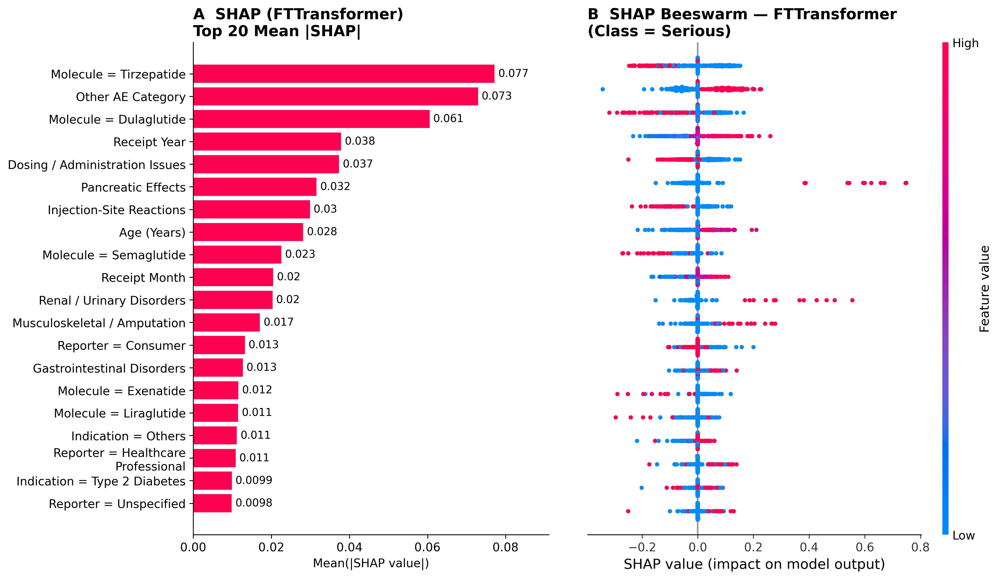

Saved:
 - shap_ftt_panel_AB.png
 - shap_ftt_panel_AB.pdf


In [20]:
# =========================
# SHAP for FTTransformer (KernelExplainer)
# Uses TRAIN2 (non-oversampled) as the reference distribution by default
# =========================

import numpy as np
import pandas as pd
import shap
import torch
import matplotlib.pyplot as plt

from torch_frame.data import Dataset
import os, random

# -------------------------
# Reproducibility controls
# -------------------------
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)

# optional: reduce nondeterminism from multi-threaded BLAS
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"

ARTIFACTS = "shap_ftt_artifacts.npz"
FORCE_RERUN = True  # set to False after first run to use cache

# Put model on CPU for SHAP stability
model = model.eval().to("cpu")

# explain using TRAIN2 distribution (not oversampled)
shap_ref_df = train2_df.copy()

# Build the exact feature dataframe used by TorchFrame (drop primaryid)
shap_ref_df = shap_ref_df.drop(columns=["primaryid"]).copy()

# Ensure types consistent
for c in CAT_FEATURES:
    shap_ref_df[c] = shap_ref_df[c].astype("string").fillna("MISSING")

for c in NUMERIC_ALL:
    shap_ref_df[c] = pd.to_numeric(shap_ref_df[c], errors="coerce").fillna(0).astype("float32")

# Drop target for encoding
X_raw = shap_ref_df.drop(columns=[TARGET]).copy()

# One-hot encode categoricals for SHAP KernelExplainer
df_encoded = pd.get_dummies(
    X_raw,
    columns=CAT_FEATURES,
    prefix=CAT_FEATURES,
    prefix_sep="=",
    drop_first=False
)

feature_names = list(df_encoded.columns)

SHAP_BG_N     = int(globals().get("SHAP_BG_N", 100))
SHAP_EVAL_N   = int(globals().get("SHAP_EVAL_N", 300))
SHAP_NSAMPLES = int(globals().get("SHAP_NSAMPLES", 100))

rng = np.random.default_rng(SEED)
n = len(df_encoded)

bg_n   = min(SHAP_BG_N, n)
eval_n = min(SHAP_EVAL_N, n)

idx_bg   = rng.choice(n, size=bg_n, replace=False)
idx_eval = rng.choice(n, size=eval_n, replace=False)

X_bg   = df_encoded.iloc[idx_bg]
X_eval = df_encoded.iloc[idx_eval]

X_bg_np   = np.nan_to_num(X_bg.astype("float32").values)
X_eval_np = np.nan_to_num(X_eval.astype("float32").values)

# TorchFrame schema (exclude TARGET)
col_to_stype_no_target = {c: categorical for c in CAT_FEATURES}
col_to_stype_no_target.update({c: numerical for c in NUMERIC_ALL})

def shap_predict_fn(x_numpy: np.ndarray) -> np.ndarray:
    df_onehot = pd.DataFrame(x_numpy, columns=feature_names)
    df_in = pd.DataFrame(index=df_onehot.index)

    for cat_col in CAT_FEATURES:
        onehot_cols = [c for c in feature_names if c.startswith(f"{cat_col}=")]
        if len(onehot_cols) == 0:
            df_in[cat_col] = "MISSING"
            continue
        picked = df_onehot[onehot_cols].values.argmax(axis=1)
        picked_cols = np.array(onehot_cols)[picked]
        df_in[cat_col] = [c.split("=", 1)[1] for c in picked_cols]
        df_in[cat_col] = df_in[cat_col].astype("string").fillna("MISSING")

    for num_col in NUMERIC_ALL:
        df_in[num_col] = df_onehot[num_col].astype("float32")

    tmp_dataset = Dataset(df=df_in, col_to_stype=col_to_stype_no_target)
    tmp_dataset.materialize()
    tf_in = tmp_dataset.tensor_frame.to("cpu")

    with torch.no_grad():
        logits = model(tf_in)
        probs = torch.softmax(logits, dim=1)[:, 1].cpu().numpy()
    return probs

print("Quick SHAP predict_fn test:", shap_predict_fn(X_bg_np[:3]))

import re

ACRONYMS = {"AE"}

def title_case(s: str) -> str:
    tokens = re.split(r"(\s+)", str(s))
    out = []

    for tok in tokens:
        if tok.strip() == "":
            out.append(tok)
            continue

        if tok.upper() in ACRONYMS or (tok.isupper() and len(tok) <= 5):
            out.append(tok.upper())
            continue

        if tok.startswith("(") and tok.endswith(")"):
            inner = tok[1:-1]
            if inner:
                inner = inner[:1].upper() + inner[1:].lower()
            out.append(f"({inner})")
            continue

        if "-" in tok:
            parts = tok.split("-")
            parts = [p[:1].upper() + p[1:].lower() if p else p for p in parts]
            out.append("-".join(parts))
        else:
            out.append(tok[:1].upper() + tok[1:].lower())

    return "".join(out)

PRETTY_BASE_NAMES = {
    "molecule": "Molecule",
    "reporter_bucket": "Reporter",
    "sex_bucket": "Sex",
    "indication_bucket": "Indication",
    "age_years": "Age (Years)",
    "receipt_month": "Receipt Month",
    "receipt_year": "Receipt Year",
    "cat_dose_admin": "Dosing / Administration Issues",
    "cat_gi": "Gastrointestinal Disorders",
    "cat_inj_site": "Injection-Site Reactions",
    "cat_pancreas": "Pancreatic Effects",
    "cat_thyroid": "Thyroid Disorders",
    "cat_gb": "Gallbladder Disorders",
    "cat_metabolic": "Metabolic Disorders",
    "cat_renal": "Renal / Urinary Disorders",
    "cat_psych": "Psychiatric Disorders",
    "cat_msk": "Musculoskeletal / Amputation",
    "cat_effectiveness": "Effectiveness",
    "cat_other": "Other AE Category",
    "is_brand_only": "Brand only",
    "is_generic_only": "Generic only",
    "is_mixed": "Mixed",
}

def pretty_feature_name(col: str) -> str:
    if "=" in col:
        base, val = col.split("=", 1)
        base_name = PRETTY_BASE_NAMES.get(base, base)
        return title_case(f"{base_name} = {val}")
    return title_case(PRETTY_BASE_NAMES.get(col, col))

pretty_feature_names = [pretty_feature_name(c) for c in feature_names]

X_bg_np   = np.nan_to_num(X_bg.astype("float32").values)
X_eval_np = np.nan_to_num(X_eval.astype("float32").values)

if os.path.exists(ARTIFACTS) and not FORCE_RERUN:
    print(f"[SHAP] Loading cached artifacts: {ARTIFACTS}")
    data = np.load(ARTIFACTS, allow_pickle=True)

    shap_values = data["shap_values"]
    expected_value = data["expected_value"].item()
    feature_names = list(data["feature_names"])

    pretty_feature_names = [pretty_feature_name(c) for c in feature_names]

    df_encoded = df_encoded[feature_names]
    X_bg   = df_encoded.iloc[idx_bg]
    X_eval = df_encoded.iloc[idx_eval]
    X_bg_np   = np.nan_to_num(X_bg.astype("float32").values)
    X_eval_np = np.nan_to_num(X_eval.astype("float32").values)

else:
    print("Building SHAP KernelExplainer...")
    explainer = shap.KernelExplainer(shap_predict_fn, X_bg_np)

    print("Computing SHAP values...")
    shap_values = explainer.shap_values(X_eval_np, nsamples=SHAP_NSAMPLES)
    if isinstance(shap_values, list):
        shap_values = shap_values[0]

    expected_value = explainer.expected_value

    np.savez(
        ARTIFACTS,
        shap_values=shap_values,
        expected_value=np.array(expected_value, dtype=object),
        feature_names=np.array(feature_names, dtype=object),
        pretty_feature_names=np.array(pretty_feature_names, dtype=object),
        idx_bg=np.array(idx_bg),
        idx_eval=np.array(idx_eval),
        seed=np.array(SEED),
        shap_bg_n=np.array(SHAP_BG_N),
        shap_eval_n=np.array(SHAP_EVAL_N),
        shap_nsamples=np.array(SHAP_NSAMPLES),
    )
    print(f"[SHAP] Saved new artifacts: {ARTIFACTS}")

if isinstance(shap_values, list):
    shap_values = shap_values[0]

import textwrap
import matplotlib as mpl

mpl.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
})

def wrap_label(s, width=30):
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=False))

def remove_shap_guides(ax):
    ax.grid(False)
    for line in list(ax.lines):
        if line.get_linestyle() in ("--", ":"):
            try:
                line.remove()
            except Exception:
                pass

topk = 20
imp = np.abs(shap_values).mean(axis=0)
idx = np.argsort(imp)[::-1][:topk]
idx_plot = idx[::-1]

labels = [wrap_label(pretty_feature_names[i], width=30) for i in idx_plot]
vals   = imp[idx_plot]

FIG_W, FIG_H, DPI = 16, 8, 300
fig = plt.figure(figsize=(FIG_W, FIG_H), dpi=DPI, facecolor="white")
gs = fig.add_gridspec(1, 2, width_ratios=[1.15, 1.35], wspace=0.10)

# =============================
# Panel A — bar
# =============================
ax1 = fig.add_subplot(gs[0, 0])
bar_color = "#ff0051"
ax1.barh(np.arange(topk), vals, color=bar_color, edgecolor="none")
ax1.set_yticks(np.arange(topk))
ax1.set_yticklabels(labels)
ax1.set_xlabel("Mean(|SHAP value|)")

xmax = float(vals.max()) * 1.18
ax1.set_xlim(0, xmax)
for y, v in enumerate(vals):
    ax1.text(v + xmax*0.01, y, f"{v:.2g}", va="center", ha="left", fontsize=10)

ax1.set_title("A  SHAP (FTTransformer)\nTop 20 Mean |SHAP|", loc="left")
ax1.grid(False)
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# =============================
# Panel B — beeswarm
# =============================
ax2 = fig.add_subplot(gs[0, 1])
plt.sca(ax2)

idx_rev = idx[::-1]
shap_top = shap_values[:, idx_rev]

X_eval_df = pd.DataFrame(X_eval_np, columns=feature_names)
X_top = X_eval_df.iloc[:, idx_rev]

exp_top = shap.Explanation(
    values=shap_top,
    base_values=np.repeat(expected_value, shap_top.shape[0]),
    data=X_top.values,
    feature_names=[pretty_feature_names[i] for i in idx_rev],
)

shap.plots.beeswarm(exp_top, max_display=topk, show=False, plot_size=None)

ax2.set_title("B  SHAP Beeswarm — FTTransformer\n(Class = Serious)", loc="left")
remove_shap_guides(ax2)

ax2.set_yticklabels([])
ax2.set_ylabel("")
ax2.tick_params(axis="y", length=0)

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)

fig.subplots_adjust(left=0.30, right=0.96, top=0.92, bottom=0.12)

plt.savefig("shap_ftt_panel_AB.png", dpi=DPI, bbox_inches="tight", facecolor="white")
plt.savefig("shap_ftt_panel_AB.pdf", bbox_inches="tight", facecolor="white")
plt.show()
plt.close()
print("Saved:")
print(" - shap_ftt_panel_AB.png")
print(" - shap_ftt_panel_AB.pdf")

Serialize rows of tabular data into text -- natural language description; use an LLM to classify

e.g. The patient is a 45-year-old male, reported by doctor, indication: Type 2 Diabetes, molecule: tirzepatide, kind: injection, ...

then let the LLM predict the target (e.g. serious event yes/no) based on that description

In [7]:
!pip install datasets

# exact versions that work well together on CPU and avoid the chat-template 404s
!pip install -U --force-reinstall \
  "transformers==4.43.4" \
  "huggingface_hub==0.23.5" \
  "tokenizers<0.20" \
  "datasets==2.20.0" \
  "evaluate==0.4.1" \
  "scikit-learn==1.5.2"\
  "numpy==1.26.4"

  Using cached transformers-4.43.4-py3-none-any.whl (9.4 MB)
  Using cached huggingface_hub-0.23.5-py3-none-any.whl (402 kB)
  Using cached tokenizers-0.19.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.6 MB)
  Using cached datasets-2.20.0-py3-none-any.whl (547 kB)
  Using cached evaluate-0.4.1-py3-none-any.whl (84 kB)
  Using cached scikit_learn-1.5.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.3 MB)
  Using cached numpy-1.26.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Using cached pyyaml-6.0.3-cp310-cp310-manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_28_x86_64.whl (770 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 KB 4.1 MB/s eta 0:00:00


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.6/793.6 KB 33.3 MB/s eta 0:00:00
  Using cached tqdm-4.67.3-py3-none-any.whl (78 kB)
  Using cached safetensors-0.7.0-cp38-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (507 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 KB 11.4 MB/s eta 0:00:00
  Using cached typing_extensions-4.15.0-py3-none-any.whl (44 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.6/202.6 KB 24.8 MB/s eta 0:00:00
  Using cached pyarrow-23.0.1-cp310-cp310-manylinux_2_28_x86_64.whl (47.6 MB)
  Using cached multiprocess-0.70.19-py310-none-any.whl (134 kB)
  Using cached dill-0.3.8-py3-none-any.whl (116 kB)
  Using cached xxhash-3.6.0-cp310-cp310-manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_28_x86_64.whl (193 kB)
  Using cached fsspec-2024.5.0-py3-none-any.whl (316 kB)
  Using cached pandas-2.3.3-cp310-cp310-manylinux_2_24_x86_64.manylinux_2_28_x86_64.whl (12.8 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 55.2 MB/s eta 0:0

2026-06-17 01:52:19.151470: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-17 01:52:19.168042: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-06-17 01:52:19.168064: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-06-17 01:52:19.168880: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-06-17 01:52:19.172287: I tensorflow/core/platform/cpu_feature_guar

Device: cpu
Full label counts: {0: 180240, 1: 62072}


Class weights (from TRAIN2): {0: 0.6723669120639266, 1: 1.9503943767773784}
TRAIN2 counts BEFORE: {0: 108124, 1: 37274}
TRAIN2 counts AFTER : {1: 108124, 0: 108124}
VAL counts          : {0: 27069, 1: 9258}
TEST counts         : {0: 45047, 1: 15540}


Map:   0%|          | 0/216248 [00:00<?, ? examples/s]

Map:   0%|          | 0/36327 [00:00<?, ? examples/s]

Map:   0%|          | 0/60587 [00:00<?, ? examples/s]

A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

Step,Training Loss,Validation Loss,Roc Auc,Pr Auc,Precision,Recall,F1
2000,0.365300,0.369220,0.914130,0.820842,0.632538,0.810110,0.710395
4000,0.358100,0.363769,0.920869,0.834883,0.648150,0.811622,0.720733
6000,0.355200,0.366381,0.923296,0.838655,0.635238,0.836898,0.722256
8000,0.331500,0.386040,0.923051,0.840876,0.585353,0.873731,0.701044
10000,0.333800,0.383984,0.924138,0.838483,0.608014,0.858825,0.711977
12000,0.337500,0.335531,0.925645,0.844110,0.648694,0.826528,0.726893
14000,0.321700,0.327280,0.926702,0.844699,0.693935,0.797148,0.741970
16000,0.329500,0.358572,0.926071,0.845082,0.666579,0.818427,0.734739
18000,0.318400,0.369684,0.927746,0.848529,0.618189,0.859041,0.718980
20000,0.316300,0.322880,0.928620,0.851247,0.676894,0.812595,0.738563


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/ut


[LLM] Best VAL threshold (F1): 0.645268 | F1=0.7551 | P=0.7716 | R=0.7394


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)



===== LLM (GroupSplit + TRAIN2 oversample + VAL threshold) =====
Threshold: 0.645268356885927
ROC-AUC: 0.9288497672058176
PR-AUC : 0.8526060255373552
Brier  : 0.10175566320849432
              precision    recall  f1-score   support

           0      0.910     0.924     0.917     45047
           1      0.769     0.736     0.752     15540

    accuracy                          0.876     60587
   macro avg      0.840     0.830     0.835     60587
weighted avg      0.874     0.876     0.875     60587


[LLM] ROC-AUC=0.929  PR-AUC=0.853  Brier=0.102


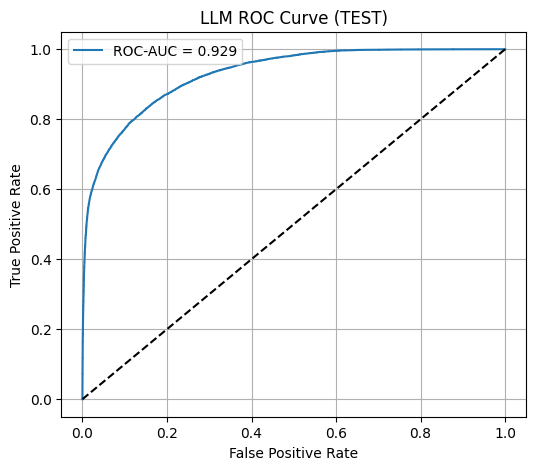

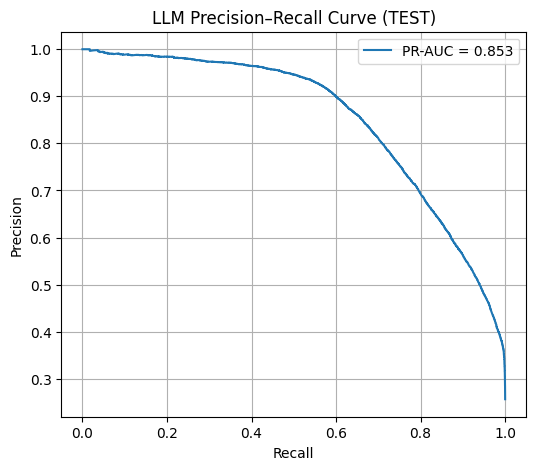

In [ ]:
# =========================
# LLM (BERT) Classifier
# GroupSplit + TRAIN2 oversample + VAL threshold (maximize F1)
# CONSISTENT with LR + RF + TTF + FTTransformer
# =========================

import os
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    precision_recall_curve, classification_report, roc_curve
)

from datasets import Dataset, DatasetDict
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification,
    DataCollatorWithPadding, TrainingArguments, Trainer,
    EarlyStoppingCallback
)

# -------------------------
# 0) Reproductibility
# -------------------------
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# -------------------------
# 1) Load ml_df.csv
# -------------------------
ml_df = pd.read_csv("ml_df.csv")

TARGET = "serious"
GROUP  = "primaryid"

NUMERIC_FEATURES = ["age_years", "receipt_year", "receipt_month"]
BINARY_FEATURES  = [
    "cat_dose_admin","cat_gi","cat_inj_site","cat_pancreas","cat_thyroid",
    "cat_gb","cat_metabolic","cat_renal","cat_psych","cat_msk",
    "cat_effectiveness","cat_other",
    "is_brand_only","is_generic_only","is_mixed"
]
NUMERIC_ALL = NUMERIC_FEATURES + BINARY_FEATURES
CAT_FEATURES = ["sex_bucket", "reporter_bucket", "indication_bucket", "molecule"]

ALL_COLS = [GROUP] + CAT_FEATURES + NUMERIC_ALL + [TARGET]
df = ml_df[ALL_COLS].copy()

# -------------------------
# 2) Hard dtype enforcement (BEFORE split) — match tabular pipeline
# -------------------------
df[GROUP] = df[GROUP].astype(str)

df[TARGET] = pd.to_numeric(df[TARGET], errors="coerce").fillna(0).astype(np.int64)
df[TARGET] = (df[TARGET] > 0).astype(np.int64)

for c in NUMERIC_FEATURES:
    df[c] = pd.to_numeric(df[c], errors="coerce").astype("float32")

for c in BINARY_FEATURES:
    df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0).astype("float32")

for c in CAT_FEATURES:
    df[c] = df[c].astype(str).fillna("MISSING")

print("Full label counts:", df[TARGET].value_counts().to_dict())

# -------------------------
# 3) Serialize rows -> text
# -------------------------
def drug_naming_type(row):
    if row.get("is_brand_only", 0) == 1:
        return "brand only"
    if row.get("is_generic_only", 0) == 1:
        return "generic only"
    if row.get("is_mixed", 0) == 1:
        return "mixed brand and generic"
    return "unknown"

def serialize_row(row):
    MONTH_NAMES = {
        1: 'January', 2: 'February', 3: 'March', 4: 'April',
        5: 'May', 6: 'June', 7: 'July', 8: 'August',
        9: 'September', 10: 'October', 11: 'November', 12: 'December'
    }

    CATEGORY_NAMES = {
        'cat_dose_admin': 'dosing/administration issues',
        'cat_inj_site': 'injection site reactions',
        'cat_gi': 'gastrointestinal disorders',
        'cat_pancreas': 'pancreatic effects',
        'cat_thyroid': 'thyroid disorders',
        'cat_gb': 'gallbladder disorders',
        'cat_metabolic': 'metabolic effects',
        'cat_renal': 'renal/urinary issues',
        'cat_psych': 'psychiatric issues',
        'cat_msk': 'musculoskeletal/amputation issues',
        'cat_effectiveness': 'drug effectiveness issues',
        'cat_other': 'other issues',
        "is_brand_only": "brand only",
        "is_generic_only": "generic only",
        "is_mixed": "mixed",     
    }

    parts = []
    parts.append(f"The reporter is {row['reporter_bucket']}.")
    parts.append(f"The receipt year is {int(row['receipt_year']) if pd.notna(row['receipt_year']) else row['receipt_year']}.")
    month_name = MONTH_NAMES.get(int(row['receipt_month']), row['receipt_month']) if pd.notna(row['receipt_month']) else row['receipt_month']
    parts.append(f"The receipt month is {month_name}.")
    if pd.notna(row['age_years']):
        parts.append(f"The patient is a {row['sex_bucket']} aged {int(row['age_years'])} years.")
    else:
        parts.append(f"The patient is a {row['sex_bucket']} (age not specified).")
    parts.append(f"The indication was {row['indication_bucket']}.")
    parts.append(f"The molecule administered was {row['molecule']}.")
    parts.append(f"The drug reported is {drug_naming_type(row)}.")

    cat_columns = [
        'cat_dose_admin','cat_inj_site','cat_gi','cat_pancreas','cat_thyroid',
        'cat_gb','cat_metabolic','cat_renal','cat_psych','cat_msk',
        'cat_effectiveness','cat_other'
    ]

    active = []
    for col in cat_columns:
        if float(row[col]) == 1.0:
            active.append(CATEGORY_NAMES[col])

    if active:
        if len(active) == 1:
            parts.append(f"The category of this adverse event: {active[0]}.")
        else:
            parts.append(f"The categories of this adverse event: {', '.join(active[:-1])} and {active[-1]}.")
    else:
        parts.append("No specific category was identified for this adverse event.")

    return " ".join(parts)

df["text"] = df.apply(serialize_row, axis=1)

# -------------------------
# 4) Group-aware split: TRAIN vs TEST (25%)
# -------------------------
gss = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=SEED)
train_idx, test_idx = next(gss.split(df, df[TARGET], groups=df[GROUP]))
train_df = df.iloc[train_idx].copy()
test_df  = df.iloc[test_idx].copy()

# -------------------------
# 5) Group-aware split: TRAIN2 vs VAL (20% of TRAIN)
# -------------------------
gss2 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=SEED)
train2_idx, val_idx = next(gss2.split(train_df, train_df[TARGET], groups=train_df[GROUP]))
train2_df = train_df.iloc[train2_idx].copy()
val_df    = train_df.iloc[val_idx].copy()

# -------------------------
# 6) Manual balanced class weights on TRAIN2 (reporting only)
# -------------------------
n0 = int((train2_df[TARGET] == 0).sum())
n1 = int((train2_df[TARGET] == 1).sum())
n  = n0 + n1
w0 = (n / (2.0 * n0)) if n0 > 0 else 1.0
w1 = (n / (2.0 * n1)) if n1 > 0 else 1.0
print("Class weights (from TRAIN2):", {0: float(w0), 1: float(w1)})

# -------------------------
# 7) Oversample TRAIN2 ONLY
# -------------------------
def oversample_train(df_in, target_col=TARGET, random_state=SEED):
    pos = df_in[df_in[target_col] == 1]
    neg = df_in[df_in[target_col] == 0]
    if len(pos) == 0 or len(neg) == 0:
        return df_in.sample(frac=1, random_state=random_state).reset_index(drop=True)
    if len(pos) < len(neg):
        pos_up = pos.sample(n=len(neg), replace=True, random_state=random_state)
        out = pd.concat([neg, pos_up], ignore_index=True)
    else:
        neg_up = neg.sample(n=len(pos), replace=True, random_state=random_state)
        out = pd.concat([pos, neg_up], ignore_index=True)
    return out.sample(frac=1, random_state=random_state).reset_index(drop=True)

train2_bal = oversample_train(train2_df)

print("TRAIN2 counts BEFORE:", train2_df[TARGET].value_counts().to_dict())
print("TRAIN2 counts AFTER :", train2_bal[TARGET].value_counts().to_dict())
print("VAL counts          :", val_df[TARGET].value_counts().to_dict())
print("TEST counts         :", test_df[TARGET].value_counts().to_dict())

# -------------------------
# 8) Build HF DatasetDict
#    (Train on TRAIN2_BAL only — consistent)
# -------------------------
ds = DatasetDict({
    "train": Dataset.from_pandas(train2_bal[["text", TARGET]].rename(columns={TARGET: "labels"}), preserve_index=False),
    "validation": Dataset.from_pandas(val_df[["text", TARGET]].rename(columns={TARGET: "labels"}), preserve_index=False),
    "test": Dataset.from_pandas(test_df[["text", TARGET]].rename(columns={TARGET: "labels"}), preserve_index=False),
})

# -------------------------
# 9) Tokenize
# -------------------------
model_name = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)

def tokenize(batch):
    return tokenizer(batch["text"], truncation=True, padding=False, max_length=256)

tokenized = ds.map(tokenize, batched=True)

collator = DataCollatorWithPadding(tokenizer)

# -------------------------
# 10) Metrics helper
# -------------------------
def softmax_prob1(logits_np: np.ndarray) -> np.ndarray:
    logits = logits_np.astype(np.float64)
    logits -= logits.max(axis=1, keepdims=True)
    exp = np.exp(logits)
    return exp[:, 1] / exp.sum(axis=1)

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    probs = softmax_prob1(logits)
    preds = (probs >= 0.5).astype(int)

    out = {}
    out["roc_auc"] = roc_auc_score(labels, probs) if len(np.unique(labels)) > 1 else float("nan")
    out["pr_auc"]  = average_precision_score(labels, probs) if len(np.unique(labels)) > 1 else float("nan")

    tp = np.sum((preds==1)&(labels==1)); tn = np.sum((preds==0)&(labels==0))
    fp = np.sum((preds==1)&(labels==0)); fn = np.sum((preds==0)&(labels==1))
    precision = tp / (tp + fp + 1e-8)
    recall    = tp / (tp + fn + 1e-8)
    f1        = 2*precision*recall/(precision+recall+1e-8)
    out.update(dict(precision=precision, recall=recall, f1=f1))
    return out

# -------------------------
# 11) Train (NO class-weight loss; oversampling already balances TRAIN2)
# -------------------------
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)

args = TrainingArguments(
    output_dir="faers_llm_group_split",
    learning_rate=3e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=16,
    gradient_accumulation_steps=4,
    num_train_epochs=10,                 # early stopping will stop sooner if needed
    evaluation_strategy="steps",
    save_strategy="steps",
    eval_steps=2000,
    save_steps=2000,
    load_best_model_at_end=True,
    metric_for_best_model="roc_auc",
    greater_is_better=True,
    report_to="none",
    seed=SEED,
)

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=tokenized["train"],
    eval_dataset=tokenized["validation"],
    tokenizer=tokenizer,
    data_collator=collator,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(
        early_stopping_patience=2,
        early_stopping_threshold=1e-4
    )],
)

trainer.train()

# -------------------------
# 12) Tune threshold on VAL (maximize F1) — consistent with tabular pipeline
# -------------------------
val_pred = trainer.predict(tokenized["validation"])
val_logits = val_pred.predictions
val_y = val_pred.label_ids.astype(int)
val_prob = softmax_prob1(val_logits)

def pick_threshold_f1(y_true, proba):
    p, r, t = precision_recall_curve(y_true, proba)
    f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-9)
    best_idx = int(np.argmax(f1))
    return float(t[best_idx]), float(f1[best_idx]), float(p[:-1][best_idx]), float(r[:-1][best_idx])

thr, best_f1, best_p, best_r = pick_threshold_f1(val_y, val_prob)
print(f"\n[LLM] Best VAL threshold (F1): {thr:.6f} | F1={best_f1:.4f} | P={best_p:.4f} | R={best_r:.4f}")

# -------------------------
# 13) Final TEST evaluation using VAL threshold
# -------------------------
test_pred = trainer.predict(tokenized["test"])
test_logits = test_pred.predictions
test_y = test_pred.label_ids.astype(int)
test_prob = softmax_prob1(test_logits)

def evaluate(name, y_true, proba, threshold):
    pred = (proba >= threshold).astype(int)
    print(f"\n===== {name} =====")
    print("Threshold:", threshold)
    print("ROC-AUC:", roc_auc_score(y_true, proba))
    print("PR-AUC :", average_precision_score(y_true, proba))
    print("Brier  :", brier_score_loss(y_true, proba))
    print(classification_report(y_true, pred, digits=3))

evaluate("LLM (GroupSplit + TRAIN2 oversample + VAL threshold)", test_y, test_prob, thr)

auc   = roc_auc_score(test_y, test_prob)
ap    = average_precision_score(test_y, test_prob)
brier = brier_score_loss(test_y, test_prob)
print(f"\n[LLM] ROC-AUC={auc:.3f}  PR-AUC={ap:.3f}  Brier={brier:.3f}")

# Curves (TEST)
fpr, tpr, _ = roc_curve(test_y, test_prob)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"ROC-AUC = {auc:.3f}")
plt.plot([0,1],[0,1],"k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("LLM ROC Curve (TEST)")
plt.legend()
plt.grid(True)
plt.show()

prec_curve, rec_curve, _ = precision_recall_curve(test_y, test_prob)
plt.figure(figsize=(6,5))
plt.plot(rec_curve, prec_curve, label=f"PR-AUC = {ap:.3f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("LLM Precision–Recall Curve (TEST)")
plt.legend()
plt.grid(True)
plt.show()

In [24]:
# ============================================================
# ABLATION: LLM/BERT (no cat_* features)
# Only change from original: serialize_row_nocat omits cat_* section
# ============================================================

import os
import numpy as np
import pandas as pd
import torch

from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import (
    roc_auc_score, average_precision_score, brier_score_loss,
    precision_recall_curve, classification_report, roc_curve
)
from datasets import Dataset, DatasetDict
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification,
    DataCollatorWithPadding, TrainingArguments, Trainer,
    EarlyStoppingCallback
)

SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
device = "cuda" if torch.cuda.is_available() else "cpu"

# ── 1. Load data (same as original) ──
ml_df_llm = pd.read_csv("ml_df.csv")

TARGET = "serious"
GROUP  = "primaryid"

NUMERIC_FEATURES = ["age_years", "receipt_year", "receipt_month"]
BINARY_FEATURES  = [
    "cat_dose_admin","cat_gi","cat_inj_site","cat_pancreas","cat_thyroid",
    "cat_gb","cat_metabolic","cat_renal","cat_psych","cat_msk",
    "cat_effectiveness","cat_other",
    "is_brand_only","is_generic_only","is_mixed"
]
NUMERIC_ALL = NUMERIC_FEATURES + BINARY_FEATURES
CAT_FEATURES = ["sex_bucket", "reporter_bucket", "indication_bucket", "molecule"]

ALL_COLS = [GROUP] + CAT_FEATURES + NUMERIC_ALL + [TARGET]
df_llm = ml_df_llm[ALL_COLS].copy()

df_llm[GROUP]  = df_llm[GROUP].astype(str)
df_llm[TARGET] = pd.to_numeric(df_llm[TARGET], errors="coerce").fillna(0).astype(np.int64)
df_llm[TARGET] = (df_llm[TARGET] > 0).astype(np.int64)
for c in NUMERIC_FEATURES:
    df_llm[c] = pd.to_numeric(df_llm[c], errors="coerce").astype("float32")
for c in BINARY_FEATURES:
    df_llm[c] = pd.to_numeric(df_llm[c], errors="coerce").fillna(0).astype("float32")
for c in CAT_FEATURES:
    df_llm[c] = df_llm[c].astype(str).fillna("MISSING")

# ── CHANGE 1: serialize_row_nocat — identical to serialize_row
#              but WITHOUT the cat_* section at the bottom ──
def serialize_row_nocat(row):
    MONTH_NAMES = {
        1:'January',2:'February',3:'March',4:'April',
        5:'May',6:'June',7:'July',8:'August',
        9:'September',10:'October',11:'November',12:'December'
    }
    parts = []
    parts.append(f"The reporter is {row['reporter_bucket']}.")
    parts.append(f"The receipt year is {int(row['receipt_year']) if pd.notna(row['receipt_year']) else row['receipt_year']}.")
    month_name = MONTH_NAMES.get(int(row['receipt_month']), row['receipt_month']) if pd.notna(row['receipt_month']) else row['receipt_month']
    parts.append(f"The receipt month is {month_name}.")
    if pd.notna(row['age_years']):
        parts.append(f"The patient is a {row['sex_bucket']} aged {int(row['age_years'])} years.")
    else:
        parts.append(f"The patient is a {row['sex_bucket']} (age not specified).")
    parts.append(f"The indication was {row['indication_bucket']}.")
    parts.append(f"The molecule administered was {row['molecule']}.")
    parts.append(f"The drug reported is {drug_naming_type(row)}.")
    # NO cat_* section — this is the only content difference
    return " ".join(parts)

df_llm["text"] = df_llm.apply(serialize_row_nocat, axis=1)  # CHANGE 1 applied here
print(f"Example no-cat text:\n{df_llm['text'].iloc[0]}\n")

# ── 2. Same splits ──
gss  = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=SEED)
gss2 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=SEED)

train_idx_l, test_idx_l = next(gss.split(df_llm, df_llm[TARGET], groups=df_llm[GROUP]))
train_df_l = df_llm.iloc[train_idx_l].copy()
test_df_l  = df_llm.iloc[test_idx_l].copy()

train2_idx_l, val_idx_l = next(gss2.split(train_df_l, train_df_l[TARGET], groups=train_df_l[GROUP]))
train2_df_l = train_df_l.iloc[train2_idx_l].copy()
val_df_l    = train_df_l.iloc[val_idx_l].copy()

train2_bal_l = oversample_train(train2_df_l, target_col=TARGET, random_state=SEED)

print("TRAIN2 AFTER:", train2_bal_l[TARGET].value_counts().to_dict())
print("VAL:", val_df_l[TARGET].value_counts().to_dict())
print("TEST:", test_df_l[TARGET].value_counts().to_dict())

# ── 3. HF DatasetDict ──
ds_nocat = DatasetDict({
    "train":      Dataset.from_pandas(train2_bal_l[["text", TARGET]].rename(columns={TARGET: "labels"}), preserve_index=False),
    "validation": Dataset.from_pandas(val_df_l[["text", TARGET]].rename(columns={TARGET: "labels"}),     preserve_index=False),
    "test":       Dataset.from_pandas(test_df_l[["text", TARGET]].rename(columns={TARGET: "labels"}),    preserve_index=False),
})

# ── 4. Tokenize ──
model_name = "bert-base-uncased"
tokenizer_nocat = AutoTokenizer.from_pretrained(model_name)

def tokenize_nocat(batch):
    return tokenizer_nocat(batch["text"], truncation=True, padding=False, max_length=256)

tokenized_nocat = ds_nocat.map(tokenize_nocat, batched=True)
collator_nocat  = DataCollatorWithPadding(tokenizer_nocat)

# ── 5. Train ── CHANGE 2: output_dir is different ──
model_nocat = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)

args_nocat = TrainingArguments(
    output_dir="faers_llm_nocat",          # CHANGE 2: separate output dir
    learning_rate=3e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=16,
    gradient_accumulation_steps=4,
    num_train_epochs=10,
    evaluation_strategy="steps",
    save_strategy="steps",
    eval_steps=2000,
    save_steps=2000,
    load_best_model_at_end=True,
    metric_for_best_model="roc_auc",
    greater_is_better=True,
    report_to="none",
    seed=SEED,
)

trainer_nocat = Trainer(
    model=model_nocat,
    args=args_nocat,
    train_dataset=tokenized_nocat["train"],
    eval_dataset=tokenized_nocat["validation"],
    tokenizer=tokenizer_nocat,
    data_collator=collator_nocat,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=2,
                                     early_stopping_threshold=1e-4)],
)

trainer_nocat.train()

# ── 6. Tune threshold on VAL ──
val_pred_nc   = trainer_nocat.predict(tokenized_nocat["validation"])
val_prob_nc   = softmax_prob1(val_pred_nc.predictions)
val_y_nc      = val_pred_nc.label_ids.astype(int)
thr_nc, _, _, _ = pick_threshold_f1(val_y_nc, val_prob_nc)
print(f"[LLM no-cat] VAL threshold: {thr_nc:.6f}")

# ── 7. Evaluate on TEST ── CHANGE 3: append to results_nocat ──
test_pred_nc  = trainer_nocat.predict(tokenized_nocat["test"])
test_prob_nc  = softmax_prob1(test_pred_nc.predictions)
test_y_nc     = test_pred_nc.label_ids.astype(int)

results_nocat.append(eval_nocat(test_y_nc, test_prob_nc, 'LLM (no cat)'))  # CHANGE 3

# ── 8. Final summary ──
df_results = pd.DataFrame(results_nocat)
print("\n=== FULL ABLATION RESULTS (no cat_* features) ===")
print(df_results.to_string(index=False))

print("\n=== AUROC DROP vs FULL MODEL ===")
full = {
    'LR+Iso (no cat)': 0.876, 'RF+Iso (no cat)': 0.916,
    'TTF (no cat)':    0.917, 'FTT (no cat)':    0.917,
    'LLM (no cat)':    0.929
}
for r in results_nocat:
    drop = full[r['model']] - r['roc_auc']
    print(f"  {r['model']:22s}: {full[r['model']]:.3f} -> {r['roc_auc']:.3f}  (Δ={drop:+.3f})")

Example no-cat text:
The reporter is Healthcare professional. The receipt year is 2019. The receipt month is September. The patient is a Female aged 62 years. The indication was Type 2 Diabetes. The molecule administered was semaglutide. The drug reported is brand only.

TRAIN2 AFTER: {1: 108124, 0: 108124}
VAL: {0: 27069, 1: 9258}
TEST: {0: 45047, 1: 15540}


Map:   0%|          | 0/216248 [00:00<?, ? examples/s]

Map:   0%|          | 0/36327 [00:00<?, ? examples/s]

Map:   0%|          | 0/60587 [00:00<?, ? examples/s]

A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

Step,Training Loss,Validation Loss,Roc Auc,Pr Auc,Precision,Recall,F1
2000,0.518600,0.475071,0.811673,0.699772,0.641410,0.591596,0.615497
4000,0.505700,0.459949,0.824425,0.719980,0.674770,0.593649,0.631615
6000,0.502700,0.482880,0.828355,0.715965,0.637711,0.636747,0.637228
8000,0.488500,0.511935,0.826787,0.721278,0.533528,0.710737,0.609513
10000,0.489900,0.451394,0.833393,0.734053,0.614533,0.659538,0.636240
12000,0.489800,0.456539,0.834452,0.735154,0.629614,0.652193,0.640705
14000,0.480100,0.447230,0.837411,0.738131,0.637557,0.650572,0.643999
16000,0.486500,0.459802,0.833158,0.736406,0.617902,0.654677,0.635758
18000,0.479300,0.476066,0.837377,0.739859,0.600210,0.678980,0.637170


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/ut

[LLM no-cat] VAL threshold: 0.534686


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[LLM (no cat)]  ROC-AUC=0.8308  PR-AUC=0.7312  Brier=0.1418

=== FULL ABLATION RESULTS (no cat_* features) ===
          model  roc_auc  pr_auc  brier
LR+Iso (no cat)    0.767   0.561  0.151
RF+Iso (no cat)    0.785   0.673  0.130
   TTF (no cat)    0.817   0.699  0.151
   FTT (no cat)    0.786   0.703  0.156
   LLM (no cat)    0.831   0.731  0.142

=== AUROC DROP vs FULL MODEL ===
  LR+Iso (no cat)       : 0.876 -> 0.767  (Δ=+0.109)
  RF+Iso (no cat)       : 0.916 -> 0.785  (Δ=+0.131)
  TTF (no cat)          : 0.917 -> 0.817  (Δ=+0.100)
  FTT (no cat)          : 0.917 -> 0.786  (Δ=+0.131)
  LLM (no cat)          : 0.929 -> 0.831  (Δ=+0.098)


In [45]:
# ============================================================
# LLM SHAP (FIELD-LEVEL, NUMERIC) -> SAME 2 summary_plot calls
# Saves: shap_llm_bar.png and shap_llm_summary.png
# ============================================================

import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt
import re
from transformers import TextClassificationPipeline

import os, random

# -------------------------
# Reproducibility + cache
# -------------------------
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"

import os as _os
import glob as _glob

ARTIFACTS_BASE = "shap_llm_artifacts"
ARTIFACTS_EXT  = ".npz"

# Find the next available index by checking existing files
existing = _glob.glob(f"{ARTIFACTS_BASE}*{ARTIFACTS_EXT}")
existing_indices = []
for f in existing:
    name = f[:-len(ARTIFACTS_EXT)]  # strip .npz
    suffix = name[len(ARTIFACTS_BASE):]  # '', '_1', '_2', etc.
    if suffix == "":
        existing_indices.append(0)
    elif suffix.startswith("_") and suffix[1:].isdigit():
        existing_indices.append(int(suffix[1:]))

next_idx = max(existing_indices, default=-1) + 1
ARTIFACTS = f"{ARTIFACTS_BASE}_{next_idx}{ARTIFACTS_EXT}" if next_idx > 0 else f"{ARTIFACTS_BASE}{ARTIFACTS_EXT}"

print(f"This run will save to: {ARTIFACTS}")


# -------------------------
# 0) Pipeline (CPU)
# -------------------------
best_model = trainer.model.eval().to("cpu")

pipe = TextClassificationPipeline(
    model=best_model,
    tokenizer=tokenizer,
    return_all_scores=True,
    device=-1
)

def predict_proba_serious_text(texts):
    out = pipe(list(texts))
    probs1 = []
    for row in out:
        p1 = None
        for d in row:
            if str(d["label"]).endswith("1"):
                p1 = float(d["score"]); break
        probs1.append(p1 if p1 is not None else 0.5)
    return np.asarray(probs1, dtype=np.float64)

# -------------------------
# 1) Field list
# -------------------------
CAT_FIELDS = ["reporter_bucket","sex_bucket","indication_bucket","molecule"]
NUM_FIELDS = ["receipt_year","receipt_month","age_years",
              "is_brand_only","is_generic_only","is_mixed",
              "cat_dose_admin","cat_inj_site","cat_gi","cat_pancreas","cat_thyroid","cat_gb",
              "cat_metabolic","cat_renal","cat_psych","cat_msk","cat_effectiveness","cat_other"]

FEATURES = CAT_FIELDS + NUM_FIELDS

# -------------------------
# 2) Pretty names + Title Case (and "=" style)
# -------------------------
PRETTY = {
    "reporter_bucket":"Reporter",
    "receipt_year":"Receipt Year",
    "receipt_month":"Receipt Month",
    "sex_bucket":"Sex",
    "age_years":"Age (Years)",
    "indication_bucket":"Indication",
    "molecule":"Molecule",
    "is_brand_only":"Brand Only",
    "is_generic_only":"Generic Only",
    "is_mixed":"Mixed",
    "cat_dose_admin":"Dosing / Administration Issues",
    "cat_inj_site":"Injection-Site Reactions",
    "cat_gi":"Gastrointestinal Disorders",
    "cat_pancreas":"Pancreatic Effects",
    "cat_thyroid":"Thyroid Disorders",
    "cat_gb":"Gallbladder Disorders",
    "cat_metabolic":"Metabolic Disorders",
    "cat_renal":"Renal / Urinary Disorders",
    "cat_psych":"Psychiatric Disorders",
    "cat_msk":"Musculoskeletal / Amputation",
    "cat_effectiveness":"Effectiveness Issues",
    "cat_other":"Other AE Category",
}

ACRONYMS = {"AE","LLM","ROC","PR","AUC"}

def title_case(s: str) -> str:
    tokens = re.split(r"(\s+)", str(s))  # keep spaces
    out = []

    for tok in tokens:
        if tok.strip() == "":
            out.append(tok)
            continue

        # Preserve acronyms
        if tok.upper() in ACRONYMS or (tok.isupper() and len(tok) <= 5):
            out.append(tok.upper())
            continue

        # Parentheses like "(years)"
        if tok.startswith("(") and tok.endswith(")"):
            inner = tok[1:-1]
            if inner:
                inner = inner[:1].upper() + inner[1:].lower()
            out.append(f"({inner})")
            continue

        # Hyphenated words like "Injection-site"
        if "-" in tok:
            parts = tok.split("-")
            parts = [p[:1].upper() + p[1:].lower() if p else p for p in parts]
            out.append("-".join(parts))
        else:
            out.append(tok[:1].upper() + tok[1:].lower())

    return "".join(out)

def pretty_onehot(col: str) -> str:
    # pandas dummy columns look like "molecule=semaglutide"
    if "=" in col:
        base, val = col.split("=", 1)
        base_name = PRETTY.get(base, base)
        return title_case(f"{base_name} = {val}")
    return title_case(PRETTY.get(col, col))


# -------------------------
# 3) Build BG/EVAL numeric matrices
# -------------------------
bg_df = train2_df[FEATURES].copy()
ev_df = test_df[FEATURES].copy()

# clean categoricals
for c in CAT_FIELDS:
    bg_df[c] = bg_df[c].astype("string").fillna("MISSING")
    ev_df[c] = ev_df[c].astype("string").fillna("MISSING")

# clean numerics/binaries
for c in NUM_FIELDS:
    bg_df[c] = pd.to_numeric(bg_df[c], errors="coerce").fillna(0).astype("float32")
    ev_df[c] = pd.to_numeric(ev_df[c], errors="coerce").fillna(0).astype("float32")

# one-hot categoricals (stable numeric SHAP)
bg_oh = pd.get_dummies(bg_df, columns=CAT_FIELDS, prefix=CAT_FIELDS, prefix_sep="=", drop_first=False)
ev_oh = pd.get_dummies(ev_df, columns=CAT_FIELDS, prefix=CAT_FIELDS, prefix_sep="=", drop_first=False)

# align columns
bg_oh, ev_oh = bg_oh.align(ev_oh, join="left", axis=1, fill_value=0)
ev_oh = ev_oh[bg_oh.columns]  # same order

feature_names = list(bg_oh.columns)
pretty_feature_names = [pretty_onehot(c) for c in feature_names]

# subsample
SHAP_BG_N     = 50
SHAP_EVAL_N   = 150
SHAP_NSAMPLES = 300

rng = np.random.default_rng(SEED)

n_bg = len(bg_oh)
n_ev = len(ev_oh)

bg_n   = min(SHAP_BG_N, n_bg)
eval_n = min(SHAP_EVAL_N, n_ev)

idx_bg   = rng.choice(n_bg, size=bg_n, replace=False)
idx_eval = rng.choice(n_ev, size=eval_n, replace=False)

bg_oh_s = bg_oh.iloc[idx_bg]
ev_oh_s = ev_oh.iloc[idx_eval]

X_bg = bg_oh_s.to_numpy(dtype=np.float32)
X_ev = ev_oh_s.to_numpy(dtype=np.float32)

# -------------------------
# 4) Decode one-hot -> fields -> rebuild text -> model proba
# -------------------------
MONTH_NAMES = {1:'January',2:'February',3:'March',4:'April',5:'May',6:'June',7:'July',8:'August',9:'September',10:'October',11:'November',12:'December'}

CATEGORY_NAMES = {
    'cat_dose_admin': 'dosing/administration issues',
    'cat_inj_site': 'injection site reactions',
    'cat_gi': 'gastrointestinal disorders',
    'cat_pancreas': 'pancreatic effects',
    'cat_thyroid': 'thyroid disorders',
    'cat_gb': 'gallbladder disorders',
    'cat_metabolic': 'metabolic effects',
    'cat_renal': 'renal/urinary issues',
    'cat_psych': 'psychiatric issues',
    'cat_msk': 'musculoskeletal/amputation issues',
    'cat_effectiveness': 'drug effectiveness issues',
    'cat_other': 'other issues'
}
CAT_COLUMNS = list(CATEGORY_NAMES.keys())

def kind_bucket(is_brand_only, is_generic_only, is_mixed):
    if is_brand_only >= 0.5: return "Brand Only"
    if is_generic_only >= 0.5: return "Generic Only"
    if is_mixed >= 0.5: return "Mixed"
    return "Unknown"

# Precompute one-hot groups for decoding
onehot_groups = {}
for base in CAT_FIELDS:
    cols = [i for i, name in enumerate(feature_names) if name.startswith(f"{base}=")]
    onehot_groups[base] = cols

# numeric column indices
num_idx = {name: i for i, name in enumerate(feature_names) if "=" not in name}

def build_text_from_vector(x_row: np.ndarray) -> str:
    row = {}

    # decode categoricals by argmax over their one-hot columns
    for base in CAT_FIELDS:
        idxs = onehot_groups[base]
        if len(idxs) == 0:
            row[base] = "MISSING"
            continue
        j = idxs[int(np.argmax(x_row[idxs]))]
        val = feature_names[j].split("=", 1)[1]
        row[base] = val

    # numerics
    for k in NUM_FIELDS:
        row[k] = float(x_row[num_idx[k]])

    # rebuild text
    parts = []
    parts.append(f"The Reporter Is {row.get('reporter_bucket','MISSING')}.")
    parts.append(f"The Receipt Year Is {int(row['receipt_year']) if row['receipt_year']>0 else 'MISSING'}.")
    m = int(row["receipt_month"]) if row["receipt_month"]>0 else None
    parts.append(f"The Receipt Month Is {MONTH_NAMES.get(m, m) if m is not None else 'MISSING'}.")

    age = row["age_years"]
    sex = row.get("sex_bucket","MISSING")
    if age <= 0:
        parts.append(f"The Patient Is A {sex} (Age Not Specified).")
    else:
        parts.append(f"The Patient Is A {sex} Aged {int(age)} Years.")

    parts.append(f"The Indication Was {row.get('indication_bucket','MISSING')}.")
    parts.append(f"The Molecule Administered Was {row.get('molecule','MISSING')}.")
    parts.append(f"The Drug Type Is {kind_bucket(row['is_brand_only'], row['is_generic_only'], row['is_mixed'])}.")

    active = [CATEGORY_NAMES[c] for c in CAT_COLUMNS if row.get(c,0.0) >= 0.5]
    if len(active) == 0:
        parts.append("No Specific Adverse Event Category Was Identified.")
    elif len(active) == 1:
        parts.append(f"The Adverse Event Category Was {active[0]}.")
    else:
        parts.append(f"The Adverse Event Categories Were {', '.join(active[:-1])} And {active[-1]}.")

    return " ".join(parts)

def shap_predict_fn(X: np.ndarray) -> np.ndarray:
    texts = [build_text_from_vector(X[i]) for i in range(X.shape[0])]
    return predict_proba_serious_text(texts)

print("Quick SHAP predict_fn test:", shap_predict_fn(X_bg[:3]))

# -------------------------
# 5) KernelExplainer (cached)
# -------------------------
if os.path.exists(ARTIFACTS):
    print(f"[SHAP] Loading cached artifacts: {ARTIFACTS}")
    data = np.load(ARTIFACTS, allow_pickle=True)

    shap_values = data["shap_values"]
    expected_value = data["expected_value"].item()

    feature_names = list(data["feature_names"])
    # regenerate labels using NEW title_case() logic
    pretty_feature_names = [pretty_onehot(c) for c in feature_names]

    idx_bg = data["idx_bg"]
    idx_eval = data["idx_eval"]

    # enforce exact feature order used during SHAP computation
    bg_oh = bg_oh[feature_names]
    ev_oh = ev_oh[feature_names]

    bg_oh_s = bg_oh.iloc[idx_bg]
    ev_oh_s = ev_oh.iloc[idx_eval]

    X_bg = bg_oh_s.to_numpy(dtype=np.float32)
    X_ev = ev_oh_s.to_numpy(dtype=np.float32)

else:
    print("Building SHAP KernelExplainer...")
    explainer = shap.KernelExplainer(shap_predict_fn, X_bg)

    print("Computing SHAP values...")
    shap_values = explainer.shap_values(X_ev, nsamples=SHAP_NSAMPLES)
    if isinstance(shap_values, list):
        shap_values = shap_values[0]

    expected_value = explainer.expected_value

    np.savez(
        ARTIFACTS,
        shap_values=shap_values,
        expected_value=np.array(expected_value, dtype=object),
        feature_names=np.array(feature_names, dtype=object),
        pretty_feature_names=np.array(pretty_feature_names, dtype=object),
        idx_bg=np.array(idx_bg),
        idx_eval=np.array(idx_eval),
        seed=np.array(SEED),
        shap_bg_n=np.array(SHAP_BG_N),
        shap_eval_n=np.array(SHAP_EVAL_N),
        shap_nsamples=np.array(SHAP_NSAMPLES),
    )
    print(f"[SHAP] Saved artifacts: {ARTIFACTS}")

if isinstance(shap_values, list):
    shap_values = shap_values[0]

# -------------------------
# 6) Panel A/B plot (bar + beeswarm)
# -------------------------
import textwrap
import matplotlib as mpl

mpl.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor": "white",
    "axes.edgecolor": "black",
    "axes.linewidth": 0.8,
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.titleweight": "bold",
})

def wrap_label(s, width=30):
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=False))

def remove_shap_guides(ax):
    ax.grid(False)
    for line in list(ax.lines):
        if line.get_linestyle() in ("--", ":"):
            try:
                line.remove()
            except Exception:
                pass

topk = 20
imp = np.abs(shap_values).mean(axis=0)
idx = np.argsort(imp)[::-1][:topk]   # top features (descending)
idx_plot = idx[::-1]                # reverse for bar top->bottom

labels = [wrap_label(pretty_feature_names[i], width=30) for i in idx_plot]
vals   = imp[idx_plot]

FIG_W, FIG_H, DPI = 16, 8, 300
fig = plt.figure(figsize=(FIG_W, FIG_H), dpi=DPI, facecolor="white")
gs = fig.add_gridspec(1, 2, width_ratios=[1.15, 1.35], wspace=0.10)

# ===== Panel A: bar =====
ax1 = fig.add_subplot(gs[0, 0])
bar_color = "#ff0051"
ax1.barh(np.arange(topk), vals, color=bar_color, edgecolor="none")
ax1.set_yticks(np.arange(topk))
ax1.set_yticklabels(labels)
ax1.set_xlabel("Mean(|SHAP value|)")

xmax = float(vals.max()) * 1.18
ax1.set_xlim(0, xmax)
for y, v in enumerate(vals):
    ax1.text(v + xmax*0.01, y, f"{v:.2g}", va="center", ha="left", fontsize=10)

ax1.set_title("A  SHAP (LLM Field-Level)\nTop 20 Mean |SHAP|", loc="left")
ax1.grid(False)
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)

# ===== Panel B: beeswarm =====
ax2 = fig.add_subplot(gs[0, 1])
plt.sca(ax2)

# Build Explanation for beeswarm using the same eval rows & top features
idx_rev = idx[::-1]  # same order as bar panel labels
shap_top = shap_values[:, idx_rev]
X_top = X_ev[:, idx_rev]

exp_top = shap.Explanation(
    values=shap_top,
    base_values=np.repeat(expected_value, shap_top.shape[0]),
    data=X_top,
    feature_names=[pretty_feature_names[i] for i in idx_rev],
)

shap.plots.beeswarm(exp_top, max_display=topk, show=False, plot_size=None)

ax2.set_title("B  SHAP Beeswarm — LLM Field-Level\n(Class = Serious)", loc="left")
remove_shap_guides(ax2)

ax2.set_yticklabels([])
ax2.set_ylabel("")
ax2.tick_params(axis="y", length=0)

ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)

fig.subplots_adjust(left=0.30, right=0.96, top=0.92, bottom=0.12)

plt.savefig("shap_llm_panel_AB.png", dpi=DPI, bbox_inches="tight", facecolor="white")
plt.savefig("shap_llm_panel_AB.pdf", bbox_inches="tight", facecolor="white")

plt.savefig(
    "fig2.tif",
    dpi=DPI,
    bbox_inches="tight",
    facecolor="white",
    format="tiff",
    pil_kwargs={"compression": "tiff_lzw", "dpi": (DPI, DPI)}
)
from PIL import Image

# Run this after saving each figure — fixes both RGBA and re-saves correctly
Image.open("fig2.tif").convert("RGB").save(
    "fig2.tif", format="tiff", compression="tiff_lzw", dpi=(300, 300)
)

plt.savefig("fig2.pdf", bbox_inches="tight", facecolor="white")
plt.close()

print("Saved: fig2.tif, fig2.pdf")
print("Saved:")
print(" - shap_llm_panel_AB.png")
print(" - shap_llm_panel_AB.pdf")


This run will save to: shap_llm_artifacts_1.npz
Quick SHAP predict_fn test: [0.00107617 0.0014026  0.00241154]
Building SHAP KernelExplainer...


/home/zchu/FAERS/faers/lib/python3.10/site-packages/transformers/pipelines/text_classification.py:104: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


Computing SHAP values...


  0%|          | 0/150 [00:00<?, ?it/s]

[SHAP] Saved artifacts: shap_llm_artifacts_1.npz
Saved: fig2.tif, fig2.pdf
Saved:
 - shap_llm_panel_AB.png
 - shap_llm_panel_AB.pdf


In [1]:
import numpy as np
old = np.load('shap_llm_artifacts.npz', allow_pickle=True)
print(old.files)  # see what keys are in the file

['shap_values', 'expected_value', 'feature_names', 'pretty_feature_names', 'idx_bg', 'idx_eval', 'seed', 'shap_bg_n', 'shap_eval_n', 'shap_nsamples']


In [2]:
import numpy as np
import pandas as pd

old = np.load('shap_llm_artifacts.npz', allow_pickle=True)

shap_values = old['shap_values']
feature_names = old['pretty_feature_names']

mean_abs_shap = np.abs(shap_values).mean(axis=0)
shap_dict = dict(zip(feature_names, mean_abs_shap))

df = pd.DataFrame({'feature': list(shap_dict.keys()), 'mean_abs_shap': list(shap_dict.values())})
df = df.sort_values('mean_abs_shap', ascending=False).reset_index(drop=True)
df['rank'] = df.index + 1

gi_row = df[df['feature'].str.contains('astro', case=False)]
panc_row = df[df['feature'].str.contains('ancreatic', case=False)]
print(gi_row[['rank','feature','mean_abs_shap']])
print(panc_row[['rank','feature','mean_abs_shap']])
print()
print('Full top 20:')
print(df.head(20)[['rank','feature','mean_abs_shap']].to_string(index=False))

    rank                     feature  mean_abs_shap
16    17  Gastrointestinal Disorders       0.007125
   rank             feature  mean_abs_shap
0     1  Pancreatic Effects       0.057689

Full top 20:
 rank                            feature  mean_abs_shap
    1                 Pancreatic Effects       0.057689
    2     Dosing / Administration Issues       0.055511
    3                      Receipt Month       0.048027
    4             Molecule = Semaglutide       0.040009
    5           Injection-site Reactions       0.037293
    6                  Other AE Category       0.027377
    7                       Receipt Year       0.026601
    8             Molecule = Liraglutide       0.025244
    9          Renal / Urinary Disorders       0.024543
   10                        Age (years)       0.021566
   11       Musculoskeletal / Amputation       0.011980
   12                Reporter = Consumer       0.011062
   13             Molecule = Dulaglutide       0.010673
   14       

In [46]:
# ============================================================
# BOOTSTRAP STABILITY: mean ± SD of mean |SHAP| across 10 resamples
# ============================================================
import numpy as np

N_BOOTSTRAP = 10
rng_boot = np.random.default_rng(SEED)

n_eval_rows = shap_values.shape[0]
boot_means = []  # will hold one (n_features,) array per bootstrap resample

for b in range(N_BOOTSTRAP):
    idx_boot = rng_boot.choice(n_eval_rows, size=n_eval_rows, replace=True)
    boot_mean_abs_shap = np.abs(shap_values[idx_boot]).mean(axis=0)
    boot_means.append(boot_mean_abs_shap)

boot_means = np.array(boot_means)  # shape: (N_BOOTSTRAP, n_features)

mean_of_boot = boot_means.mean(axis=0)
sd_of_boot   = boot_means.std(axis=0)

# Build a readable summary table
import pandas as pd
stability_df = pd.DataFrame({
    "feature": pretty_feature_names,
    "mean_abs_shap": mean_of_boot,
    "sd_abs_shap": sd_of_boot,
    "cv_pct": 100 * sd_of_boot / (mean_of_boot + 1e-12),  # coefficient of variation
}).sort_values("mean_abs_shap", ascending=False)

print(f"=== Bootstrap stability (N={N_BOOTSTRAP} resamples, SHAP_NSAMPLES={SHAP_NSAMPLES}) ===")
print(stability_df.head(20).to_string(index=False))

stability_df.to_csv("shap_llm_bootstrap_stability.csv", index=False)
print("\nSaved: shap_llm_bootstrap_stability.csv")

=== Bootstrap stability (N=10 resamples, SHAP_NSAMPLES=300) ===
                           feature  mean_abs_shap  sd_abs_shap    cv_pct
    Dosing / Administration Issues       0.063898     0.002976  4.656979
                Pancreatic Effects       0.059383     0.009648 16.246434
                 Other AE Category       0.056207     0.005307  9.441856
                     Receipt Month       0.054266     0.005094  9.386749
            Molecule = Semaglutide       0.046994     0.007873 16.753156
                      Receipt Year       0.044629     0.005348 11.982988
          Injection-Site Reactions       0.034501     0.003261  9.452947
            Molecule = Liraglutide       0.034276     0.003771 11.002383
                       Age (Years)       0.021349     0.001880  8.805504
            Molecule = Dulaglutide       0.016431     0.001862 11.334754
               Indication = Others       0.013755     0.001671 12.149645
         Renal / Urinary Disorders       0.013011     0.0051

In [2]:
# ============================================================
# C4: Multi-seed LLM stability (3 seeds → mean ± SD AUROC)
# Fully self-contained — runs independently of cell 157
# ============================================================
import os
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import roc_auc_score, average_precision_score, brier_score_loss, precision_recall_curve
from datasets import Dataset, DatasetDict
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification,
    DataCollatorWithPadding, TrainingArguments, Trainer,
    EarlyStoppingCallback
)

# ── Constants (same as cell 157) ──
TARGET = "serious"
GROUP  = "primaryid"
NUMERIC_FEATURES = ["age_years", "receipt_year", "receipt_month"]
BINARY_FEATURES  = [
    "cat_dose_admin","cat_gi","cat_inj_site","cat_pancreas","cat_thyroid",
    "cat_gb","cat_metabolic","cat_renal","cat_psych","cat_msk",
    "cat_effectiveness","cat_other",
    "is_brand_only","is_generic_only","is_mixed"
]
NUMERIC_ALL  = NUMERIC_FEATURES + BINARY_FEATURES
CAT_FEATURES = ["sex_bucket", "reporter_bucket", "indication_bucket", "molecule"]
ALL_COLS     = [GROUP] + CAT_FEATURES + NUMERIC_ALL + [TARGET]

# ── Load data ──
ml_df_c4 = pd.read_csv("ml_df.csv")
df_c4_base = ml_df_c4[ALL_COLS].copy()
df_c4_base[GROUP]  = df_c4_base[GROUP].astype(str)
df_c4_base[TARGET] = pd.to_numeric(df_c4_base[TARGET], errors="coerce").fillna(0).astype(int)
df_c4_base[TARGET] = (df_c4_base[TARGET] > 0).astype(int)
for c in NUMERIC_FEATURES:
    df_c4_base[c] = pd.to_numeric(df_c4_base[c], errors="coerce").astype("float32")
for c in BINARY_FEATURES:
    df_c4_base[c] = pd.to_numeric(df_c4_base[c], errors="coerce").fillna(0).astype("float32")
for c in CAT_FEATURES:
    df_c4_base[c] = df_c4_base[c].astype(str).fillna("MISSING")

# ── Helper functions (same as cell 157) ──
def drug_naming_type(row):
    if row.get("is_brand_only", 0) == 1:   return "brand only"
    if row.get("is_generic_only", 0) == 1: return "generic only"
    if row.get("is_mixed", 0) == 1:        return "mixed brand and generic"
    return "unknown"

def serialize_row(row):
    MONTH_NAMES = {
        1:'January',2:'February',3:'March',4:'April',
        5:'May',6:'June',7:'July',8:'August',
        9:'September',10:'October',11:'November',12:'December'
    }
    CATEGORY_NAMES = {
        'cat_dose_admin': 'dosing/administration issues',
        'cat_inj_site':   'injection site reactions',
        'cat_gi':         'gastrointestinal disorders',
        'cat_pancreas':   'pancreatic effects',
        'cat_thyroid':    'thyroid disorders',
        'cat_gb':         'gallbladder disorders',
        'cat_metabolic':  'metabolic effects',
        'cat_renal':      'renal/urinary issues',
        'cat_psych':      'psychiatric issues',
        'cat_msk':        'musculoskeletal/amputation issues',
        'cat_effectiveness': 'drug effectiveness issues',
        'cat_other':      'other issues',
    }
    parts = []
    parts.append(f"The reporter is {row['reporter_bucket']}.")
    parts.append(f"The receipt year is {int(row['receipt_year']) if pd.notna(row['receipt_year']) else row['receipt_year']}.")
    month_name = MONTH_NAMES.get(int(row['receipt_month']), row['receipt_month']) if pd.notna(row['receipt_month']) else row['receipt_month']
    parts.append(f"The receipt month is {month_name}.")
    if pd.notna(row['age_years']):
        parts.append(f"The patient is a {row['sex_bucket']} aged {int(row['age_years'])} years.")
    else:
        parts.append(f"The patient is a {row['sex_bucket']} (age not specified).")
    parts.append(f"The indication was {row['indication_bucket']}.")
    parts.append(f"The molecule administered was {row['molecule']}.")
    parts.append(f"The drug reported is {drug_naming_type(row)}.")
    cat_columns = [
        'cat_dose_admin','cat_inj_site','cat_gi','cat_pancreas','cat_thyroid',
        'cat_gb','cat_metabolic','cat_renal','cat_psych','cat_msk',
        'cat_effectiveness','cat_other'
    ]
    active = [CATEGORY_NAMES[col] for col in cat_columns if float(row[col]) == 1.0]
    if active:
        if len(active) == 1:
            parts.append(f"The category of this adverse event: {active[0]}.")
        else:
            parts.append(f"The categories of this adverse event: {', '.join(active[:-1])} and {active[-1]}.")
    else:
        parts.append("No specific category was identified for this adverse event.")
    return " ".join(parts)

def oversample_train(df_in, target_col=TARGET, random_state=42):
    pos = df_in[df_in[target_col] == 1]
    neg = df_in[df_in[target_col] == 0]
    if len(pos) == 0 or len(neg) == 0:
        return df_in.sample(frac=1, random_state=random_state).reset_index(drop=True)
    if len(pos) < len(neg):
        pos_up = pos.sample(n=len(neg), replace=True, random_state=random_state)
        out = pd.concat([neg, pos_up], ignore_index=True)
    else:
        neg_up = neg.sample(n=len(pos), replace=True, random_state=random_state)
        out = pd.concat([pos, neg_up], ignore_index=True)
    return out.sample(frac=1, random_state=random_state).reset_index(drop=True)

def softmax_prob1(logits_np):
    logits = logits_np.astype(np.float64)
    logits -= logits.max(axis=1, keepdims=True)
    exp = np.exp(logits)
    return exp[:, 1] / exp.sum(axis=1)

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    probs = softmax_prob1(logits)
    preds = (probs >= 0.5).astype(int)
    out = {}
    out["roc_auc"] = roc_auc_score(labels, probs) if len(np.unique(labels)) > 1 else float("nan")
    out["pr_auc"]  = average_precision_score(labels, probs) if len(np.unique(labels)) > 1 else float("nan")
    tp = np.sum((preds==1)&(labels==1)); fp = np.sum((preds==1)&(labels==0))
    fn = np.sum((preds==0)&(labels==1))
    precision = tp / (tp + fp + 1e-8); recall = tp / (tp + fn + 1e-8)
    out["f1"] = 2*precision*recall/(precision+recall+1e-8)
    return out

def pick_threshold_f1(y_true, proba):
    p, r, t = precision_recall_curve(y_true, proba)
    f1 = 2 * p[:-1] * r[:-1] / (p[:-1] + r[:-1] + 1e-9)
    best_idx = int(np.argmax(f1))
    return float(t[best_idx]), float(f1[best_idx]), float(p[:-1][best_idx]), float(r[:-1][best_idx])

# ── Serialize text ──
print("Serializing rows...")
df_c4_base["text"] = df_c4_base.apply(serialize_row, axis=1)
print(f"Done. Total rows: {len(df_c4_base)}")

# ── Seed 42 result already obtained from cell 157 ──
all_results = [{'seed': 42, 'roc_auc': 0.929, 'pr_auc': 0.853, 'brier': 0.102}]
print(f"[Seed 42] ROC-AUC=0.929  PR-AUC=0.853  Brier=0.102  (from prior run)")

# ── Run seeds 43 and 44 ──
for SEED_C4 in [43, 44]:
    print(f"\n{'='*60}")
    print(f"Training LLM with seed={SEED_C4}...")
    print(f"{'='*60}")

    np.random.seed(SEED_C4)
    torch.manual_seed(SEED_C4)
    torch.cuda.manual_seed_all(SEED_C4)

    gss_c4  = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=SEED_C4)
    gss2_c4 = GroupShuffleSplit(n_splits=1, test_size=0.20, random_state=SEED_C4)

    train_idx_c4, test_idx_c4 = next(gss_c4.split(
        df_c4_base, df_c4_base[TARGET], groups=df_c4_base[GROUP]))
    train_df_c4 = df_c4_base.iloc[train_idx_c4].copy()
    test_df_c4  = df_c4_base.iloc[test_idx_c4].copy()

    train2_idx_c4, val_idx_c4 = next(gss2_c4.split(
        train_df_c4, train_df_c4[TARGET], groups=train_df_c4[GROUP]))
    train2_df_c4 = train_df_c4.iloc[train2_idx_c4].copy()
    val_df_c4    = train_df_c4.iloc[val_idx_c4].copy()
    train2_bal_c4 = oversample_train(train2_df_c4, target_col=TARGET, random_state=SEED_C4)

    print(f"  Train2 bal: {train2_bal_c4[TARGET].value_counts().to_dict()}")
    print(f"  Val:        {val_df_c4[TARGET].value_counts().to_dict()}")
    print(f"  Test:       {test_df_c4[TARGET].value_counts().to_dict()}")

    ds_c4 = DatasetDict({
        "train": Dataset.from_pandas(
            train2_bal_c4[["text", TARGET]].rename(columns={TARGET: "labels"}),
            preserve_index=False),
        "validation": Dataset.from_pandas(
            val_df_c4[["text", TARGET]].rename(columns={TARGET: "labels"}),
            preserve_index=False),
        "test": Dataset.from_pandas(
            test_df_c4[["text", TARGET]].rename(columns={TARGET: "labels"}),
            preserve_index=False),
    })

    tokenizer_c4 = AutoTokenizer.from_pretrained("bert-base-uncased")
    tokenized_c4 = ds_c4.map(
        lambda batch: tokenizer_c4(batch["text"], truncation=True, padding=False, max_length=256),
        batched=True)
    collator_c4 = DataCollatorWithPadding(tokenizer_c4)

    model_c4 = AutoModelForSequenceClassification.from_pretrained(
        "bert-base-uncased", num_labels=2)

    args_c4 = TrainingArguments(
        output_dir=f"faers_llm_seed{SEED_C4}",
        learning_rate=3e-5,
        per_device_train_batch_size=8,
        per_device_eval_batch_size=16,
        gradient_accumulation_steps=4,
        num_train_epochs=10,
        evaluation_strategy="steps",
        save_strategy="steps",
        eval_steps=2000,
        save_steps=2000,
        load_best_model_at_end=True,
        metric_for_best_model="roc_auc",
        greater_is_better=True,
        report_to="none",
        seed=SEED_C4,
    )

    trainer_c4 = Trainer(
        model=model_c4,
        args=args_c4,
        train_dataset=tokenized_c4["train"],
        eval_dataset=tokenized_c4["validation"],
        tokenizer=tokenizer_c4,
        data_collator=collator_c4,
        compute_metrics=compute_metrics,
        callbacks=[EarlyStoppingCallback(
            early_stopping_patience=2,
            early_stopping_threshold=1e-4)],
    )

    trainer_c4.train()
    trainer_c4.save_model(f"./llm_model_seed{SEED_C4}")
    print(f"Saved: ./llm_model_seed{SEED_C4}")

    val_pred_c4 = trainer_c4.predict(tokenized_c4["validation"])
    val_prob_c4 = softmax_prob1(val_pred_c4.predictions)
    val_y_c4    = val_pred_c4.label_ids.astype(int)
    thr_c4, _, _, _ = pick_threshold_f1(val_y_c4, val_prob_c4)
    print(f"  VAL threshold (F1): {thr_c4:.6f}")

    test_pred_c4 = trainer_c4.predict(tokenized_c4["test"])
    test_prob_c4 = softmax_prob1(test_pred_c4.predictions)
    test_y_c4    = test_pred_c4.label_ids.astype(int)

    res = {
        'seed':    SEED_C4,
        'roc_auc': round(roc_auc_score(test_y_c4, test_prob_c4), 3),
        'pr_auc':  round(average_precision_score(test_y_c4, test_prob_c4), 3),
        'brier':   round(brier_score_loss(test_y_c4, test_prob_c4), 3),
    }
    print(f"[Seed {SEED_C4}] ROC-AUC={res['roc_auc']}  PR-AUC={res['pr_auc']}  Brier={res['brier']}")
    all_results.append(res)

    del model_c4, trainer_c4
    torch.cuda.empty_cache()

# ── Final summary ──
aucs    = [r['roc_auc'] for r in all_results]
pr_aucs = [r['pr_auc']  for r in all_results]
briers  = [r['brier']   for r in all_results]

print(f"\n{'='*60}")
print(f"=== C4: LLM Multi-Seed Stability (seeds 42, 43, 44) ===")
print(f"{'='*60}")
for r in all_results:
    print(f"  Seed {r['seed']}: ROC-AUC={r['roc_auc']}  PR-AUC={r['pr_auc']}  Brier={r['brier']}")
print(f"\nROC-AUC: {np.mean(aucs):.3f} ± {np.std(aucs):.3f}")
print(f"PR-AUC:  {np.mean(pr_aucs):.3f} ± {np.std(pr_aucs):.3f}")
print(f"Brier:   {np.mean(briers):.3f} ± {np.std(briers):.3f}")

2026-06-19 11:02:22.353387: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-06-19 11:02:22.376650: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-06-19 11:02:22.376675: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-06-19 11:02:22.377648: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-06-19 11:02:22.381843: I tensorflow/core/platform/cpu_feature_guar

Serializing rows...
Done. Total rows: 242312
[Seed 42] ROC-AUC=0.929  PR-AUC=0.853  Brier=0.102  (from prior run)

Training LLM with seed=43...
  Train2 bal: {0: 108209, 1: 108209}
  Val:        {0: 26956, 1: 9406}
  Test:       {0: 45075, 1: 15489}


Map:   0%|          | 0/216418 [00:00<?, ? examples/s]

Map:   0%|          | 0/36362 [00:00<?, ? examples/s]

Map:   0%|          | 0/60564 [00:00<?, ? examples/s]

A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

Step,Training Loss,Validation Loss,Roc Auc,Pr Auc,F1
2000,0.370200,0.347376,0.919143,0.833952,0.712207
4000,0.351100,0.369521,0.922330,0.839459,0.714734
6000,0.355300,0.330142,0.926641,0.848342,0.738368
8000,0.347600,0.345583,0.928894,0.849999,0.736773
10000,0.338700,0.342256,0.930405,0.857134,0.731774
12000,0.335700,0.342143,0.927686,0.849113,0.739679
14000,0.324800,0.339844,0.931476,0.859209,0.743991
16000,0.320600,0.358607,0.931415,0.859419,0.729274
18000,0.327200,0.310157,0.929947,0.855881,0.755123


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/ut

Saved: ./llm_model_seed43


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


  VAL threshold (F1): 0.639528


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Seed 43] ROC-AUC=0.93  PR-AUC=0.857  Brier=0.108

Training LLM with seed=44...
  Train2 bal: {0: 108241, 1: 108241}
  Val:        {0: 26991, 1: 9361}
  Test:       {0: 45008, 1: 15537}


Map:   0%|          | 0/216482 [00:00<?, ? examples/s]

Map:   0%|          | 0/36352 [00:00<?, ? examples/s]

Map:   0%|          | 0/60545 [00:00<?, ? examples/s]

A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Please use a different name to suppress this warning.
A parameter name that contains `beta` will be renamed internally to `bias`. Please use a different name to suppress this warning.
A parameter name that contains `gamma` will be renamed internally to `weight`. Pl

Step,Training Loss,Validation Loss,Roc Auc,Pr Auc,F1
2000,0.367900,0.362908,0.914481,0.819550,0.711462
4000,0.353600,0.375727,0.919902,0.832787,0.710636
6000,0.352900,0.326976,0.925455,0.845561,0.737307
8000,0.341200,0.323946,0.928404,0.851749,0.743645
10000,0.330000,0.355044,0.927808,0.851131,0.731118
12000,0.337500,0.314708,0.930454,0.855503,0.749963
14000,0.329900,0.327716,0.930030,0.855767,0.739704
16000,0.324300,0.303694,0.929266,0.853070,0.749885


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)
/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/ut

Saved: ./llm_model_seed44


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


  VAL threshold (F1): 0.616662


/home/zchu/FAERS/faers/lib/python3.10/site-packages/torch/utils/data/dataloader.py:752: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


[Seed 44] ROC-AUC=0.931  PR-AUC=0.855  Brier=0.098

=== C4: LLM Multi-Seed Stability (seeds 42, 43, 44) ===
  Seed 42: ROC-AUC=0.929  PR-AUC=0.853  Brier=0.102
  Seed 43: ROC-AUC=0.93  PR-AUC=0.857  Brier=0.108
  Seed 44: ROC-AUC=0.931  PR-AUC=0.855  Brier=0.098

ROC-AUC: 0.930 ± 0.001
PR-AUC:  0.855 ± 0.002
Brier:   0.103 ± 0.004
